In [2]:
import torch
import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import pandas as pd
from tqdm import tqdm

from kan import create_dataset, KAN, KANLayer
from kan.MLP import MLP

from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
import shap

import os, sys
project_dir = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
sys.path.append(project_dir)
from source import plot_f_2d, plot_f_3d, scatter_prediction_kan, kan_summary_after_fit
from source import lmdKAN, tlmdKAN, importance_analyse_lmdKAN, mean_cosine_similarity_lmdkan, importance_analyse_tlmdKAN, mean_cosine_similarity_tlmdkan
from source import mean_cosine_similarity_lmdkan_init

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cpu


-----
-----
## $f_1(x_1, x_2)$

##### $f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\torch\functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:4316.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


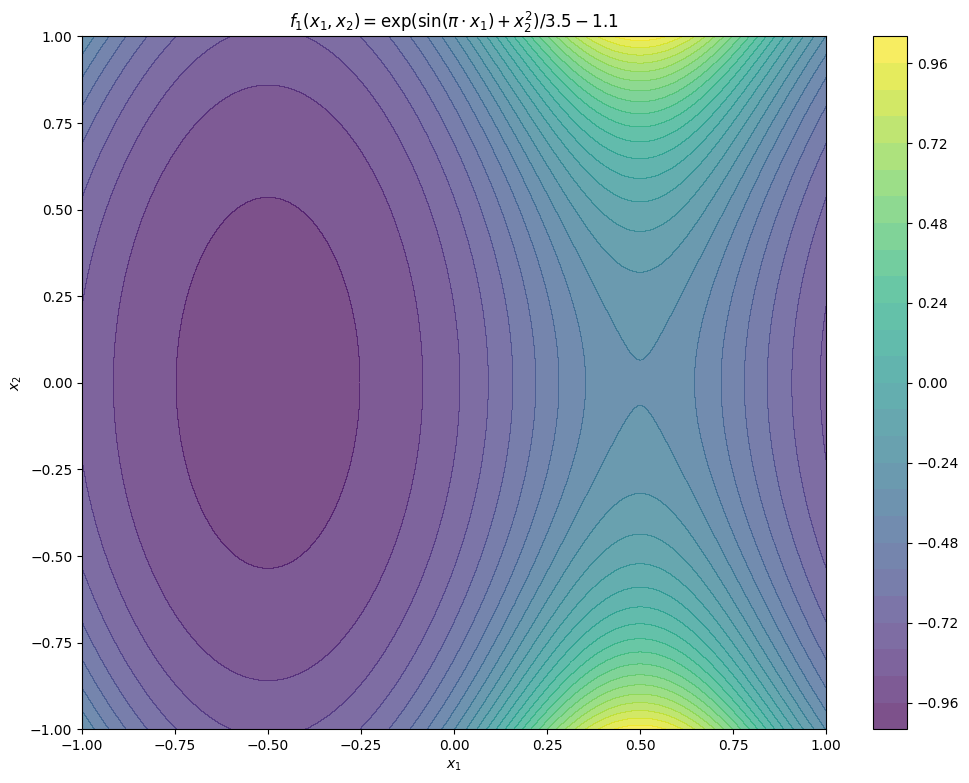

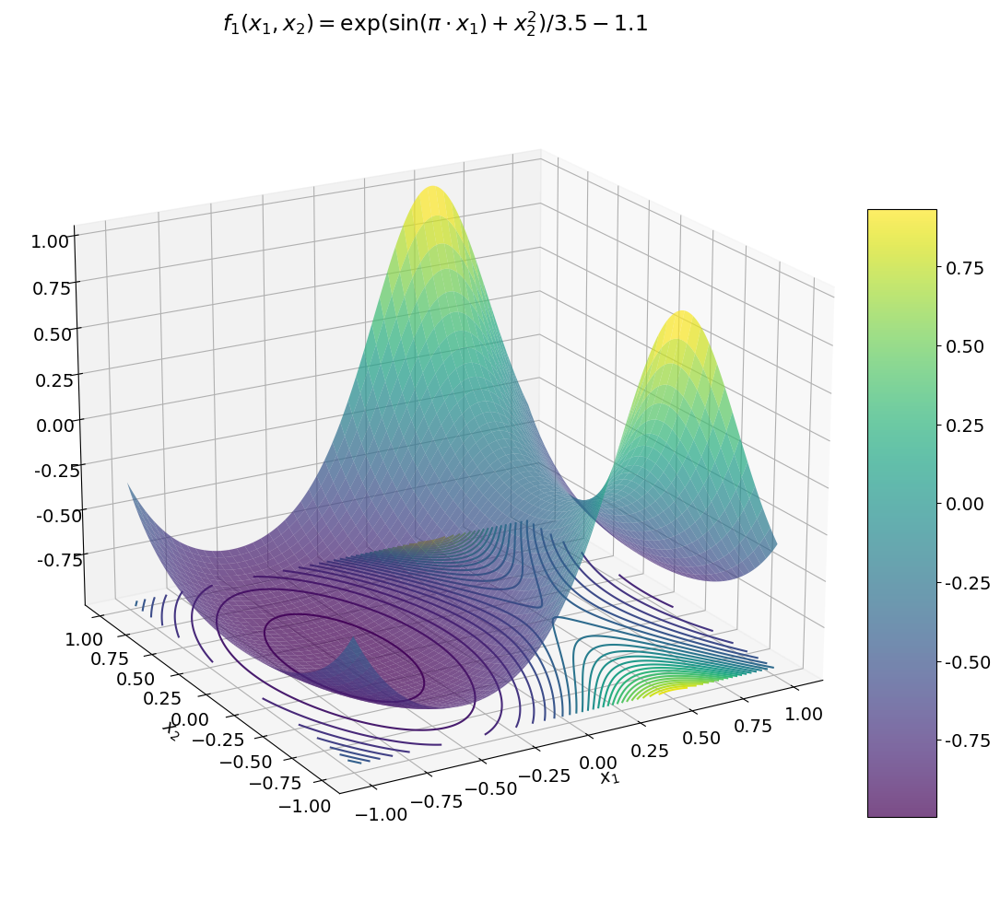

In [3]:
# create dataset
f1 = lambda x: torch.exp(torch.sin(torch.pi*x[:,[0]]) + x[:,[1]]**2) / 3.5 - 1.1
dataset1 = create_dataset(f1, n_var=2, device=device)

f = f1
dataset = dataset1

plot_f_2d(f1, title='$f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')
plot_f_3d(f1, title='$f_1(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')

-----
### MLP on $f_1$

№ model trainable params: 216


| train_loss: 6.81e-03 | test_loss: 1.05e-02 | reg: 9.25e+01 | : 100%|█| 100/100 [00:03<00:00, 28.52


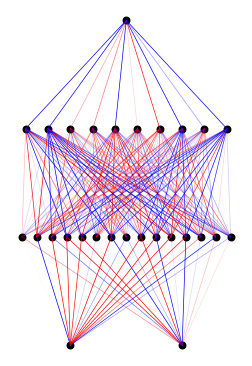

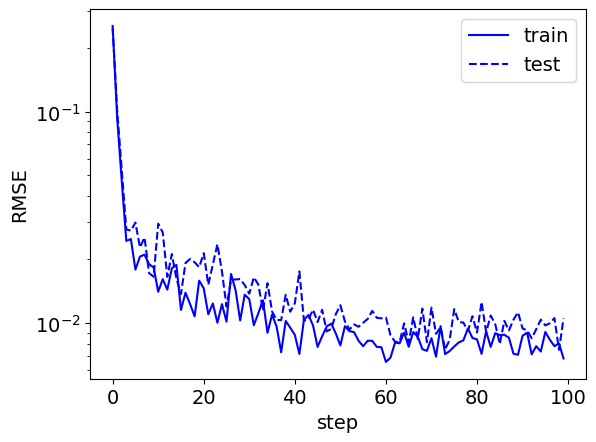

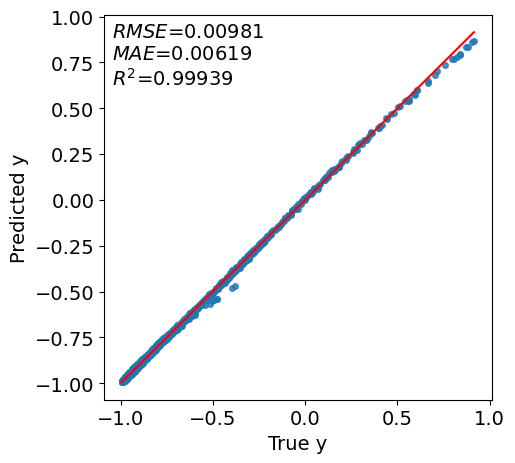

(0.00981393363326788, 0.006185036618262529, 0.9993919134140015)

In [29]:
# initialize MLP
model = MLP(width=[2,15,10,1], seed=2, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb = 0, batch=250)
kan_summary_after_fit(model, dataset, results)

№ model trainable params: 216


| train_loss: 1.47e-02 | test_loss: 1.32e-02 | reg: 9.59e+01 | : 100%|█| 10000/10000 [00:32<00:00, 3


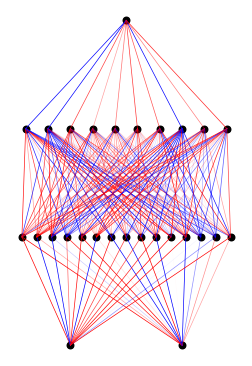

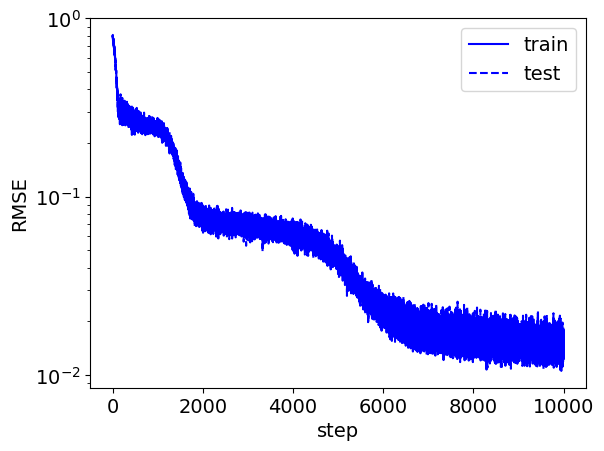

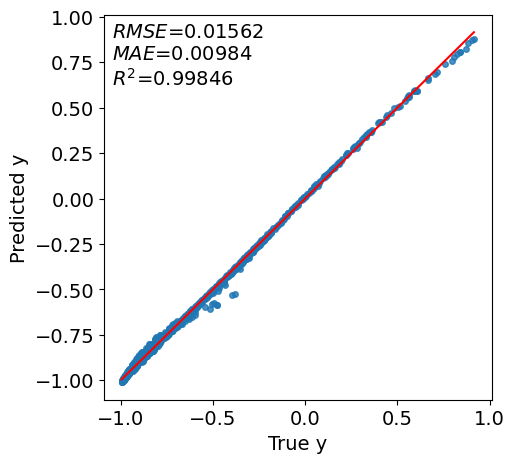

(0.01562317181378603, 0.009842832572758198, 0.998458981513977)

In [30]:
# initialize MLP
model = MLP(width=[2,15,10,1], seed=2, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=10000, batch=250, opt='Adam', lr=1e-3)
kan_summary_after_fit(model, dataset, results)

| train_loss: 1.71e-02 | test_loss: 1.51e-02 | reg: 9.59e+01 | : 100%|█| 1000/1000 [00:02<00:00, 335


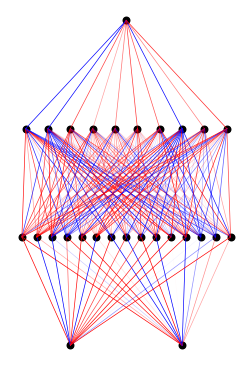

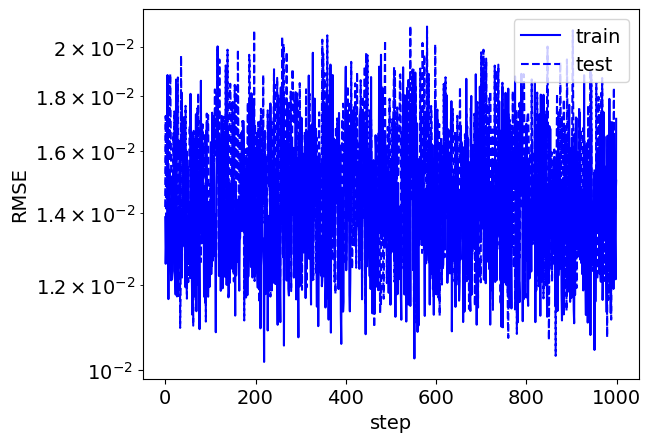

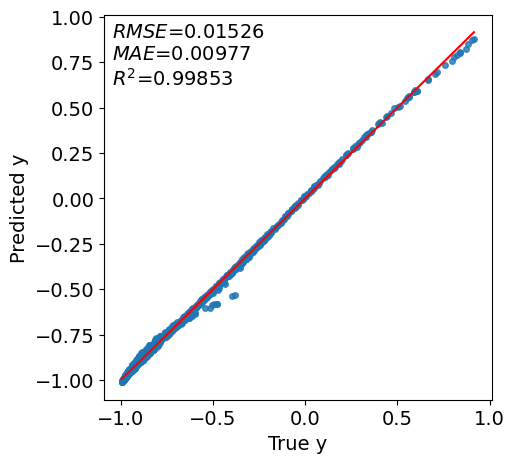

(0.015263267792761326, 0.009771588258445263, 0.9985291957855225)

In [31]:
results = model.fit(dataset, steps=1000, batch=250, opt='Adam', lr=1e-5)
kan_summary_after_fit(model, dataset, results)

| train_loss: 1.42e-02 | test_loss: 1.63e-02 | reg: 1.09e+02 | : 100%|█| 1000/1000 [00:01<00:00, 652


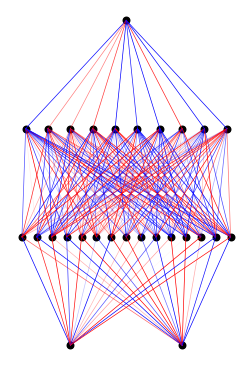

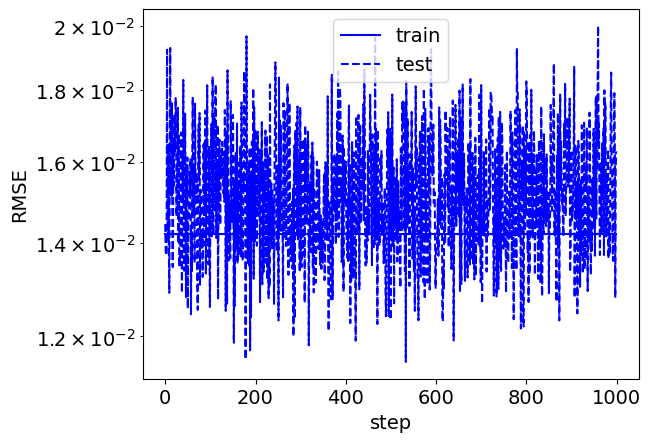

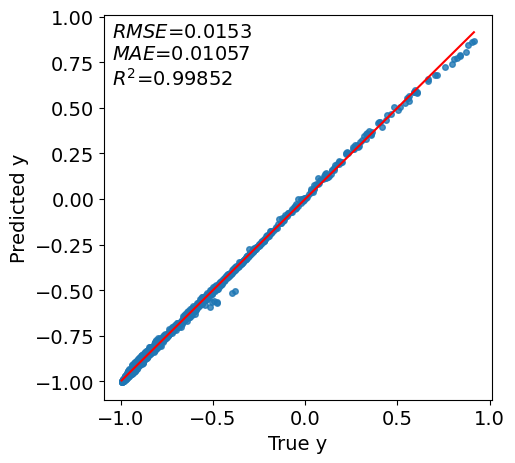

(0.015300042927265167, 0.010574981570243835, 0.9985221028327942)

In [24]:
results = model.fit(dataset, steps=1000, batch=250, opt='BFGS', lr=1e-1)
kan_summary_after_fit(model, dataset, results)

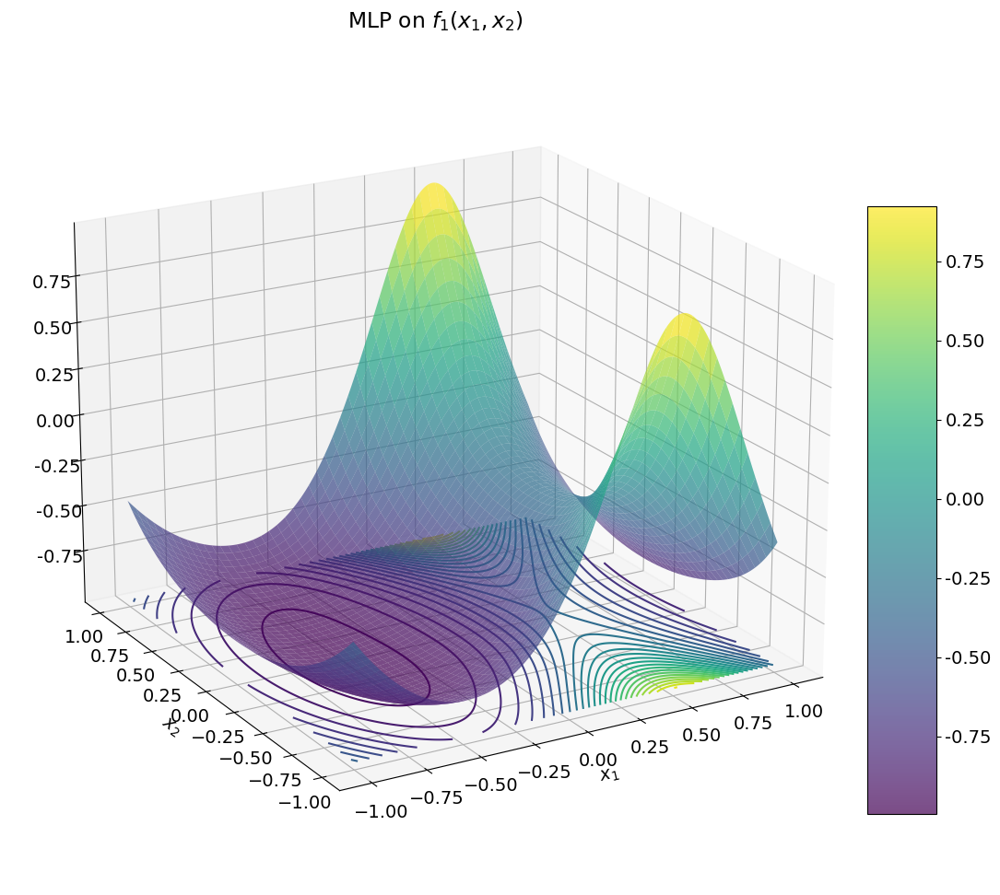

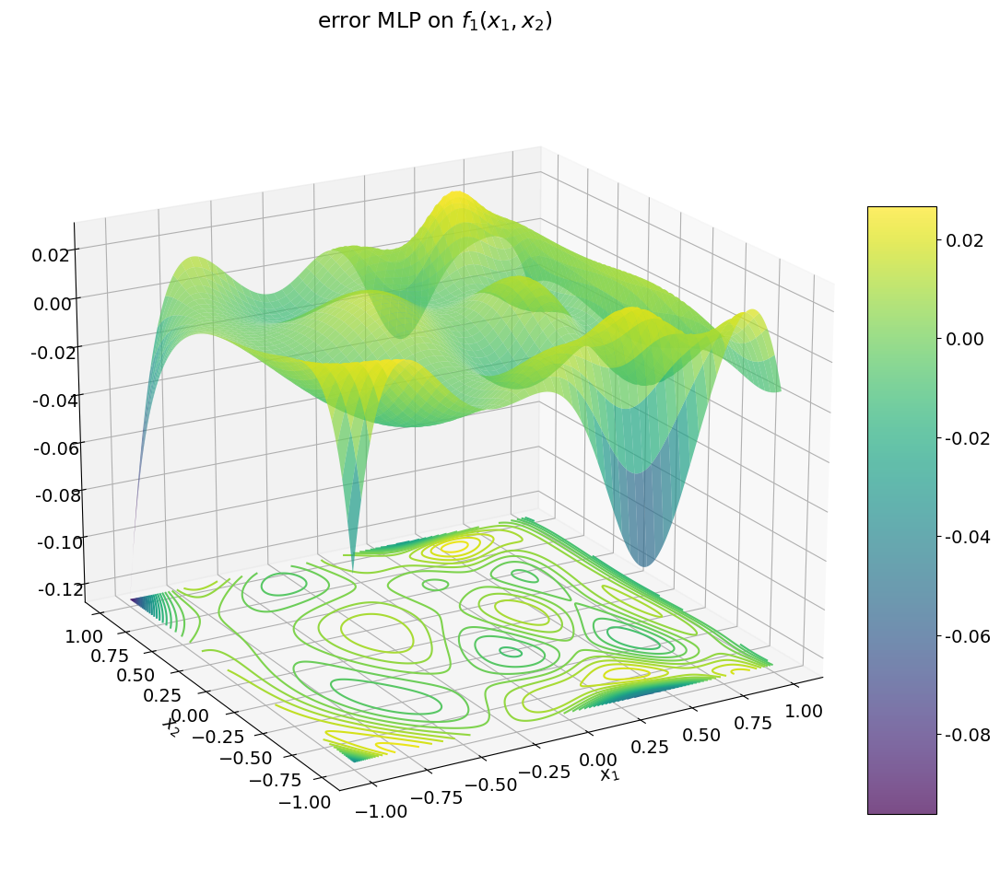

In [4]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='MLP on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error MLP on $f_1(x_1, x_2)$')

#### Getting statistics

| train_loss: 4.78e-03 | test_loss: 5.35e-03 | reg: 1.15e+02 | : 100%|█| 15000/15000 [01:17<00:00, 1


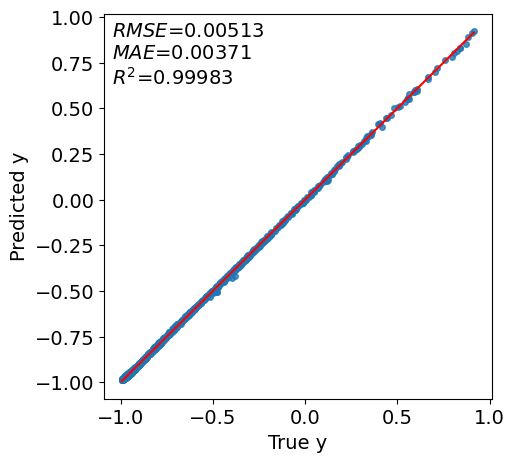

| train_loss: 1.18e-02 | test_loss: 1.22e-02 | reg: 1.13e+02 | : 100%|█| 15000/15000 [01:13<00:00, 2


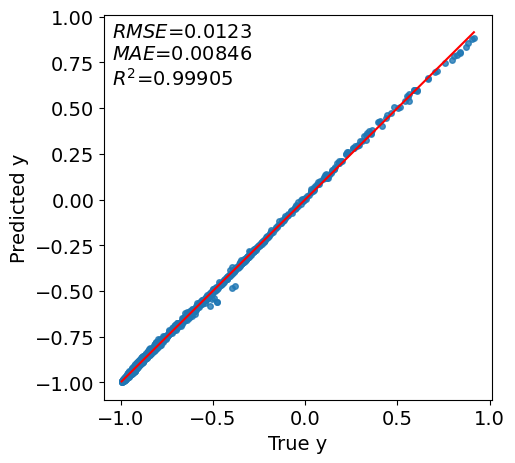

| train_loss: 1.24e-02 | test_loss: 1.61e-02 | reg: 9.88e+01 | : 100%|█| 15000/15000 [01:13<00:00, 2


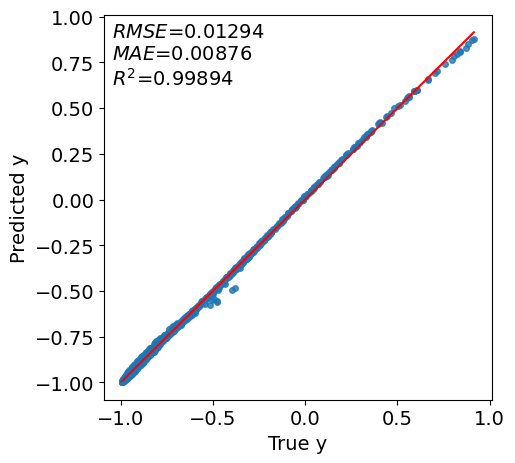

| train_loss: 8.73e-03 | test_loss: 9.87e-03 | reg: 1.10e+02 | : 100%|█| 15000/15000 [01:19<00:00, 1


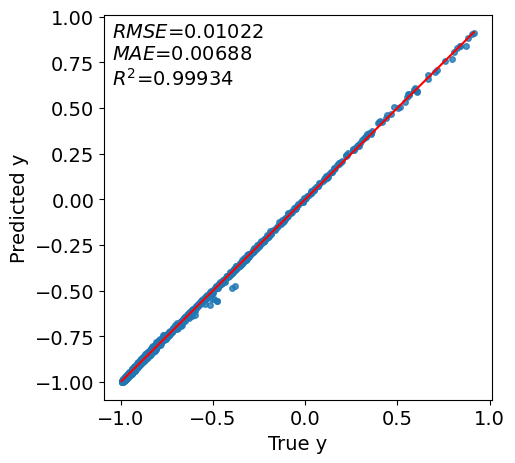

| train_loss: 1.25e-02 | test_loss: 1.72e-02 | reg: 1.05e+02 | : 100%|█| 15000/15000 [01:19<00:00, 1


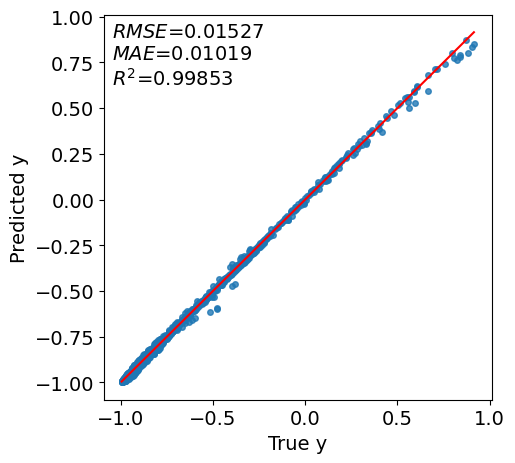

| train_loss: 4.01e-03 | test_loss: 3.76e-03 | reg: 1.00e+02 | : 100%|█| 15000/15000 [01:23<00:00, 1


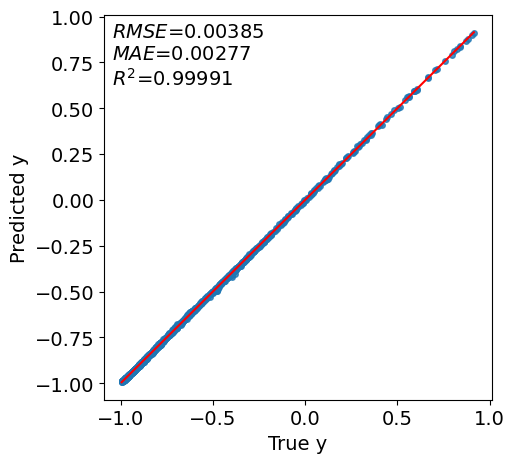

| train_loss: 1.53e-02 | test_loss: 1.44e-02 | reg: 1.12e+02 | : 100%|█| 15000/15000 [01:25<00:00, 1


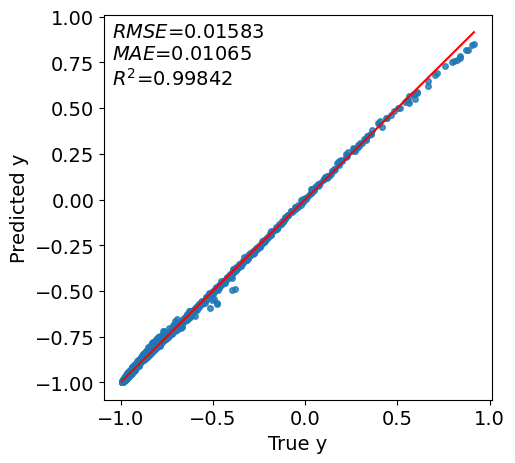

| train_loss: 1.16e-02 | test_loss: 1.51e-02 | reg: 1.14e+02 | : 100%|█| 15000/15000 [01:48<00:00, 1


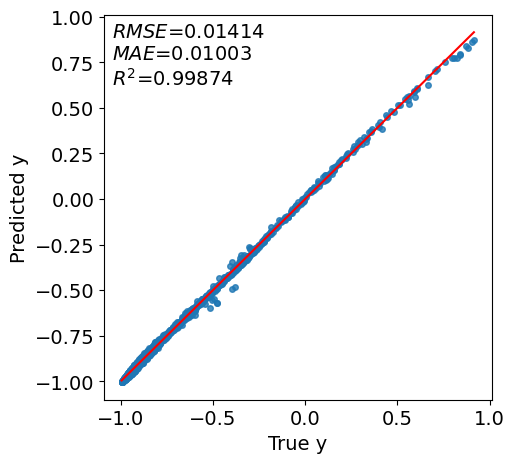

| train_loss: 1.17e-02 | test_loss: 1.26e-02 | reg: 1.07e+02 | : 100%|█| 15000/15000 [01:30<00:00, 1


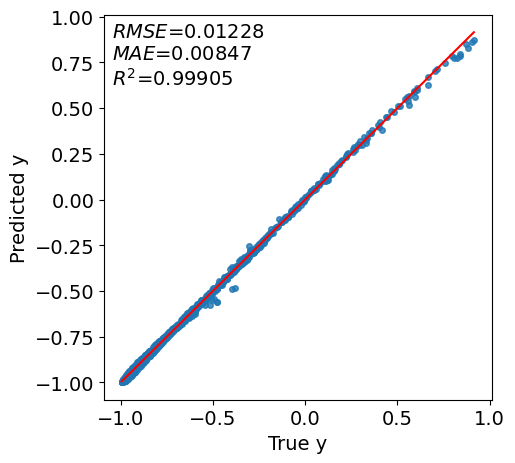

| train_loss: 1.17e-02 | test_loss: 1.01e-02 | reg: 9.99e+01 | : 100%|█| 15000/15000 [01:43<00:00, 1


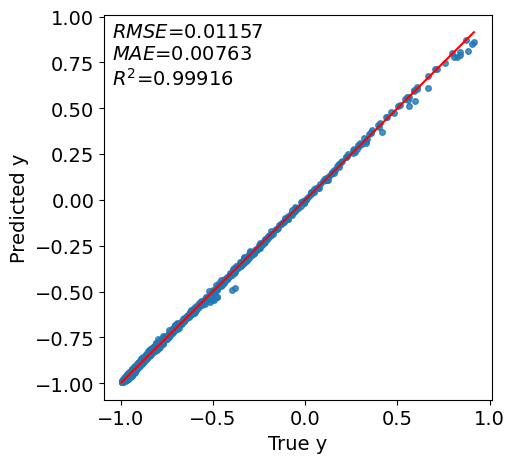

| train_loss: 1.13e-02 | test_loss: 1.26e-02 | reg: 9.93e+01 | : 100%|█| 15000/15000 [01:29<00:00, 1


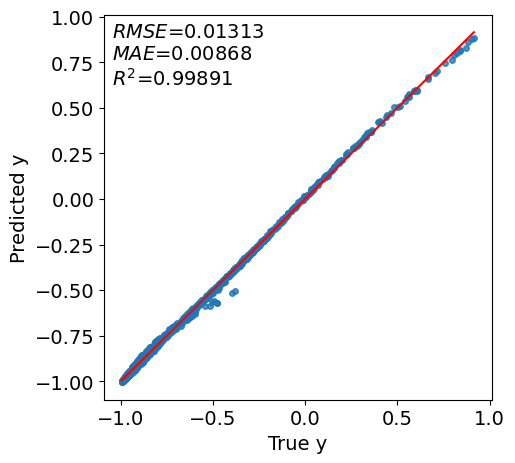

| train_loss: 8.08e-03 | test_loss: 7.72e-03 | reg: 1.02e+02 | : 100%|█| 15000/15000 [01:43<00:00, 1


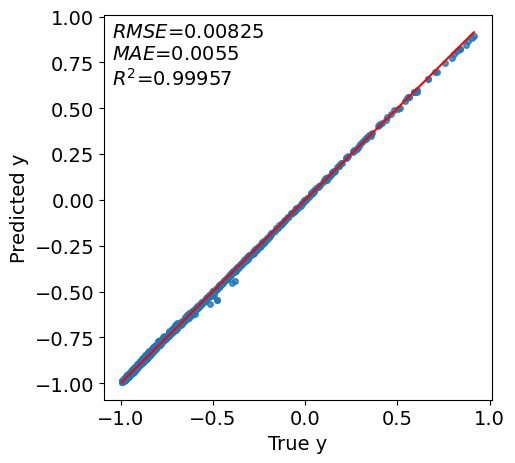

| train_loss: 4.57e-03 | test_loss: 4.24e-03 | reg: 1.03e+02 | : 100%|█| 15000/15000 [01:38<00:00, 1


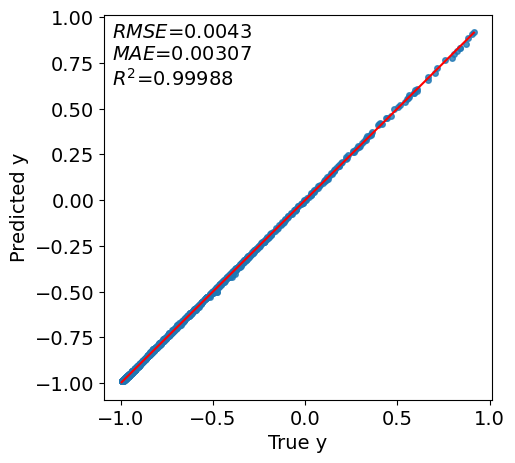

| train_loss: 1.36e-02 | test_loss: 1.33e-02 | reg: 1.09e+02 | : 100%|█| 15000/15000 [01:38<00:00, 1


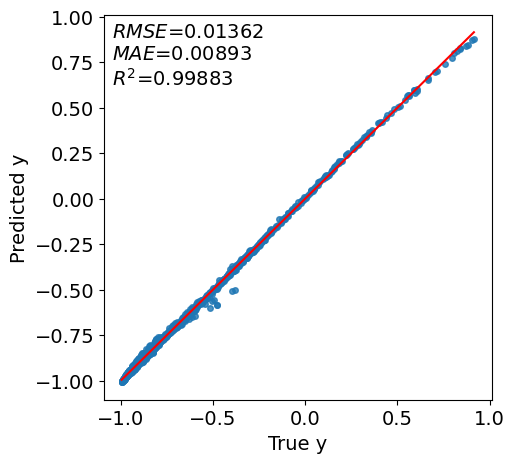

| train_loss: 6.34e-03 | test_loss: 7.64e-03 | reg: 1.08e+02 | : 100%|█| 15000/15000 [01:45<00:00, 1


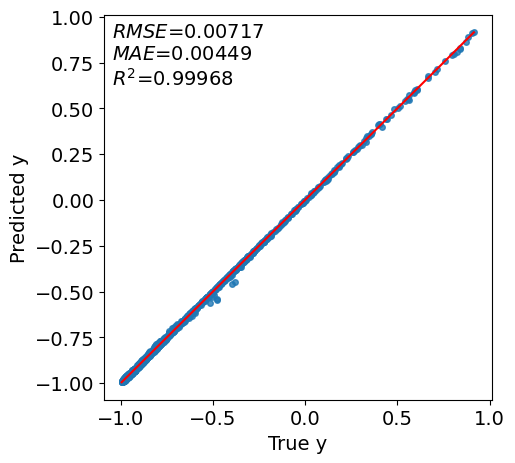

| train_loss: 6.86e-03 | test_loss: 7.10e-03 | reg: 1.09e+02 | : 100%|█| 15000/15000 [01:36<00:00, 1


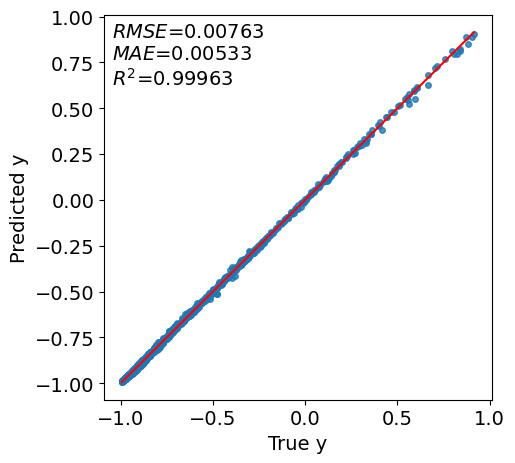

| train_loss: 1.08e-02 | test_loss: 9.22e-03 | reg: 1.14e+02 | : 100%|█| 15000/15000 [01:39<00:00, 1


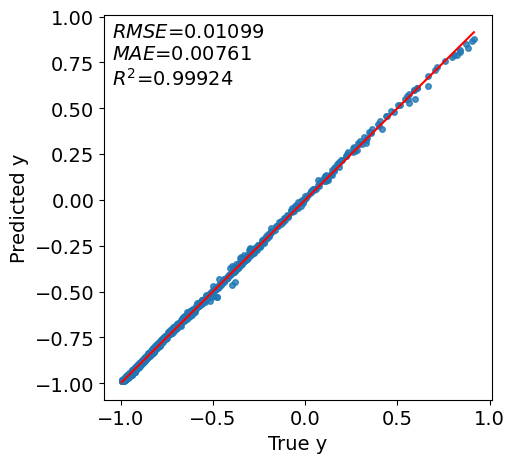

| train_loss: 6.33e-03 | test_loss: 6.31e-03 | reg: 1.17e+02 | : 100%|█| 15000/15000 [01:42<00:00, 1


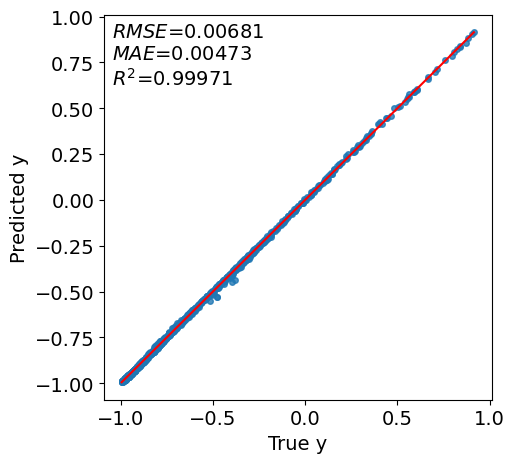

| train_loss: 4.41e-03 | test_loss: 5.43e-03 | reg: 1.06e+02 | : 100%|█| 15000/15000 [01:41<00:00, 1


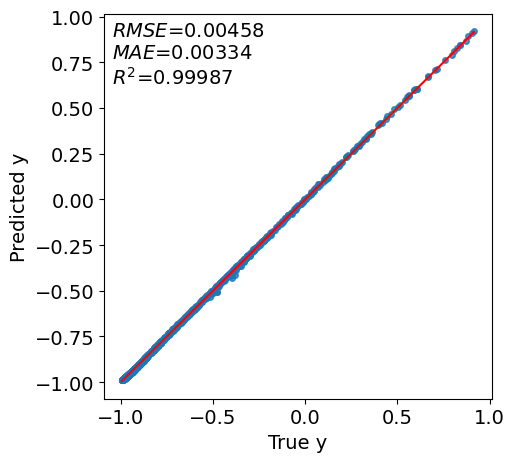

| train_loss: 4.62e-03 | test_loss: 4.42e-03 | reg: 1.05e+02 | : 100%|█| 15000/15000 [01:38<00:00, 1


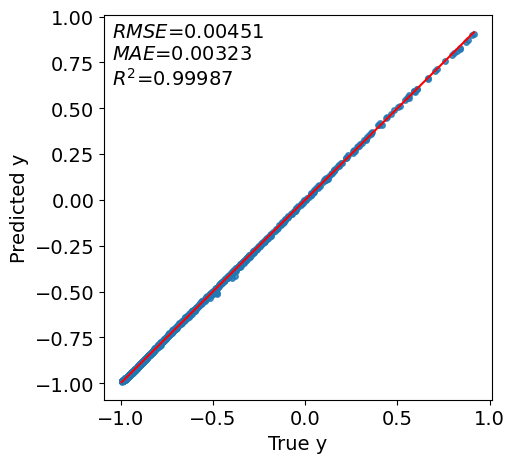

100%|██████████| 20/20 [30:54<00:00, 92.71s/it] 


In [4]:
n_experiments = 20
l_mlp_stats = []

for seed in tqdm(range(n_experiments)):
    # initialize MLP
    model = MLP(width=[2,15,10,1], seed=seed, device=device)
    results = model.fit(dataset, steps=15000, opt='Adam', lamb = 0, batch=250, lr=1e-3)
    
    rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
    l_mlp_stats.append([rmse, mae, r2])
    
df_mlp = pd.DataFrame(l_mlp_stats, columns=['RMSE', 'MAE', 'R2'])
df_mlp.to_csv('f1_stats_results/MLP_stats.csv', index=False)

-----
### KAN on $f_1$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 180


| train_loss: 3.71e-03 | test_loss: 2.58e-03 | reg: 7.21e+00 | : 100%|█| 100/100 [00:24<00:00,  4.15


saving model version 0.1


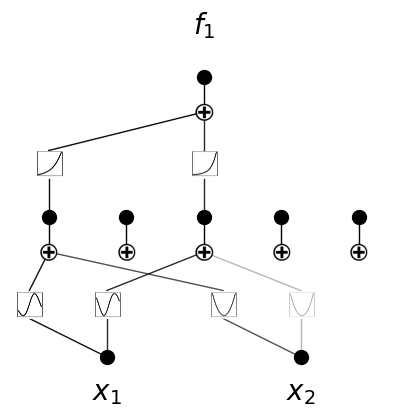

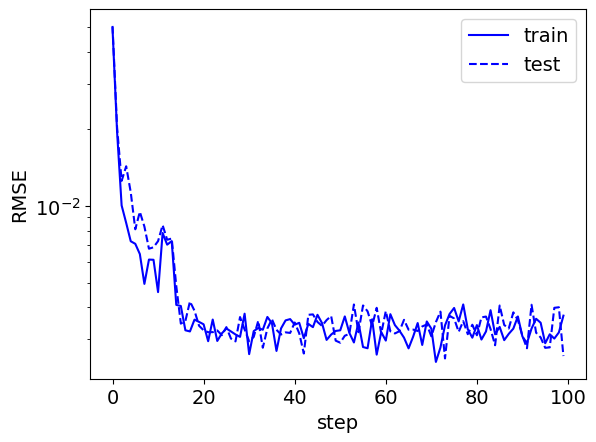

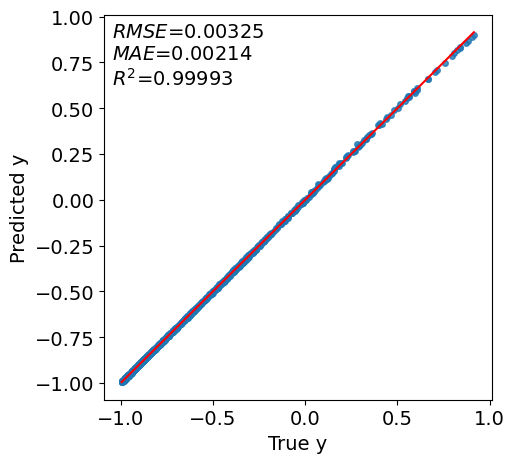

(0.003250247798860073, 0.0021370057947933674, 0.9999333024024963)

In [32]:
# initialize KAN with G=3
model = KAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb=1e-4, update_grid=False, batch=250)
kan_summary_after_fit(model, dataset, results, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 180


description:   0%|                                                        | 0/15000 [00:00<?, ?it/s]

| train_loss: 6.16e-03 | test_loss: 5.33e-03 | reg: 3.94e+00 | : 100%|█| 15000/15000 [06:34<00:00, 3


saving model version 0.1


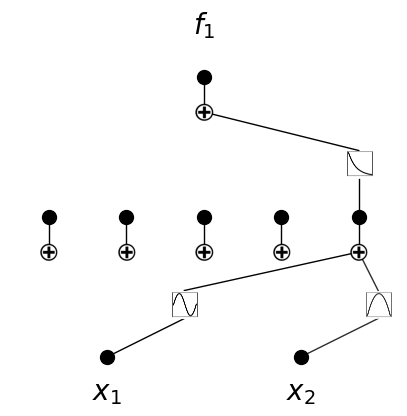

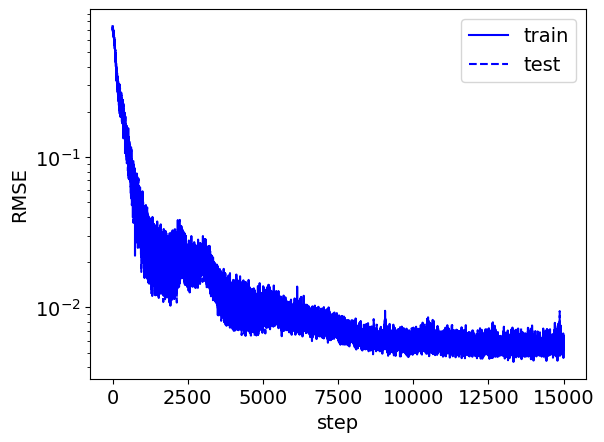

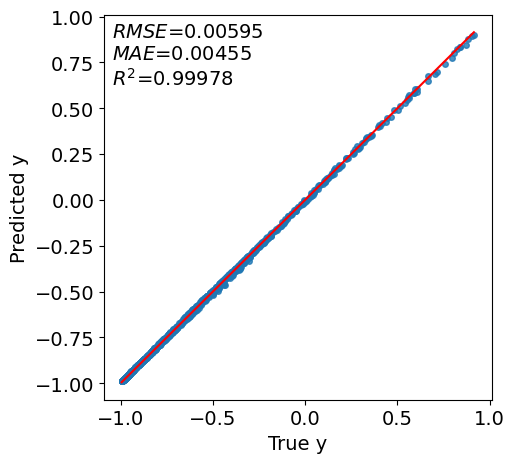

(0.005948843900114298, 0.004547867923974991, 0.9997766017913818)

In [10]:
# initialize KAN with G=3
model = KAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=15000, lamb=1e-3, update_grid=True, batch=250, opt='Adam', lr=1e-3)
kan_summary_after_fit(model, dataset, results, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])

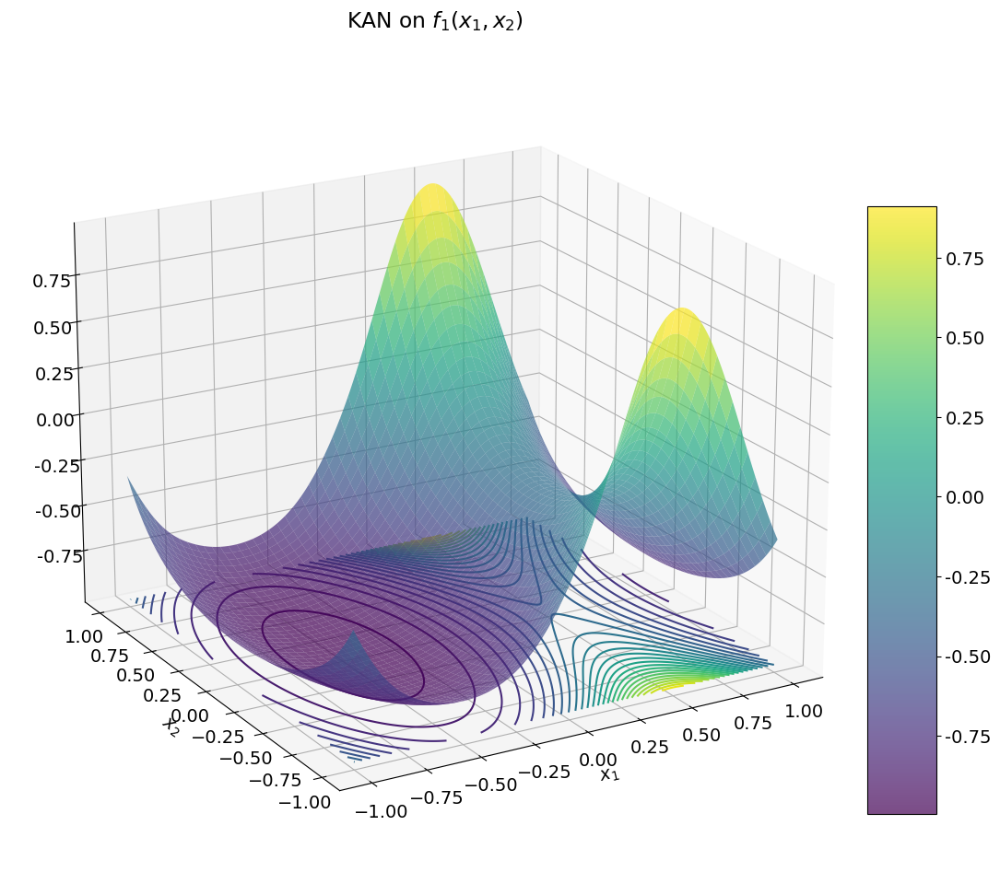

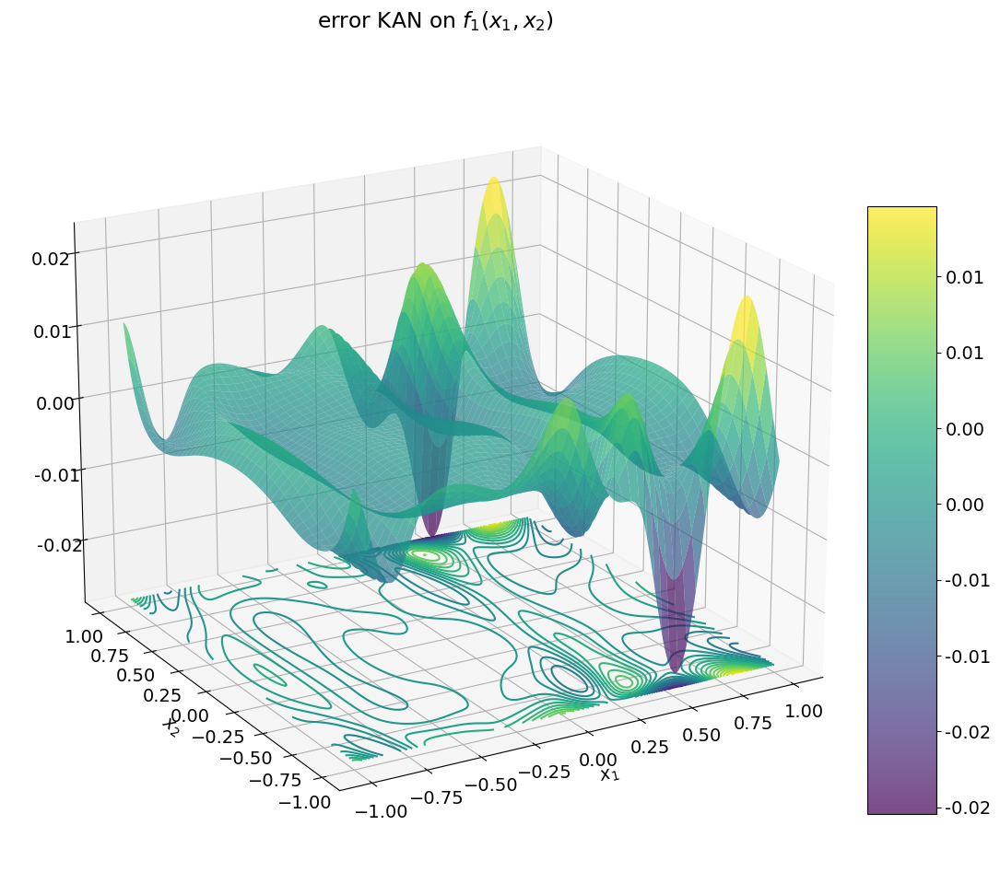

In [6]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error KAN on $f_1(x_1, x_2)$')

#### Getting statistics

  0%|          | 0/20 [00:00<?, ?it/s]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.39e-04 | test_loss: 9.11e-04 | reg: 1.21e+01 | : 100%|█| 15000/15000 [05:18<00:00, 4


saving model version 0.1


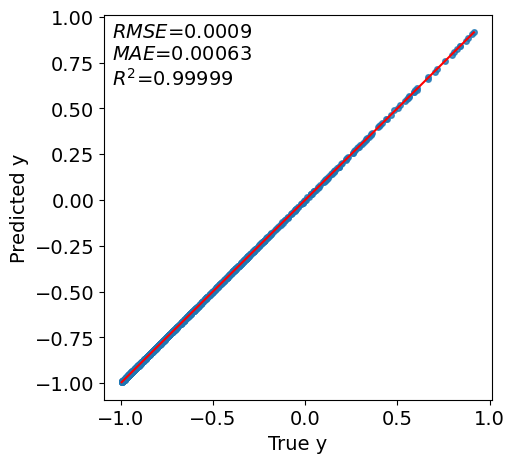

  5%|▌         | 1/20 [05:18<1:41:00, 318.98s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.39e-03 | test_loss: 1.29e-03 | reg: 1.30e+01 | : 100%|█| 15000/15000 [05:08<00:00, 4


saving model version 0.1


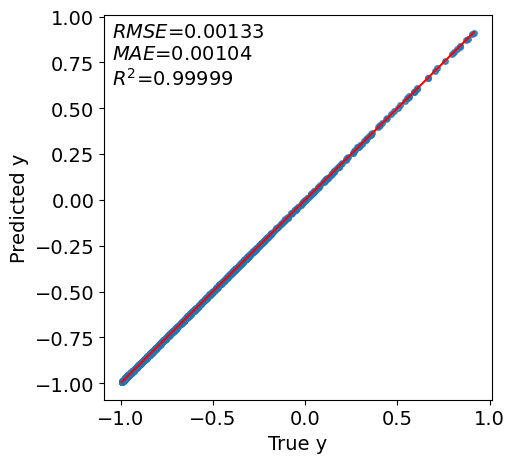

 10%|█         | 2/20 [10:27<1:33:50, 312.79s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.70e-04 | test_loss: 1.49e-03 | reg: 1.21e+01 | : 100%|█| 15000/15000 [05:13<00:00, 4


saving model version 0.1


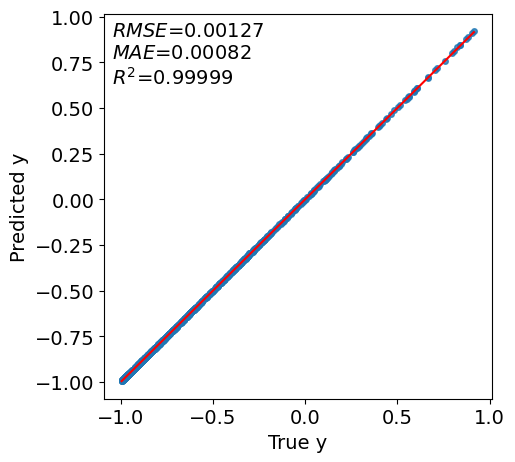

 15%|█▌        | 3/20 [15:41<1:28:48, 313.42s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.32e-04 | test_loss: 9.40e-04 | reg: 1.23e+01 | : 100%|█| 15000/15000 [05:18<00:00, 4


saving model version 0.1


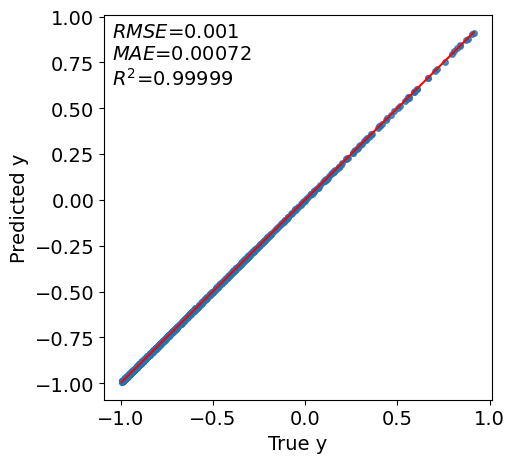

 20%|██        | 4/20 [21:00<1:24:09, 315.61s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.22e-03 | test_loss: 1.40e-03 | reg: 1.38e+01 | : 100%|█| 15000/15000 [05:16<00:00, 4


saving model version 0.1


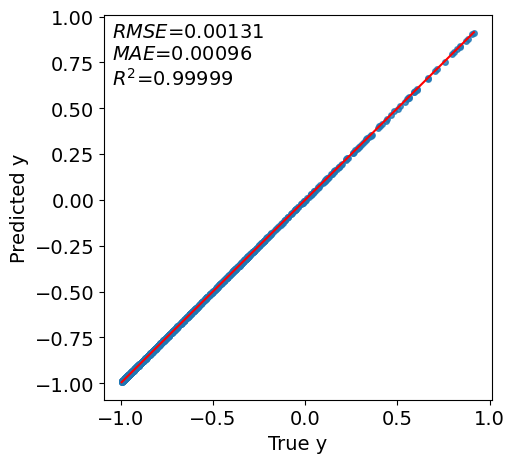

 25%|██▌       | 5/20 [26:17<1:19:02, 316.14s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.53e-04 | test_loss: 8.13e-04 | reg: 1.27e+01 | : 100%|█| 15000/15000 [05:21<00:00, 4


saving model version 0.1


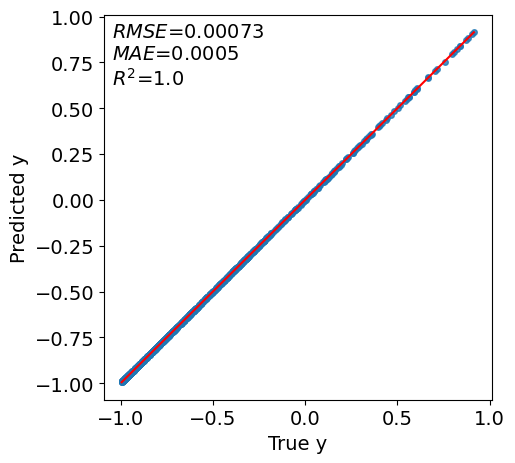

 30%|███       | 6/20 [31:39<1:14:15, 318.24s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.31e-04 | test_loss: 8.45e-04 | reg: 1.14e+01 | : 100%|█| 15000/15000 [05:17<00:00, 4


saving model version 0.1


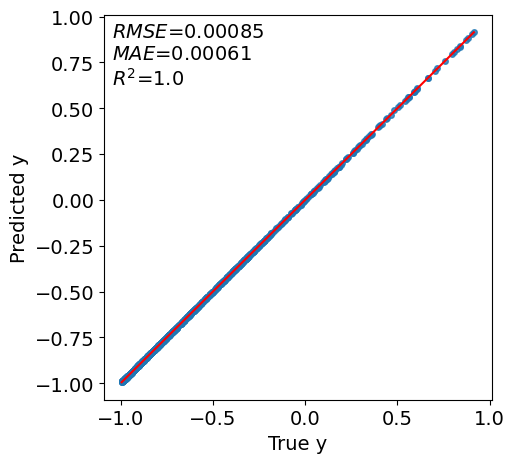

 35%|███▌      | 7/20 [36:57<1:08:54, 318.02s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.80e-03 | test_loss: 1.38e-03 | reg: 1.37e+01 | : 100%|█| 15000/15000 [05:30<00:00, 4


saving model version 0.1


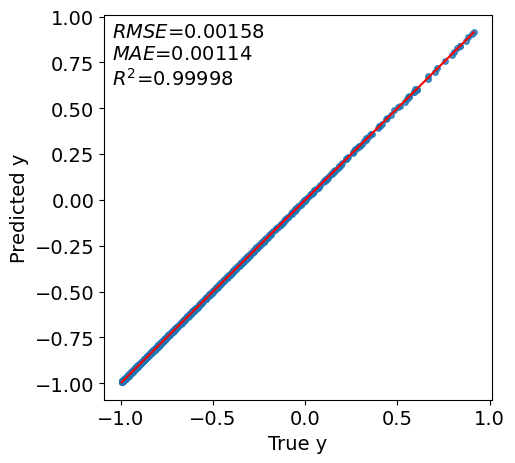

 40%|████      | 8/20 [42:28<1:04:25, 322.09s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.32e-03 | test_loss: 1.13e-03 | reg: 1.29e+01 | : 100%|█| 15000/15000 [05:16<00:00, 4


saving model version 0.1


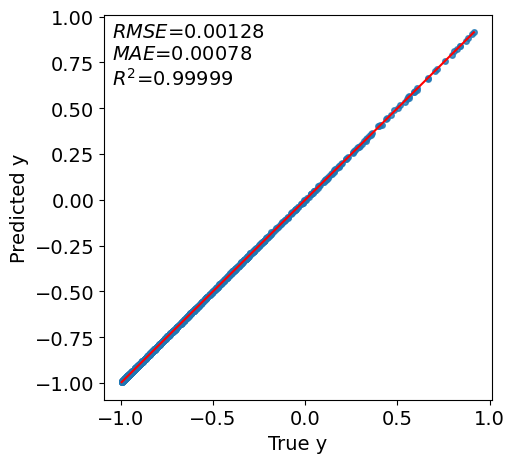

 45%|████▌     | 9/20 [47:44<58:44, 320.39s/it]  

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.43e-04 | test_loss: 8.57e-04 | reg: 1.36e+01 | : 100%|█| 15000/15000 [05:25<00:00, 4


saving model version 0.1


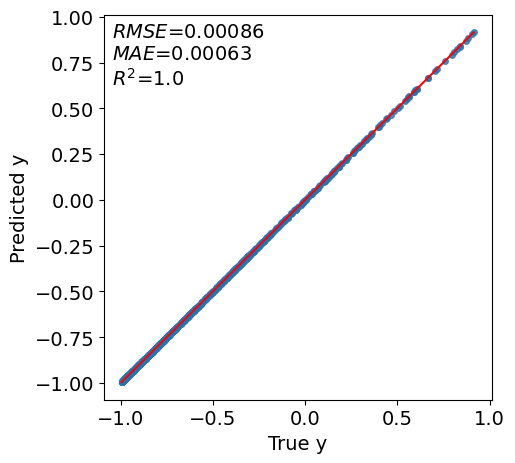

 50%|█████     | 10/20 [53:11<53:41, 322.15s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.37e-03 | test_loss: 1.25e-03 | reg: 1.24e+01 | : 100%|█| 15000/15000 [05:27<00:00, 4


saving model version 0.1


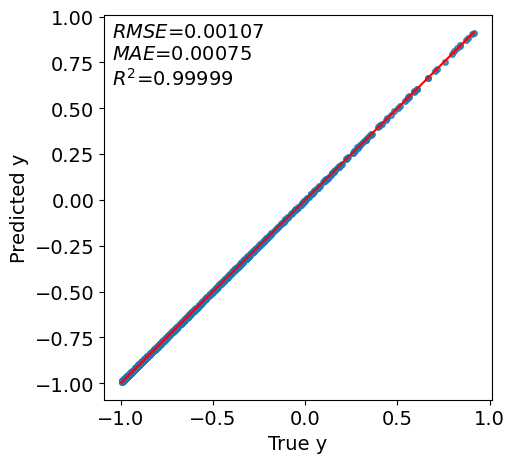

 55%|█████▌    | 11/20 [58:38<48:33, 323.75s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.60e-03 | test_loss: 1.55e-03 | reg: 1.18e+01 | : 100%|█| 15000/15000 [05:20<00:00, 4


saving model version 0.1


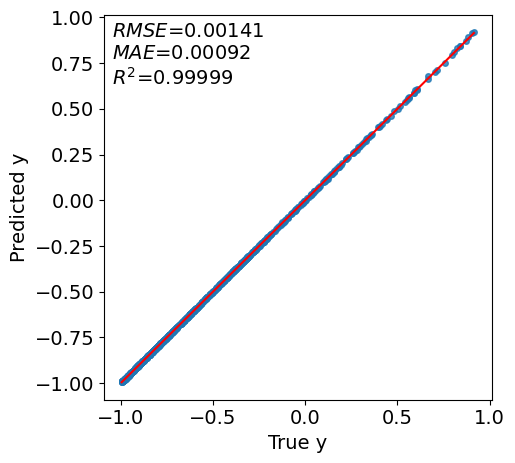

 60%|██████    | 12/20 [1:03:59<43:03, 322.97s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.00e-03 | test_loss: 9.70e-04 | reg: 1.25e+01 | : 100%|█| 15000/15000 [05:27<00:00, 4


saving model version 0.1


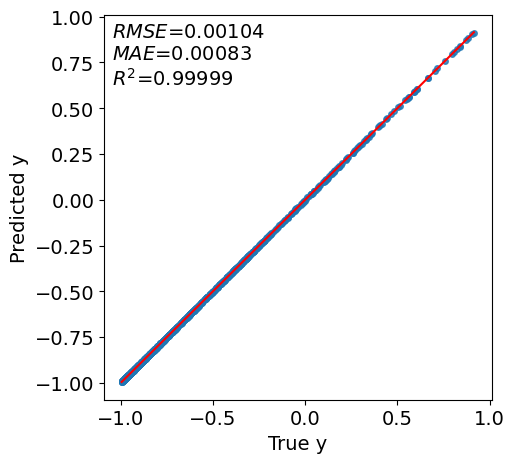

 65%|██████▌   | 13/20 [1:09:27<37:51, 324.55s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.23e-03 | test_loss: 1.36e-03 | reg: 1.34e+01 | : 100%|█| 15000/15000 [05:22<00:00, 4


saving model version 0.1


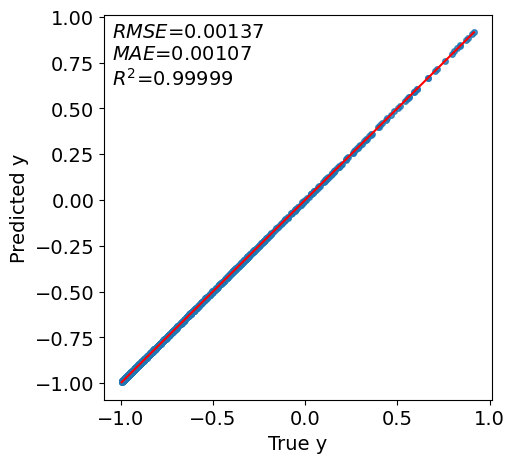

 70%|███████   | 14/20 [1:14:50<32:24, 324.12s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.06e-03 | test_loss: 1.32e-03 | reg: 1.19e+01 | : 100%|█| 15000/15000 [05:18<00:00, 4


saving model version 0.1


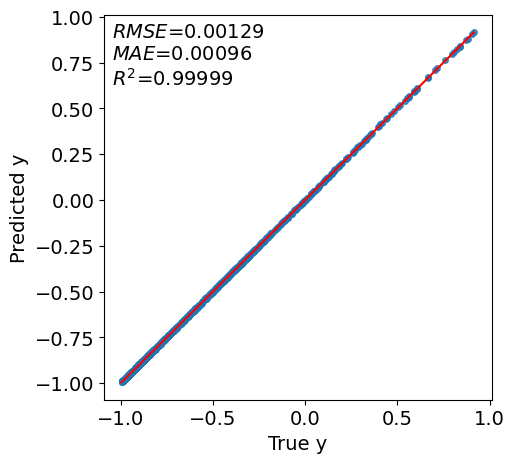

 75%|███████▌  | 15/20 [1:20:09<26:52, 322.55s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.37e-03 | test_loss: 9.05e-04 | reg: 1.28e+01 | : 100%|█| 15000/15000 [05:26<00:00, 4


saving model version 0.1


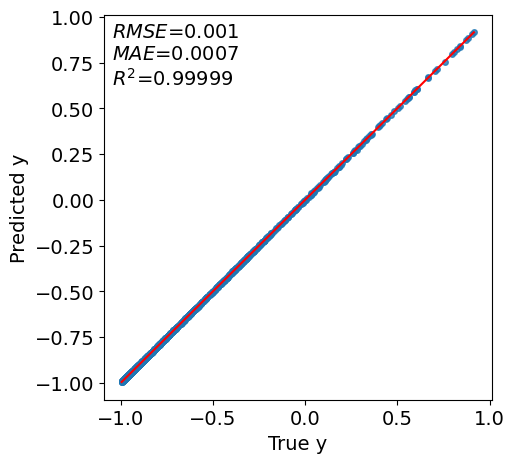

 80%|████████  | 16/20 [1:25:36<21:35, 323.87s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.56e-04 | test_loss: 7.65e-04 | reg: 1.32e+01 | : 100%|█| 15000/15000 [05:17<00:00, 4


saving model version 0.1


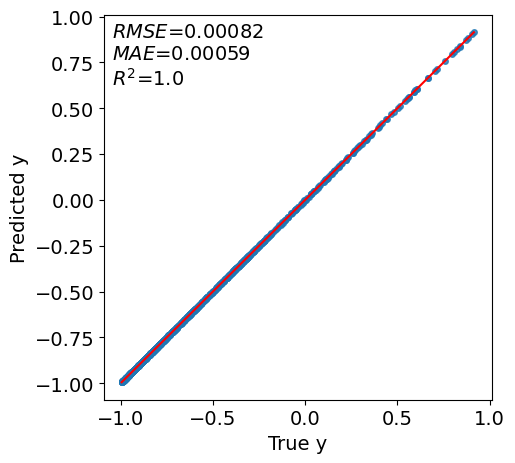

 85%|████████▌ | 17/20 [1:30:55<16:06, 322.19s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.08e-04 | test_loss: 9.21e-04 | reg: 1.24e+01 | : 100%|█| 15000/15000 [05:26<00:00, 4


saving model version 0.1


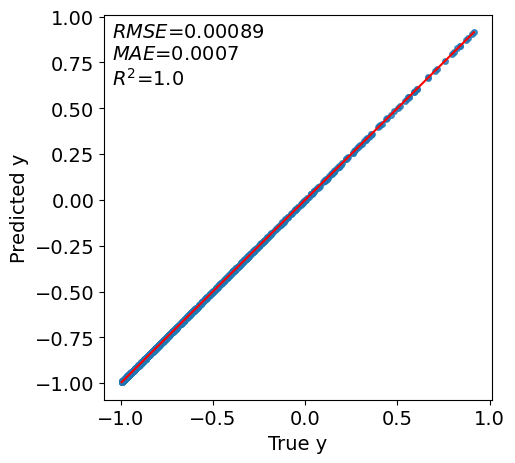

 90%|█████████ | 18/20 [1:36:22<10:47, 323.68s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.02e-03 | test_loss: 1.14e-03 | reg: 1.30e+01 | : 100%|█| 15000/15000 [06:12<00:00, 4


saving model version 0.1


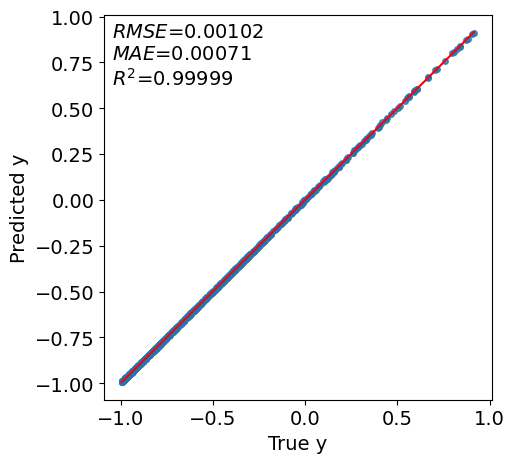

 95%|█████████▌| 19/20 [1:42:35<05:38, 338.47s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.44e-03 | test_loss: 1.46e-03 | reg: 1.22e+01 | : 100%|█| 15000/15000 [09:27<00:00, 2


saving model version 0.1


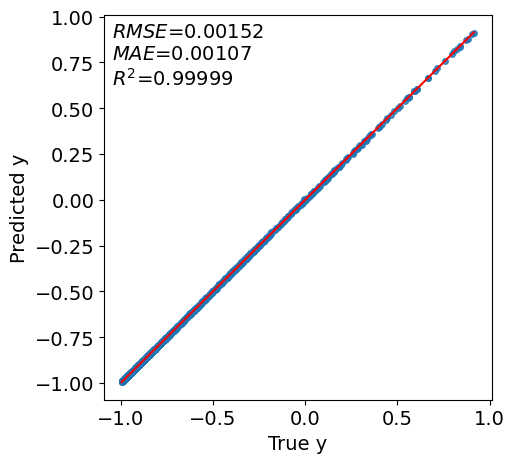

100%|██████████| 20/20 [1:52:03<00:00, 336.16s/it]


In [5]:
n_experiments = 20
l_kan_stats = []

#for seed in tqdm(range(n_experiments)):
for seed in tqdm(range(n_experiments)):
    # initialize KAN
    model = KAN(width=[2,5,1], grid=3, k=3, seed=seed, device=device)
    results = model.fit(dataset, opt='Adam', steps=15000, lr=1e-3, batch=250) #, update_grid=False
    
    rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
    #kan_summary_after_fit(model, dataset, results)
    l_kan_stats.append([rmse, mae, r2])

df_kan = pd.DataFrame(l_kan_stats, columns=['RMSE', 'MAE', 'R2'])
df_kan.to_csv('f1_stats_results/KAN_stats.csv', index=False)

-----
### $\lambda$-KAN on $f_1$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 5.90e-02 | test_loss: 6.39e-02 | reg: 1.58e+01 | : 100%|█| 150/150 [00:37<00:00,  3.98


saving model version 0.1


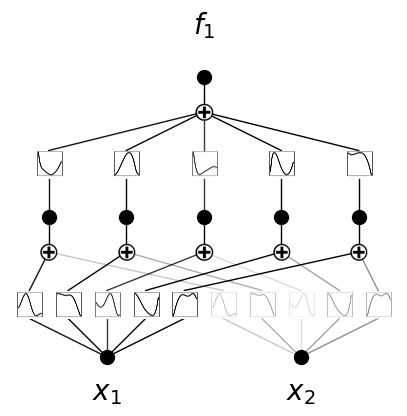

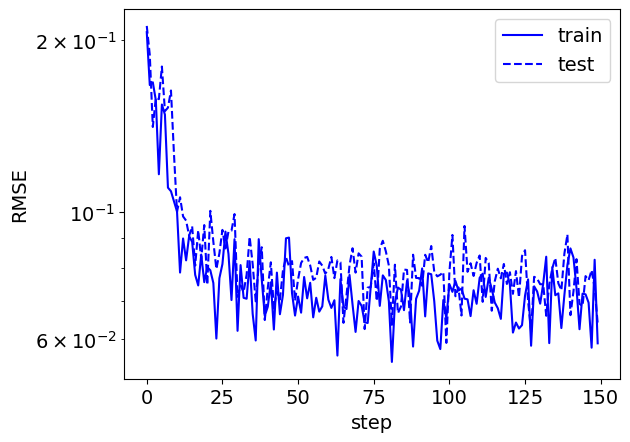

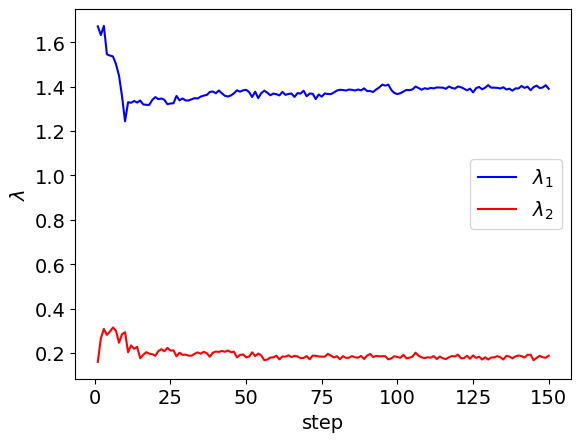

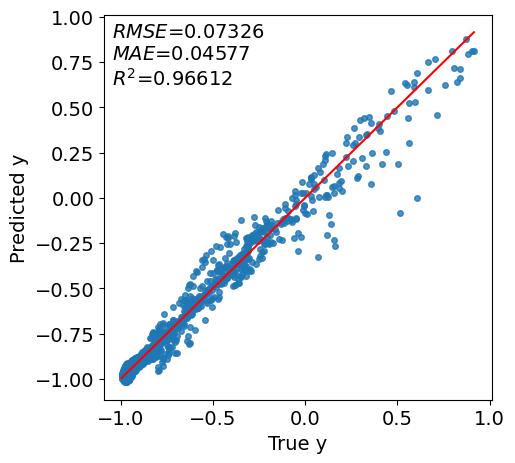

model.act_fun[0].lmd=Parameter containing:
tensor([1.3899, 0.1873], requires_grad=True)


In [4]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])
print(f'{model.act_fun[0].lmd=}')

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                        | 0/10000 [00:00<?, ?it/s]

| train_loss: 8.01e-02 | test_loss: 7.12e-02 | reg: 1.67e+01 | : 100%|█| 10000/10000 [02:56<00:00, 5


saving model version 0.1


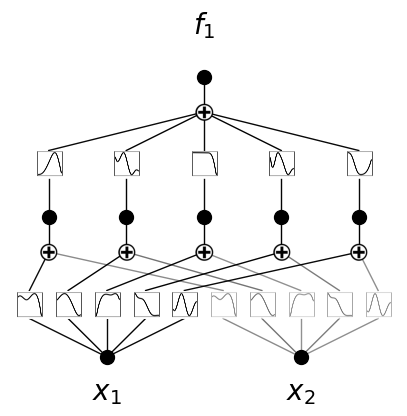

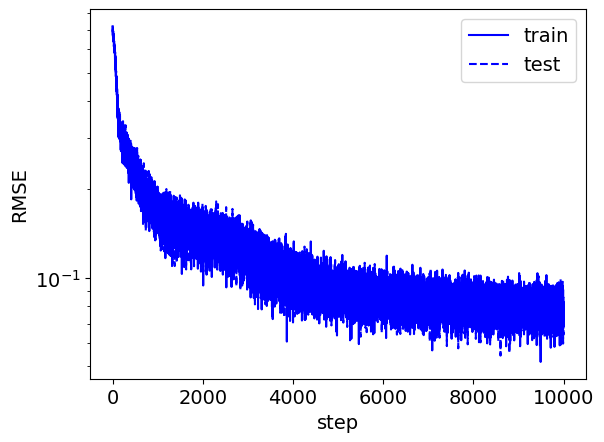

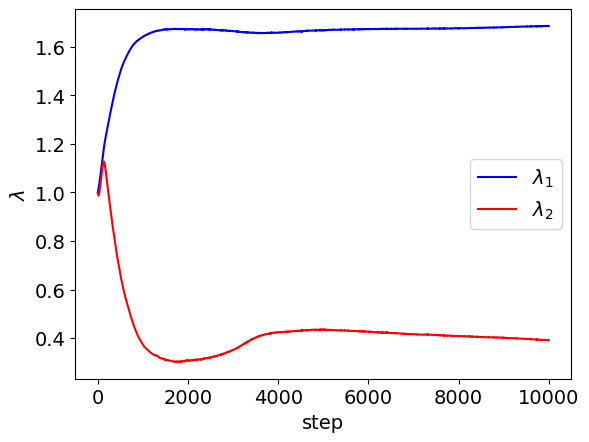

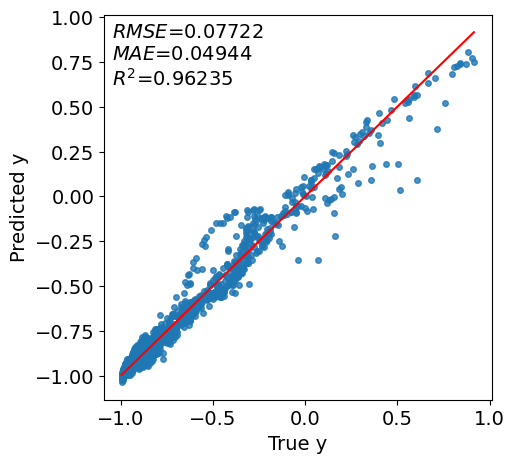

model.act_fun[0].lmd=Parameter containing:
tensor([1.6862, 0.3912], requires_grad=True)


In [3]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=10000, lamb = 1e-5, 
                    batch=250,
                    opt='Adam', lr=1e-3)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:24, 30.74it/s]                         


module of Input importance:


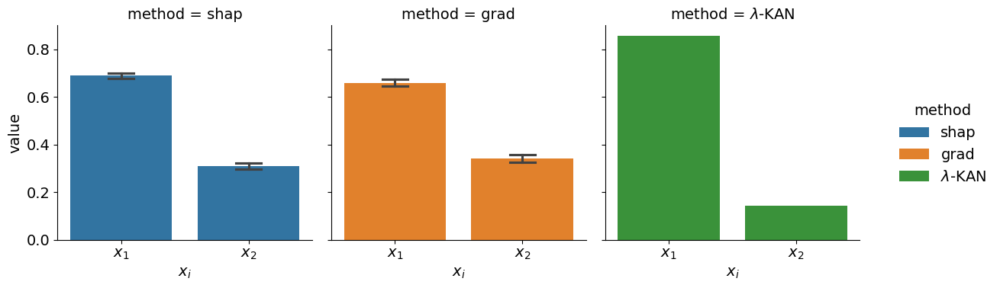

Input importance:


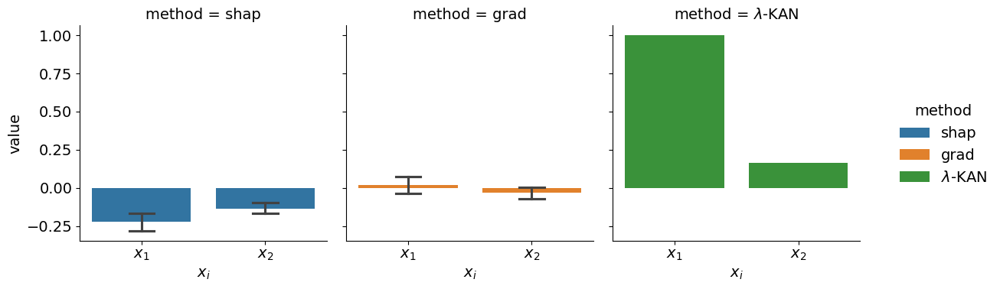

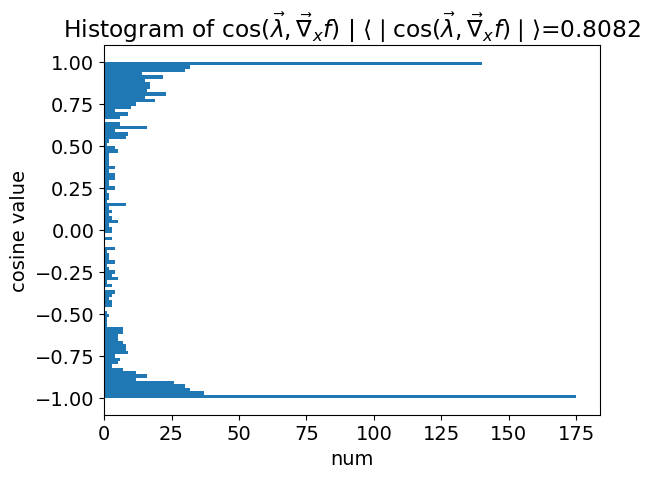

In [8]:
importance_analyse_lmdKAN(model, dataset)

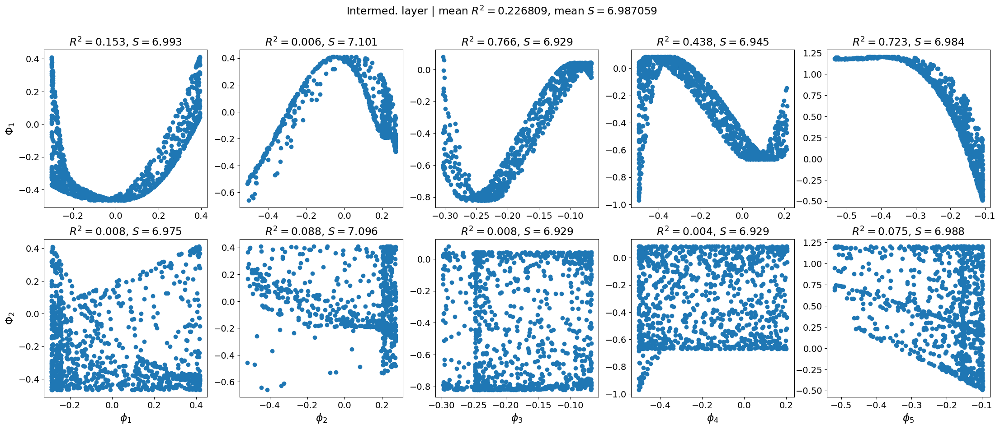

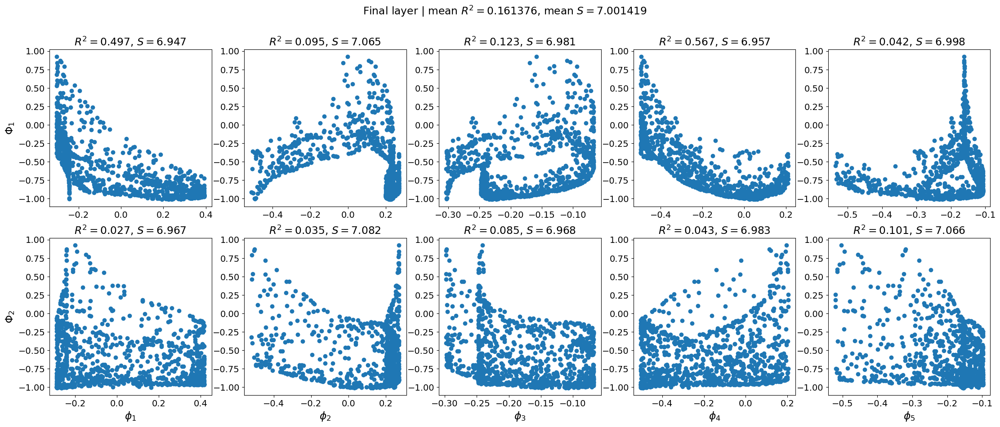

{'mean_r2': 0.1613756265491247, 'mean_matrix_entropy': 7.0014190673828125}

In [9]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

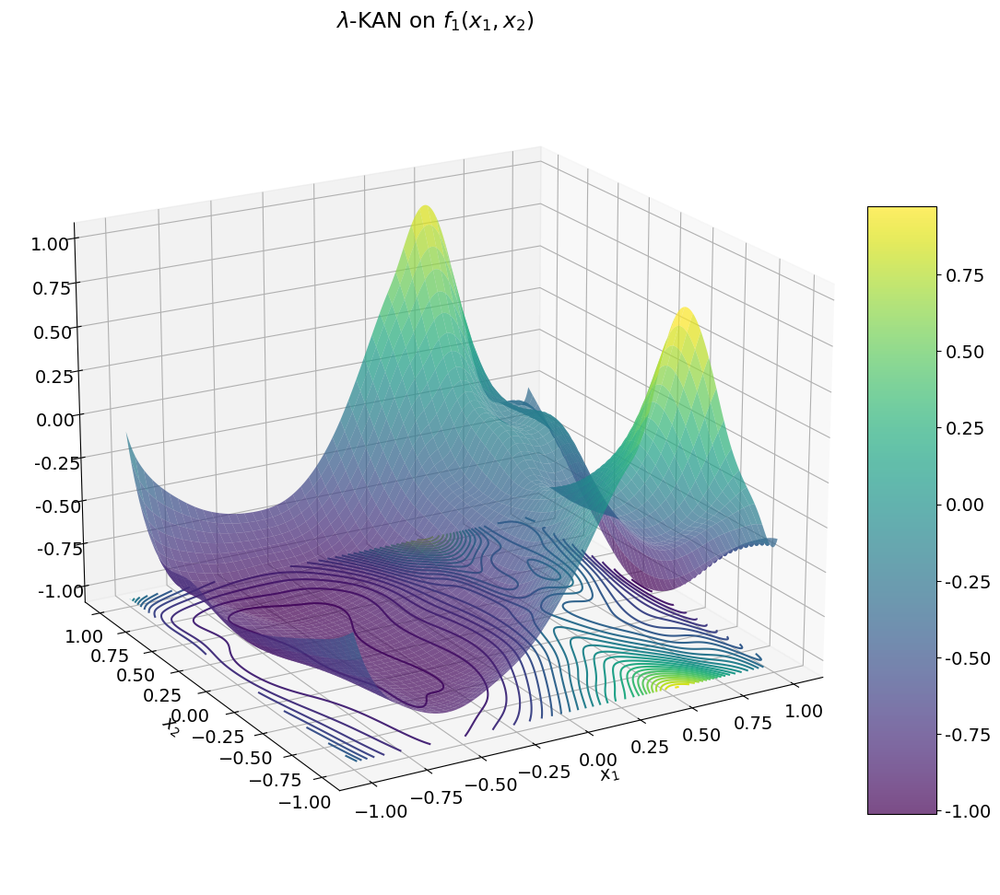

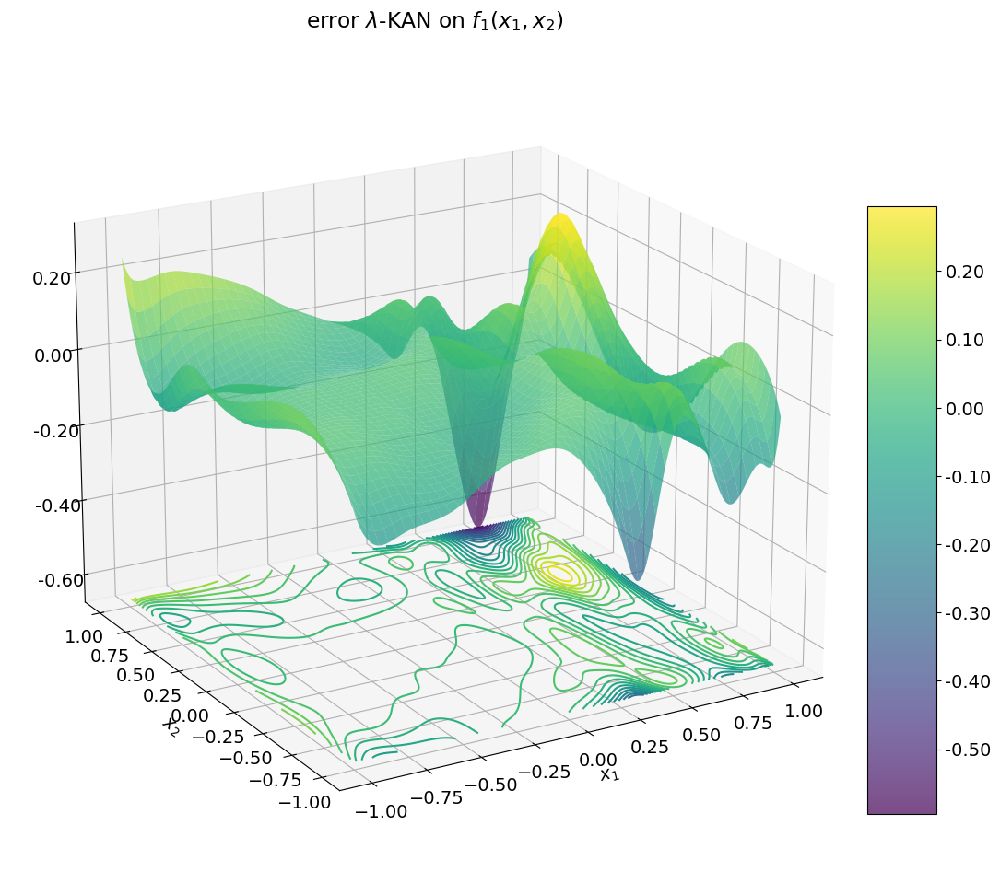

In [10]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

#### Getting statistics

  0%|          | 0/20 [00:00<?, ?it/s]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.49e-02 | test_loss: 9.09e-02 | reg: 2.05e+01 | : 100%|█| 15000/15000 [03:34<00:00, 7


saving model version 0.1


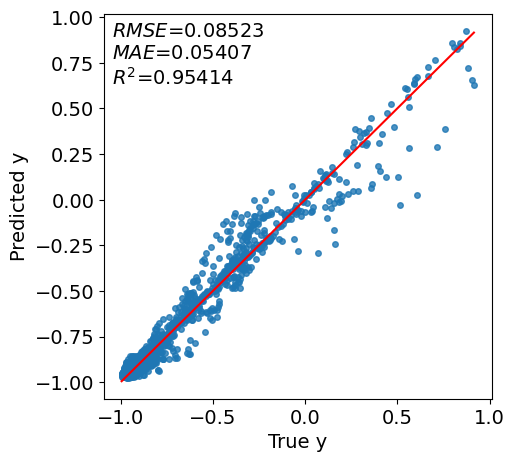

  5%|▌         | 1/20 [03:34<1:07:54, 214.47s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.90e-02 | test_loss: 7.03e-02 | reg: 2.03e+01 | : 100%|█| 15000/15000 [04:20<00:00, 5


saving model version 0.1


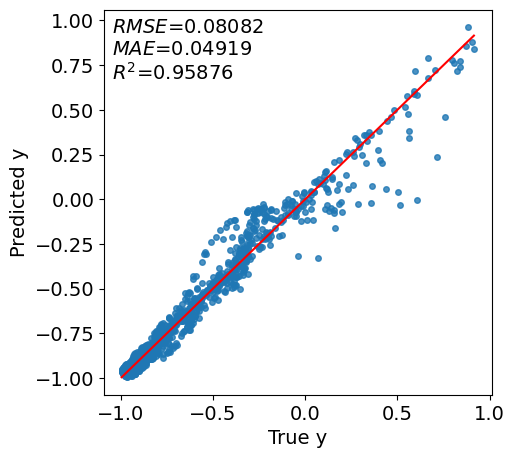

 10%|█         | 2/20 [07:55<1:12:30, 241.71s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.63e-02 | test_loss: 7.13e-02 | reg: 1.96e+01 | : 100%|█| 15000/15000 [04:32<00:00, 5


saving model version 0.1


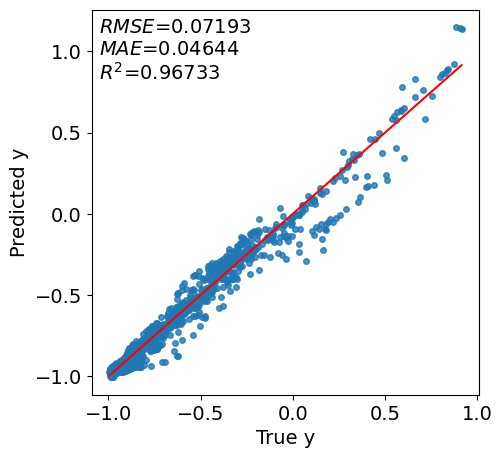

 15%|█▌        | 3/20 [12:27<1:12:28, 255.77s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.70e-02 | test_loss: 8.75e-02 | reg: 1.99e+01 | : 100%|█| 15000/15000 [04:43<00:00, 5


saving model version 0.1


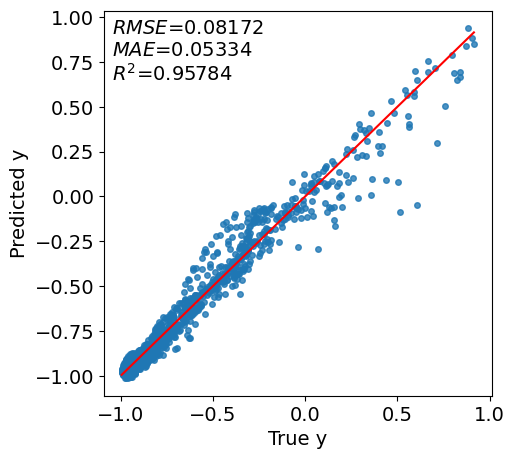

 20%|██        | 4/20 [17:11<1:11:06, 266.69s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.65e-02 | test_loss: 8.38e-02 | reg: 1.72e+01 | : 100%|█| 15000/15000 [04:54<00:00, 5


saving model version 0.1


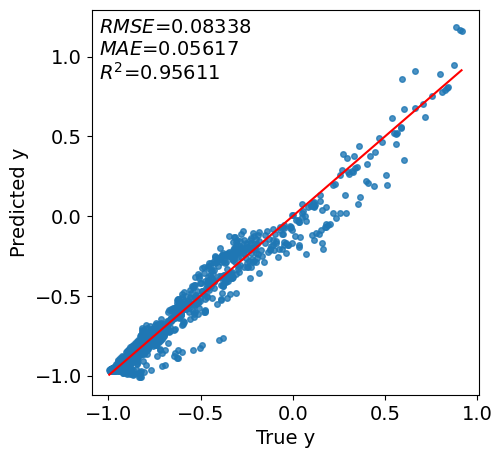

 25%|██▌       | 5/20 [22:06<1:09:13, 276.93s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.60e-02 | test_loss: 9.78e-02 | reg: 2.04e+01 | : 100%|█| 15000/15000 [04:47<00:00, 5


saving model version 0.1


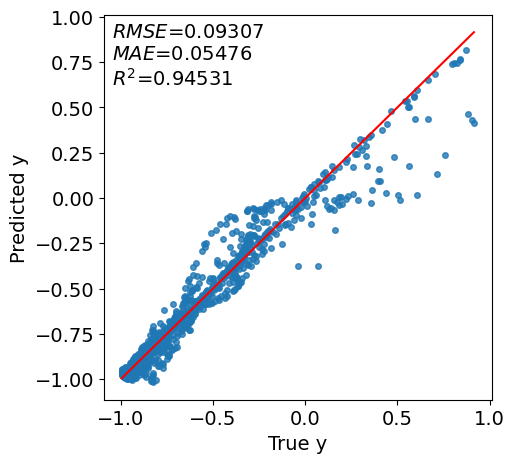

 30%|███       | 6/20 [26:54<1:05:31, 280.81s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.83e-02 | test_loss: 8.29e-02 | reg: 1.91e+01 | : 100%|█| 15000/15000 [04:58<00:00, 5


saving model version 0.1


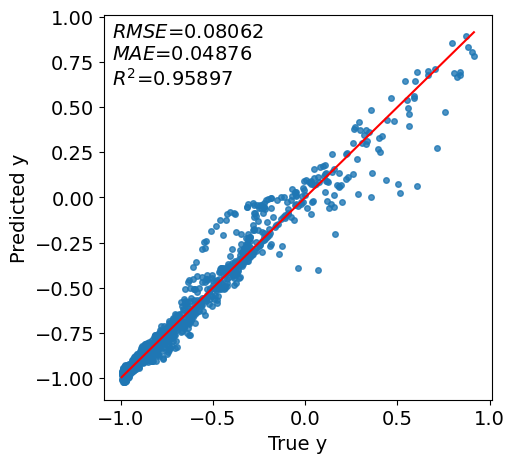

 35%|███▌      | 7/20 [31:53<1:02:08, 286.77s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.20e-02 | test_loss: 8.04e-02 | reg: 1.65e+01 | : 100%|█| 15000/15000 [04:46<00:00, 5


saving model version 0.1


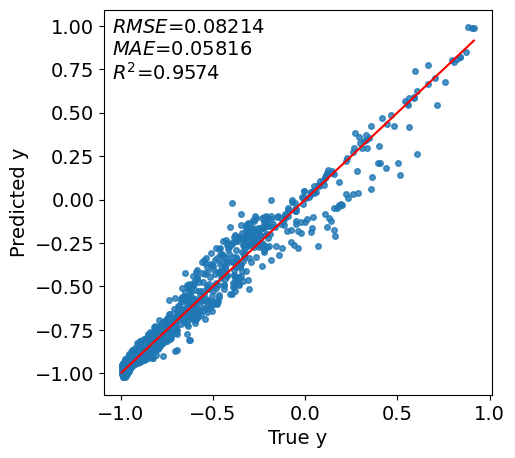

 40%|████      | 8/20 [36:40<57:20, 286.68s/it]  

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.35e-02 | test_loss: 7.89e-02 | reg: 1.62e+01 | : 100%|█| 15000/15000 [04:45<00:00, 5


saving model version 0.1


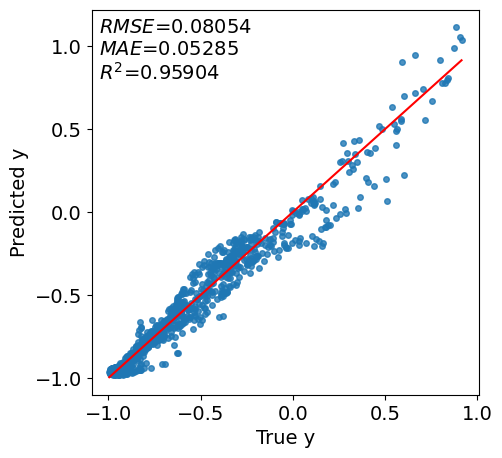

 45%|████▌     | 9/20 [41:25<52:29, 286.31s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.90e-02 | test_loss: 7.09e-02 | reg: 2.14e+01 | : 100%|█| 15000/15000 [05:34<00:00, 4


saving model version 0.1


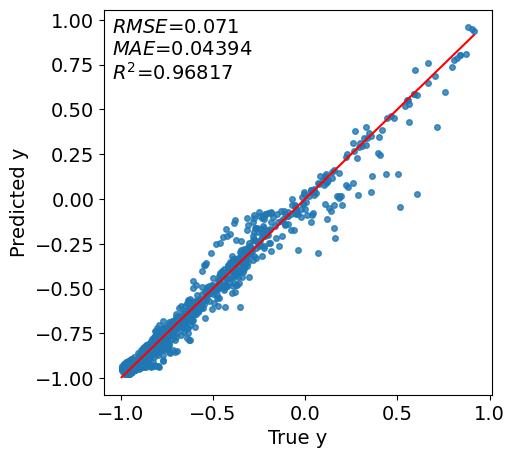

 50%|█████     | 10/20 [47:00<50:14, 301.40s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.55e-02 | test_loss: 8.05e-02 | reg: 1.96e+01 | : 100%|█| 15000/15000 [05:42<00:00, 4


saving model version 0.1


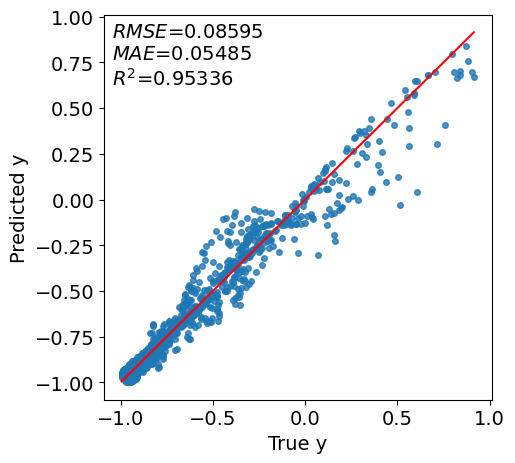

 55%|█████▌    | 11/20 [52:44<47:07, 314.21s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.23e-02 | test_loss: 7.28e-02 | reg: 1.86e+01 | : 100%|█| 15000/15000 [05:39<00:00, 4


saving model version 0.1


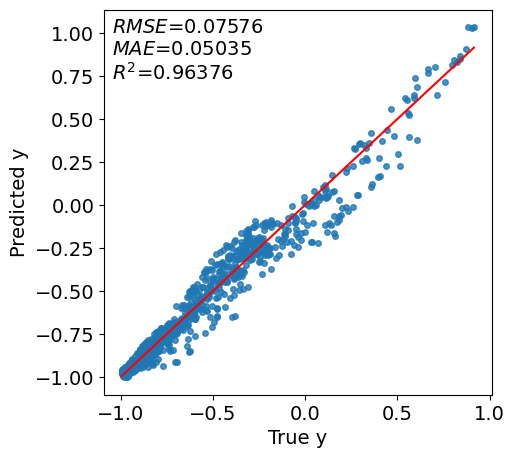

 60%|██████    | 12/20 [58:23<42:55, 321.95s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.73e-02 | test_loss: 8.24e-02 | reg: 1.91e+01 | : 100%|█| 15000/15000 [05:34<00:00, 4


saving model version 0.1


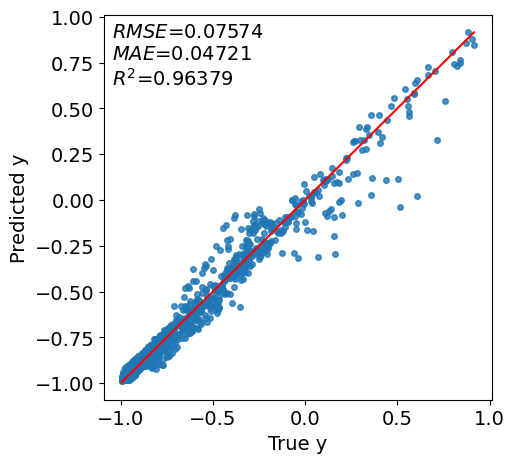

 65%|██████▌   | 13/20 [1:03:58<38:00, 325.77s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.66e-02 | test_loss: 6.96e-02 | reg: 2.21e+01 | : 100%|█| 15000/15000 [05:34<00:00, 4


saving model version 0.1


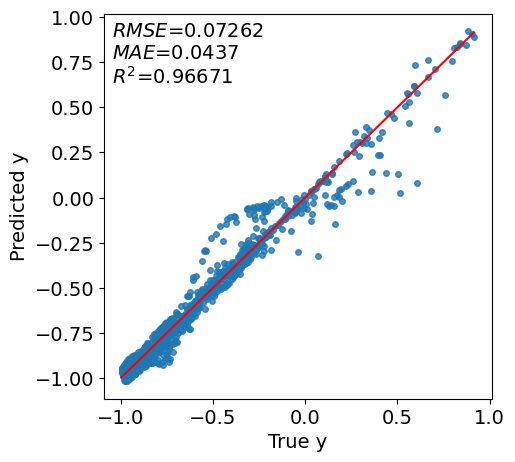

 70%|███████   | 14/20 [1:09:33<32:51, 328.62s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.59e-02 | test_loss: 6.61e-02 | reg: 2.09e+01 | : 100%|█| 15000/15000 [06:11<00:00, 4


saving model version 0.1


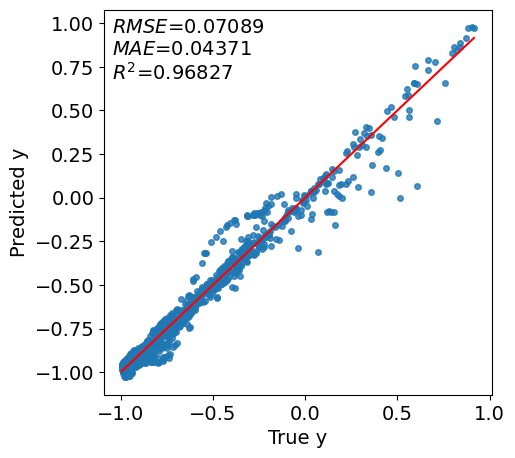

 75%|███████▌  | 15/20 [1:15:45<28:28, 341.71s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.40e-02 | test_loss: 7.68e-02 | reg: 1.82e+01 | : 100%|█| 15000/15000 [06:15<00:00, 3


saving model version 0.1


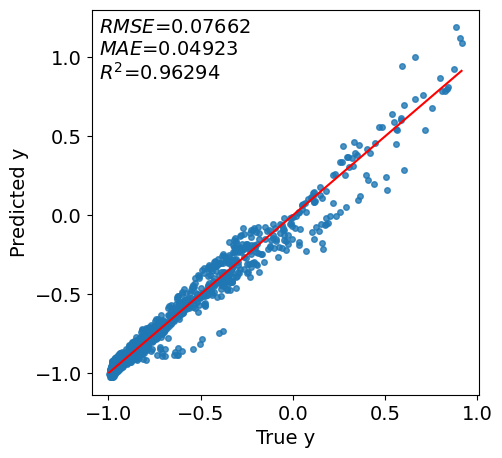

 80%|████████  | 16/20 [1:22:01<23:28, 352.07s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.91e-02 | test_loss: 8.67e-02 | reg: 2.02e+01 | : 100%|█| 15000/15000 [06:03<00:00, 4


saving model version 0.1


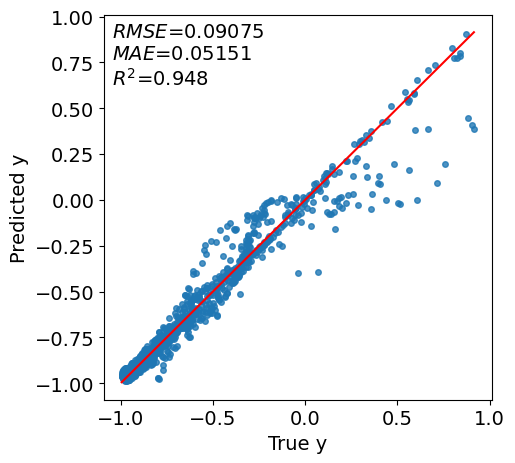

 85%|████████▌ | 17/20 [1:28:05<17:46, 355.57s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.01e-01 | test_loss: 9.41e-02 | reg: 1.86e+01 | : 100%|█| 15000/15000 [05:27<00:00, 4


saving model version 0.1


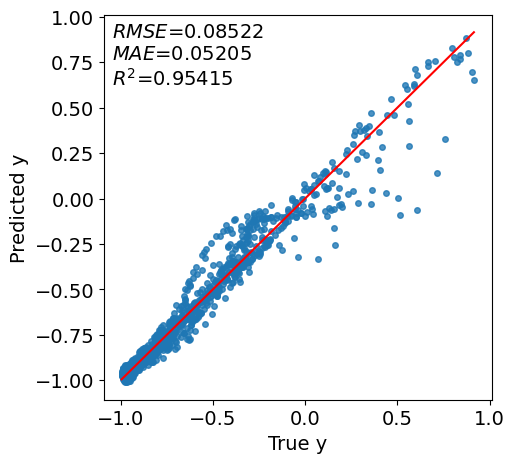

 90%|█████████ | 18/20 [1:33:33<11:34, 347.35s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.90e-02 | test_loss: 6.73e-02 | reg: 1.83e+01 | : 100%|█| 15000/15000 [04:52<00:00, 5


saving model version 0.1


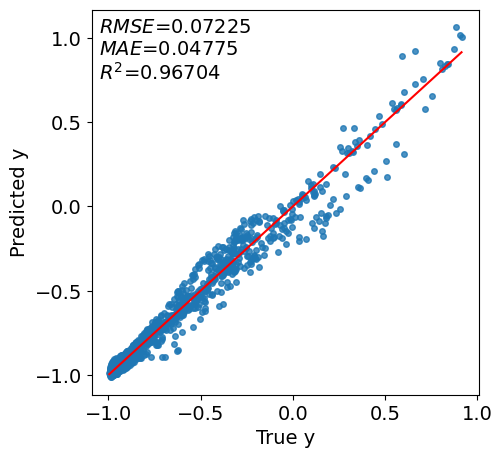

 95%|█████████▌| 19/20 [1:38:25<05:30, 330.84s/it]

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.04e-02 | test_loss: 6.32e-02 | reg: 1.90e+01 | : 100%|█| 15000/15000 [05:06<00:00, 4


saving model version 0.1


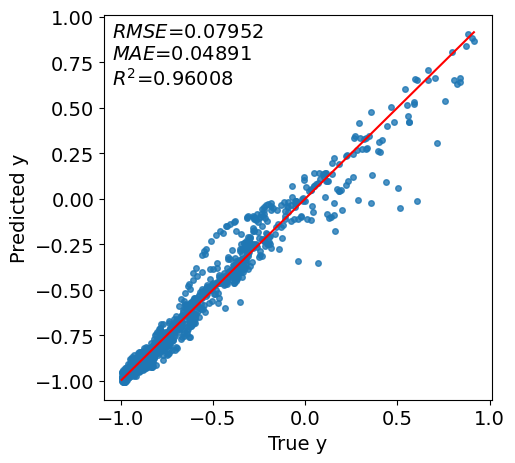

100%|██████████| 20/20 [1:43:33<00:00, 310.66s/it]


In [4]:
n_experiments = 20
l_lmdkan_stats = []

for seed in tqdm(range(n_experiments)):
    # initialize lmdKAN with G=3
    model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=seed, device=device)
    results = model.fit(dataset, opt='Adam', steps=15000, lamb = 0, batch=250, lr=1e-3, update_grid=False)
    
    rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
    mean_cosines, std_cosines = mean_cosine_similarity_lmdkan(model, dataset) 
    
    l_lmdkan_stats.append([rmse, mae, r2, mean_cosines, std_cosines])

df_lmdkan = pd.DataFrame(l_lmdkan_stats, columns=['RMSE', 'MAE', 'R2', 'mean cosine', 'std cosine'])
df_lmdkan.to_csv('f1_stats_results/lmdKAN_stats.csv', index=False)

-----
### trainable $\lambda$-KAN on $f_1$

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 286


| train_loss: 7.82e-03 | test_loss: 8.72e-03 | reg: 1.29e+01 | : 100%|█| 200/200 [01:59<00:00,  1.68


saving model version 0.1


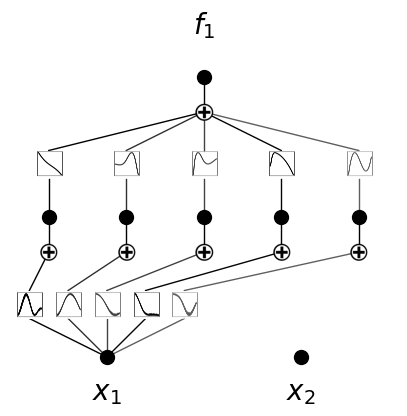

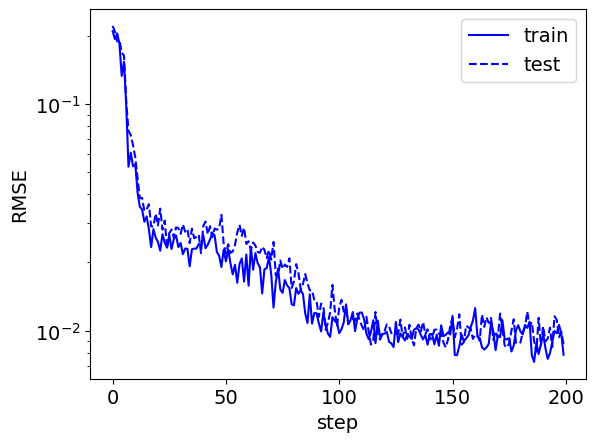

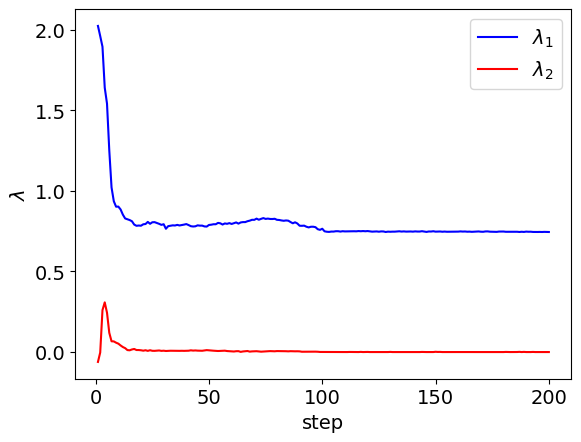

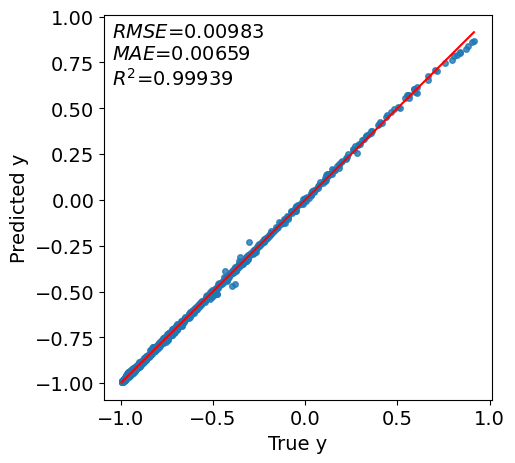

model.act_fun[0].lmd=Parameter containing:
tensor([7.4478e-01, 3.5935e-05], requires_grad=True)


In [36]:
# initialize lmdKAN with G=3
model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=1e-1)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=200, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])
print(f'{model.act_fun[0].lmd=}')

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 286


| train_loss: 1.09e-02 | test_loss: 1.00e-02 | reg: 4.03e+00 | : 100%|█| 10000/10000 [06:54<00:00, 2


saving model version 0.1


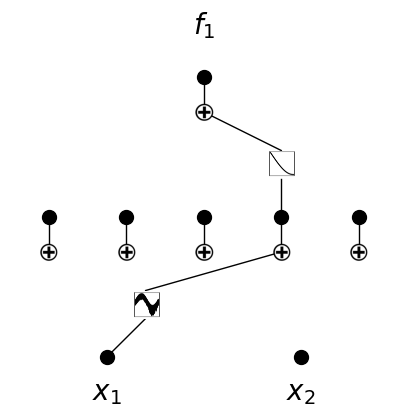

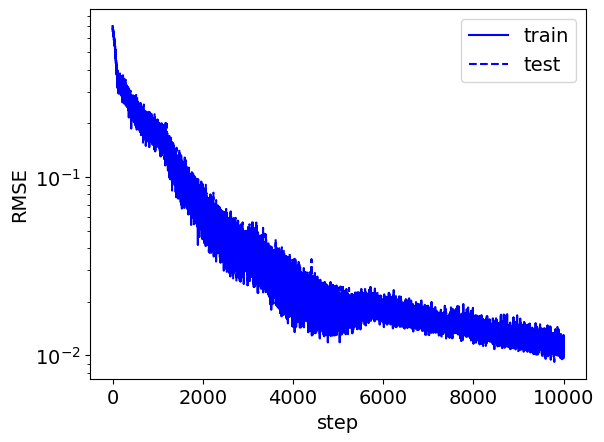

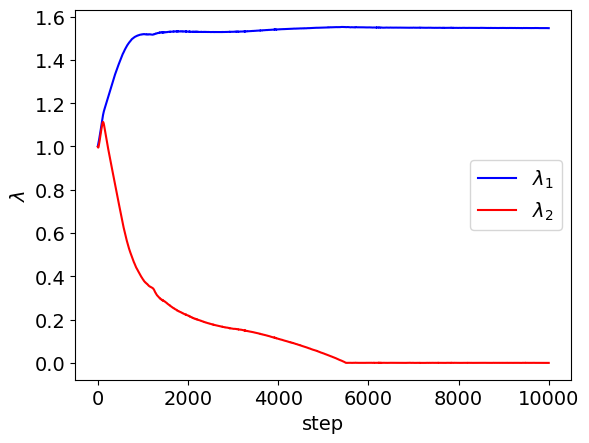

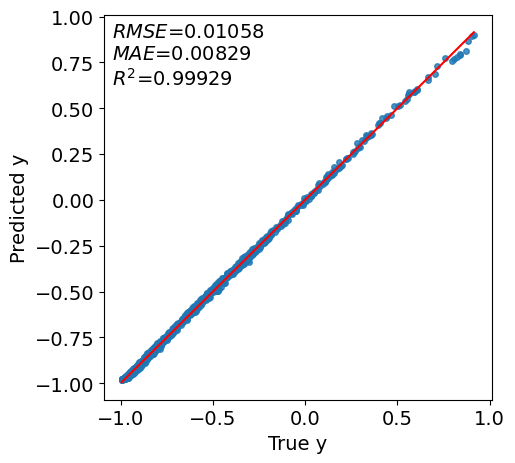

model.act_fun[0].lmd=Parameter containing:
tensor([ 1.5468e+00, -1.7274e-04], requires_grad=True)


In [6]:
# initialize lmdKAN with G=3
model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=1e-1)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=10000, lamb = 1e-3, 
                    batch=250,
                    opt='Adam', lr=1e-3)
kan_summary_after_fit(model, dataset, results, lmdKAN=True, in_vars = ['$x_1$', '$x_2$'], out_vars = ['$f_1$'])
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:24, 29.14it/s]                          


module of Input importance:


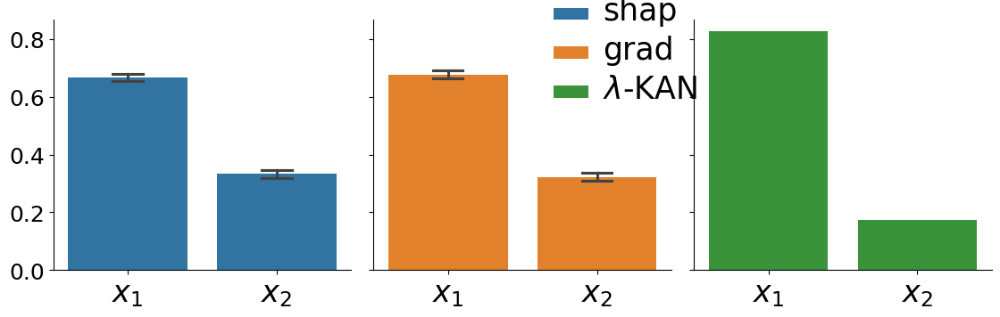

Input importance:


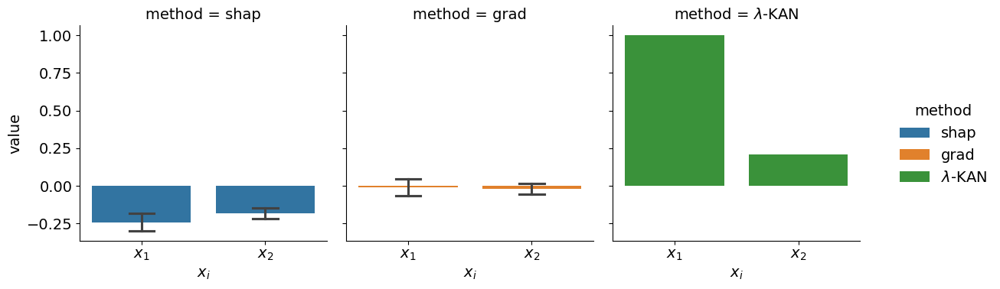

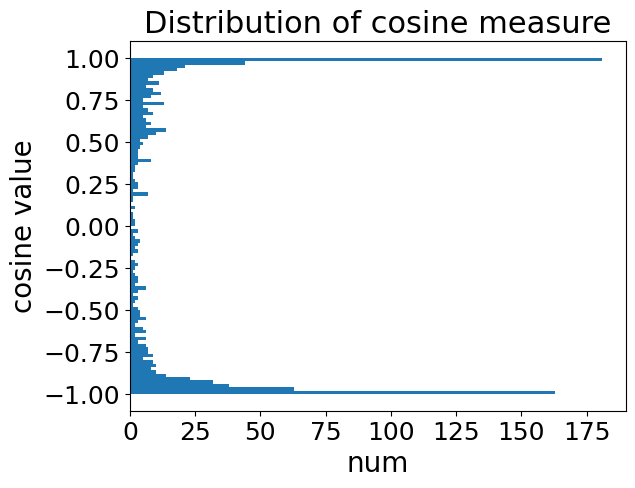

In [57]:
importance_analyse_lmdKAN(model, dataset)

ExactExplainer explainer: 1001it [03:17,  4.57it/s]                          


module of Input importance:


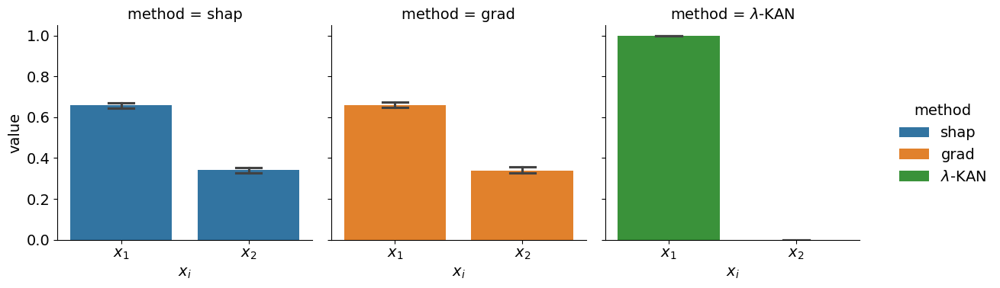

Input importance:


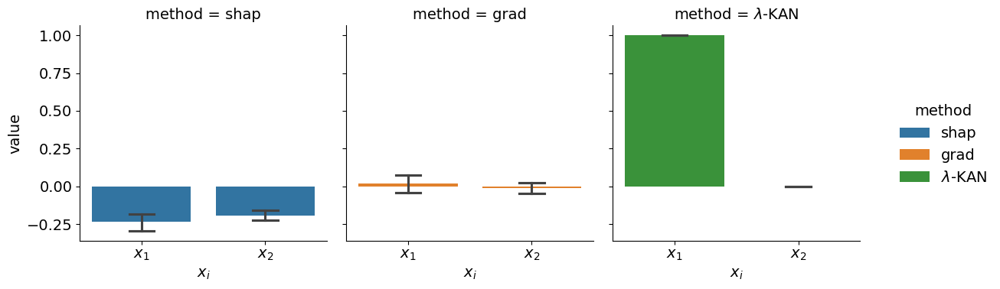

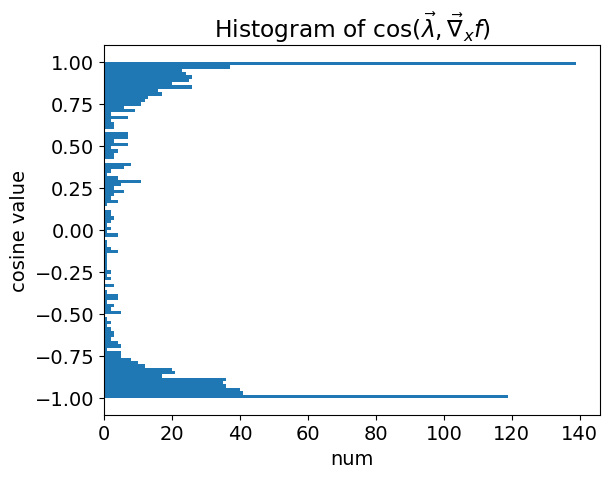

In [13]:
importance_analyse_tlmdKAN(model, dataset)

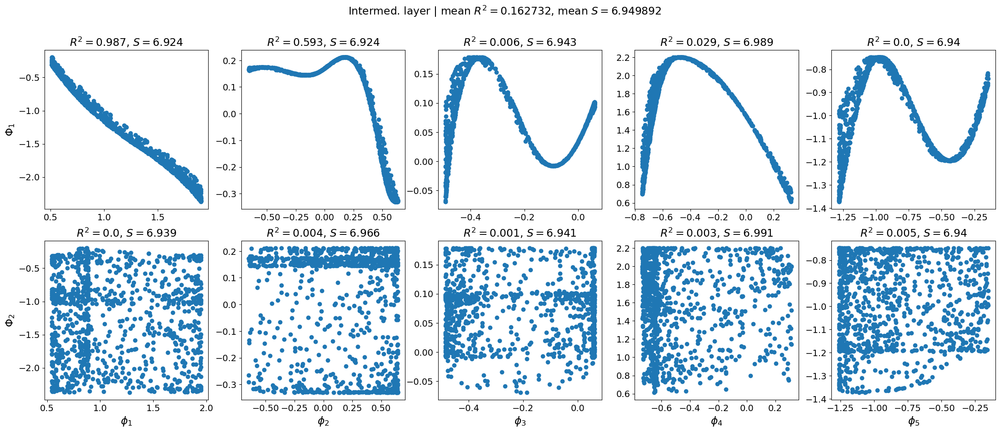

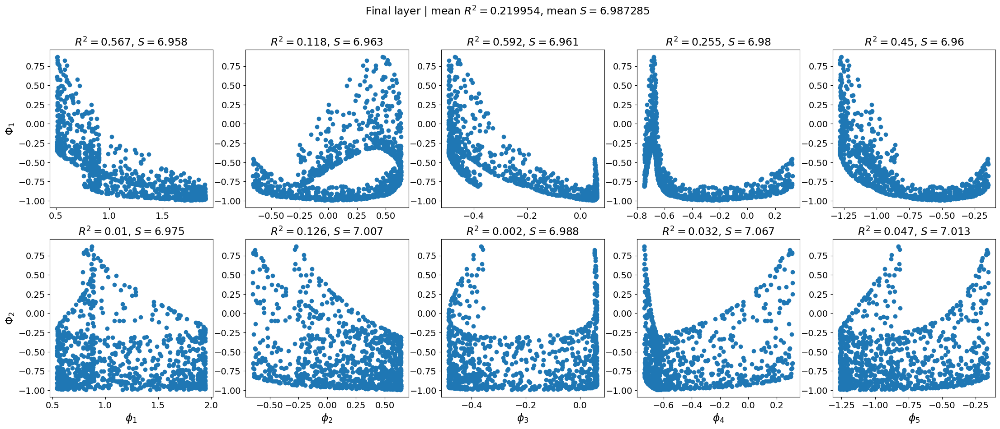

{'mean_r2': 0.21995393210090697, 'mean_matrix_entropy': 6.9872846603393555}

In [14]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

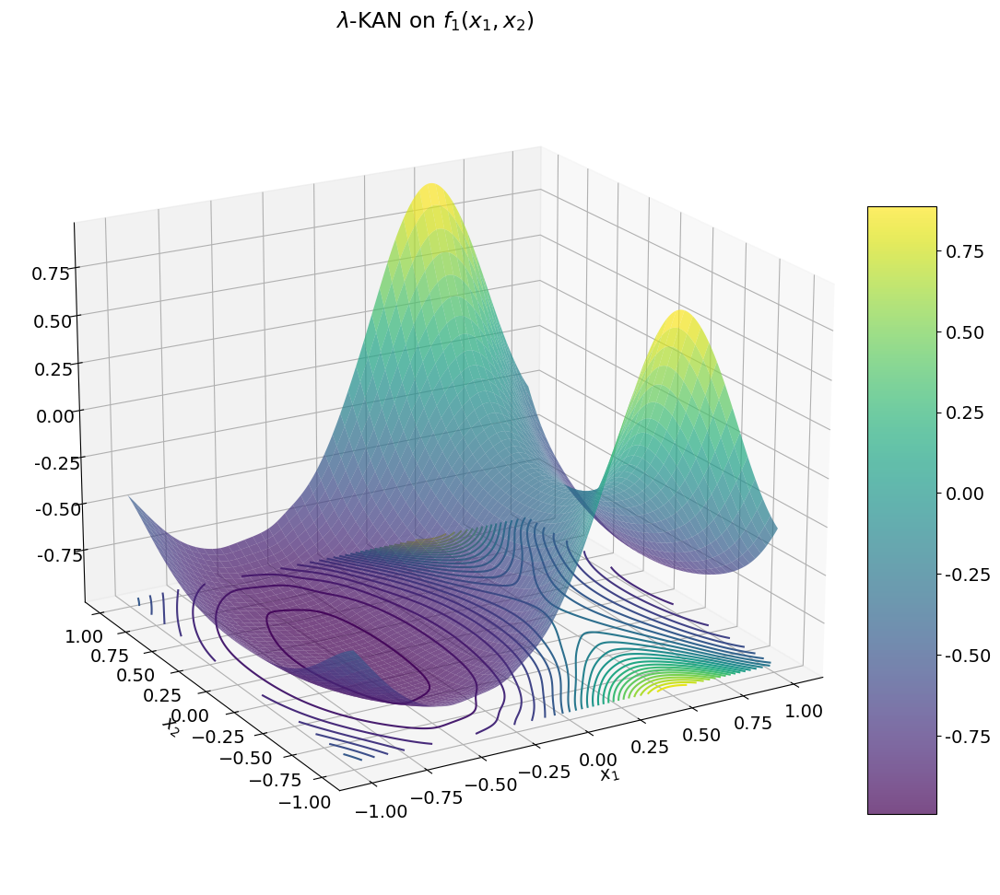

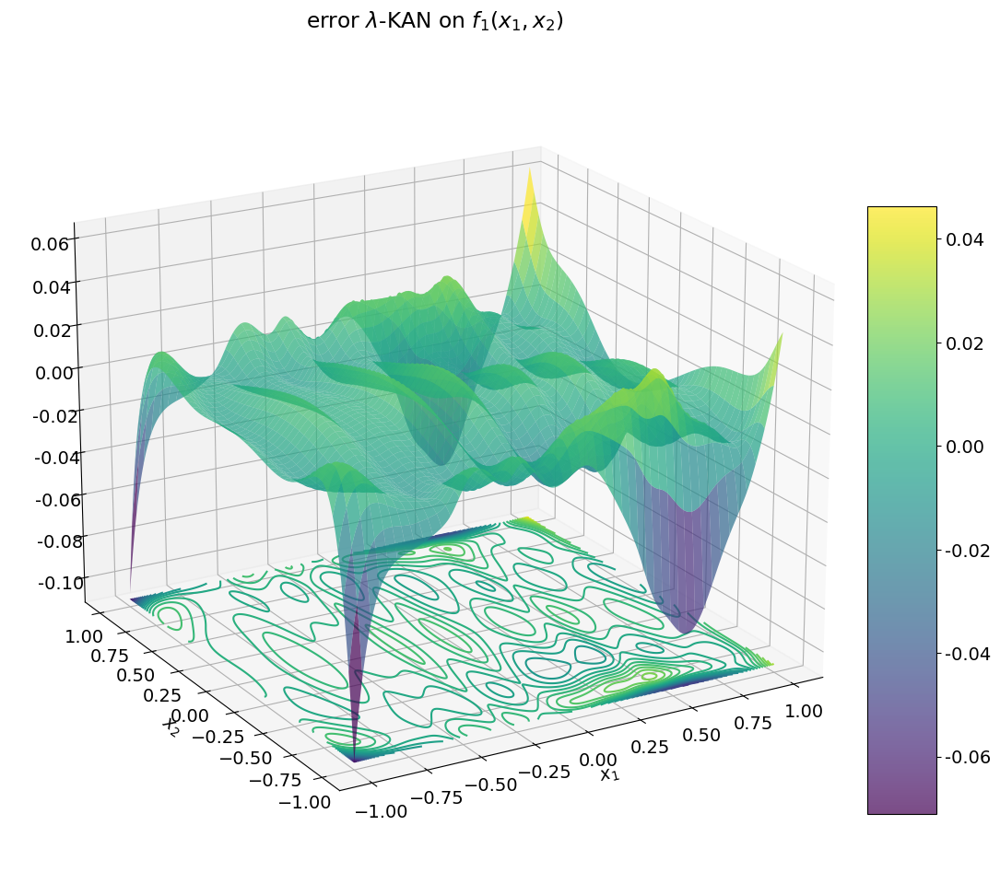

In [15]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

#### Getting statistics


seed=0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.08e-03 | test_loss: 1.61e-03 | reg: 1.08e+01 | : 100%|█| 15000/15000 [08:41<00:00, 2


saving model version 0.1


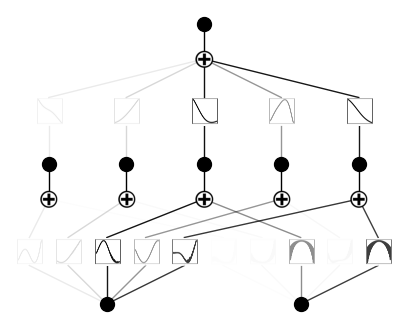

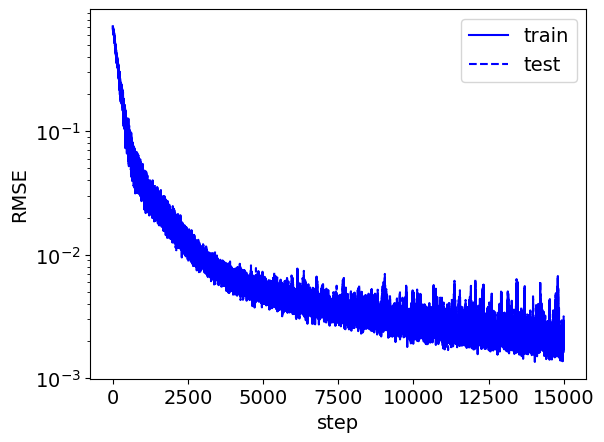

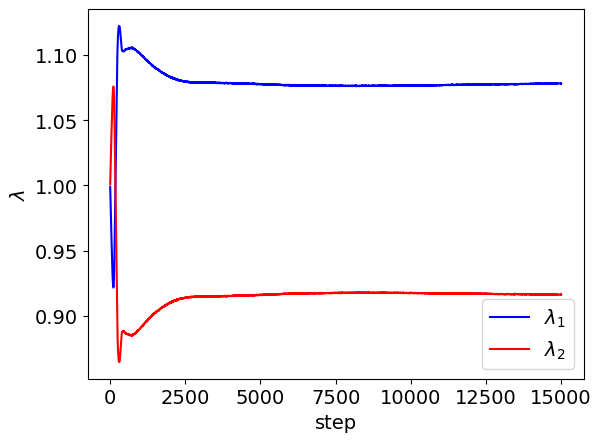

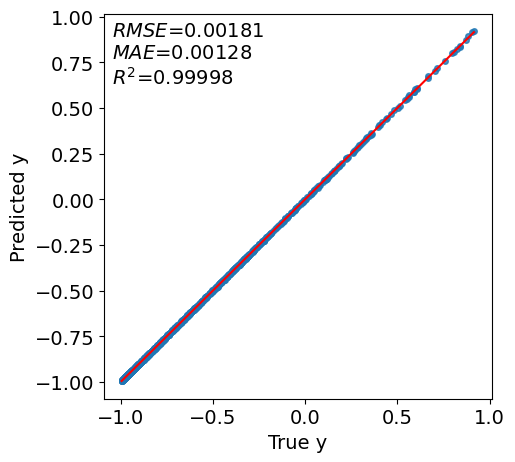


seed=1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.61e-02 | test_loss: 1.72e-02 | reg: 1.65e+01 | : 100%|█| 15000/15000 [09:03<00:00, 2


saving model version 0.1


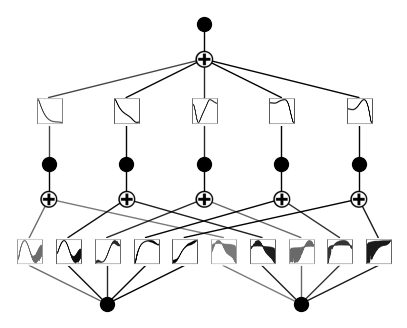

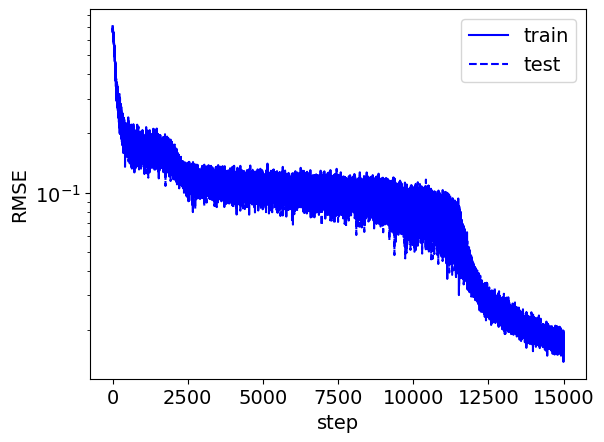

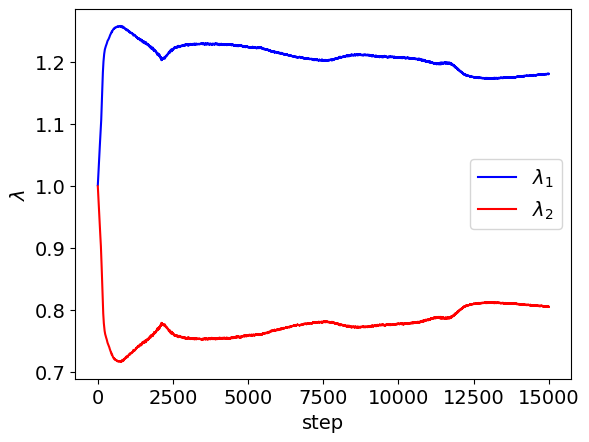

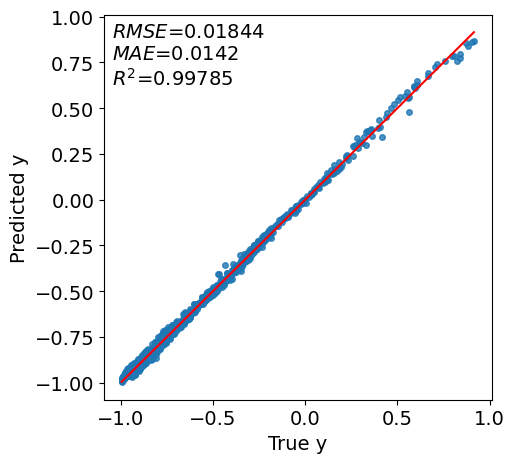


seed=2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.86e-03 | test_loss: 6.10e-03 | reg: 1.40e+01 | : 100%|█| 15000/15000 [09:40<00:00, 2


saving model version 0.1


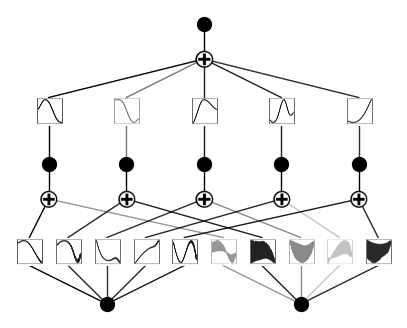

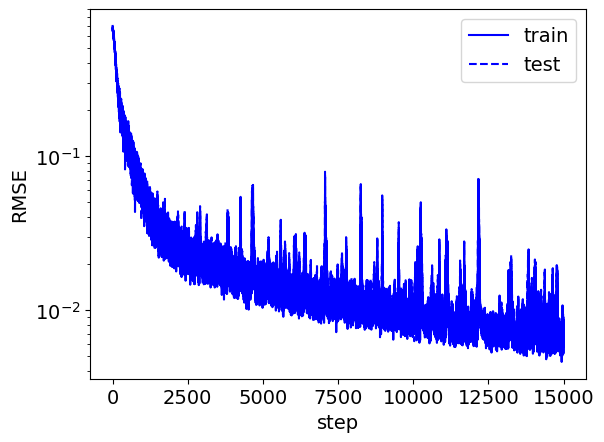

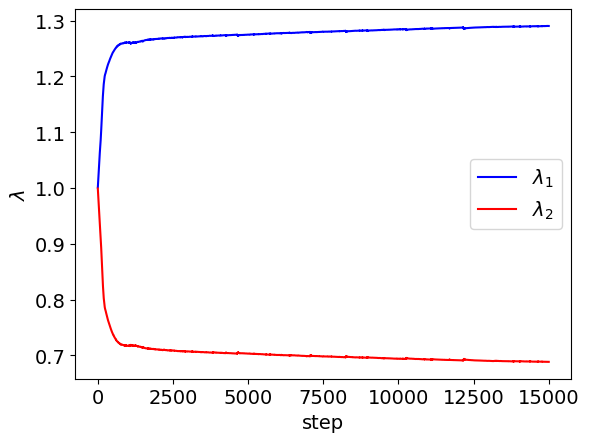

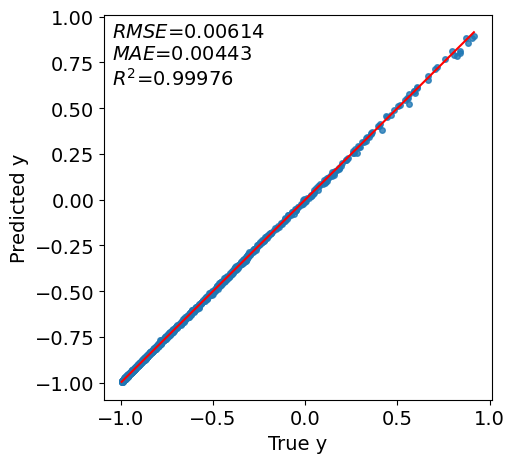


seed=3
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.12e-03 | test_loss: 9.69e-03 | reg: 2.17e+01 | : 100%|█| 15000/15000 [12:42<00:00, 1


saving model version 0.1


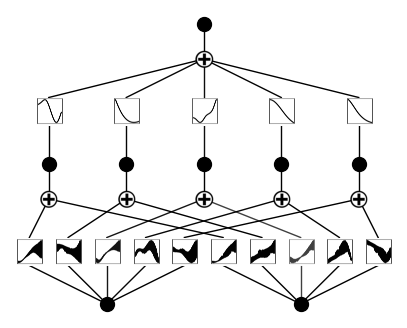

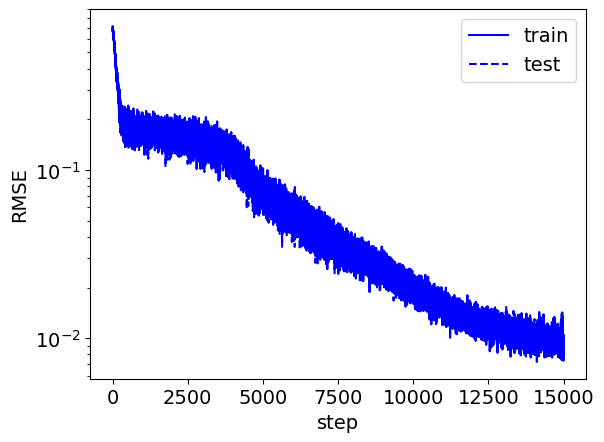

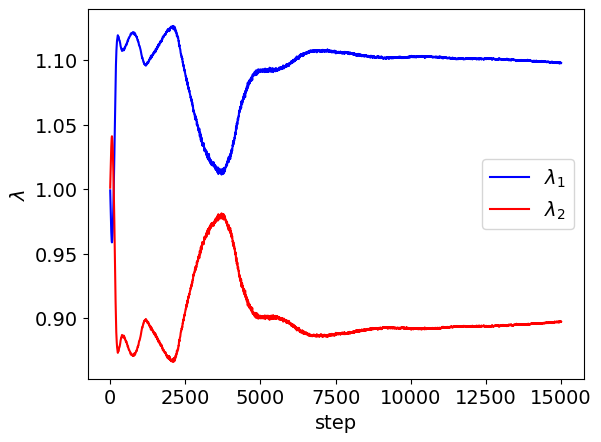

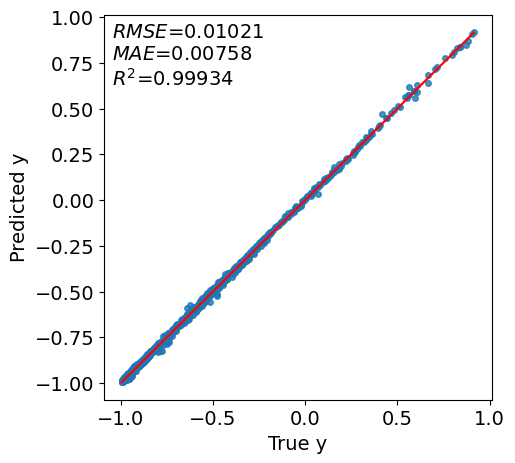


seed=4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.68e-03 | test_loss: 6.93e-03 | reg: 1.83e+01 | : 100%|█| 15000/15000 [13:16<00:00, 1


saving model version 0.1


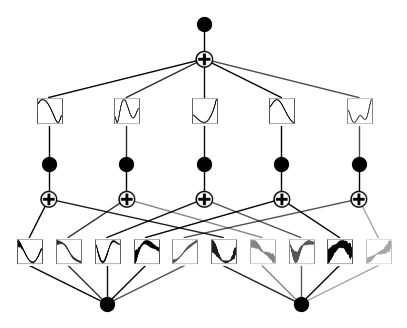

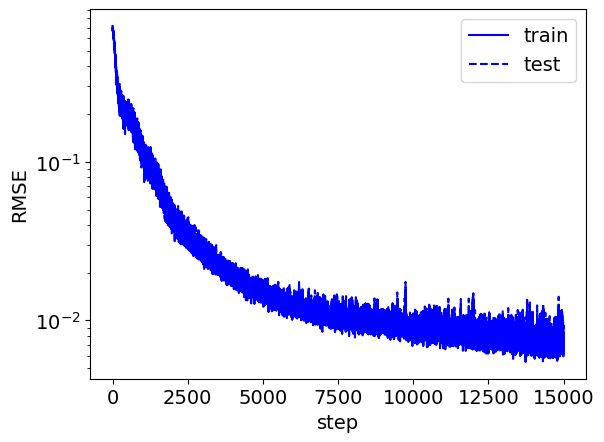

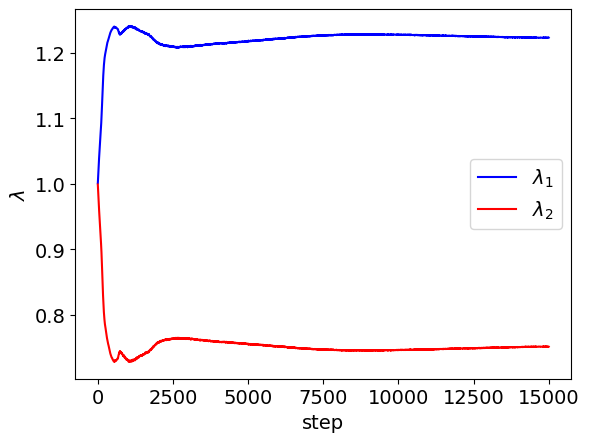

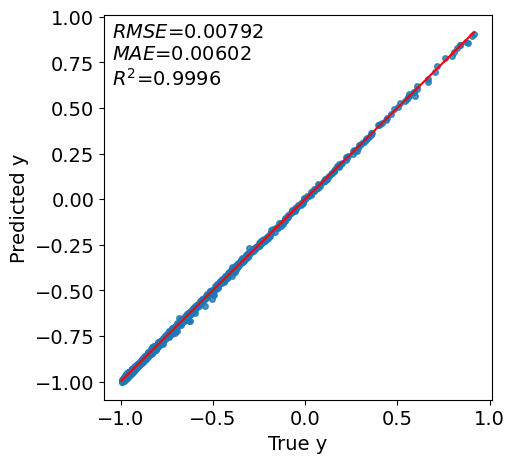


seed=5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.16e-03 | test_loss: 1.63e-03 | reg: 1.55e+01 | : 100%|█| 15000/15000 [11:19<00:00, 2


saving model version 0.1


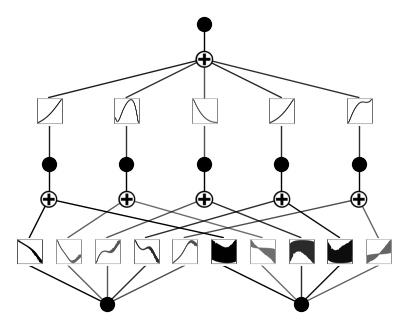

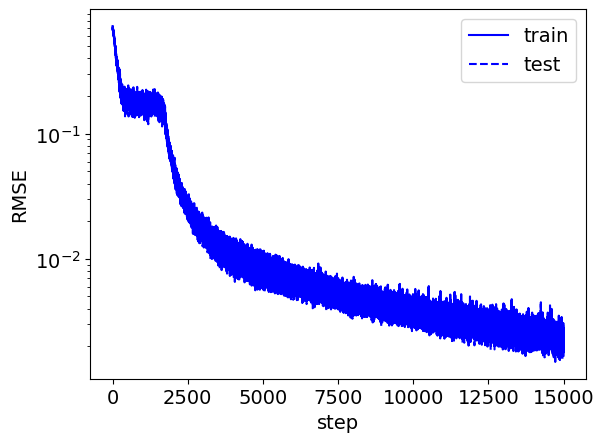

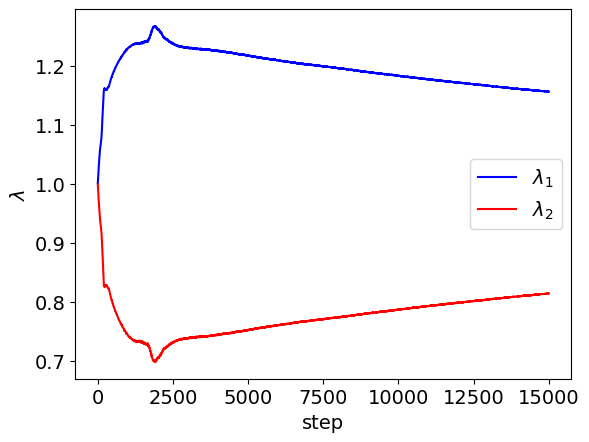

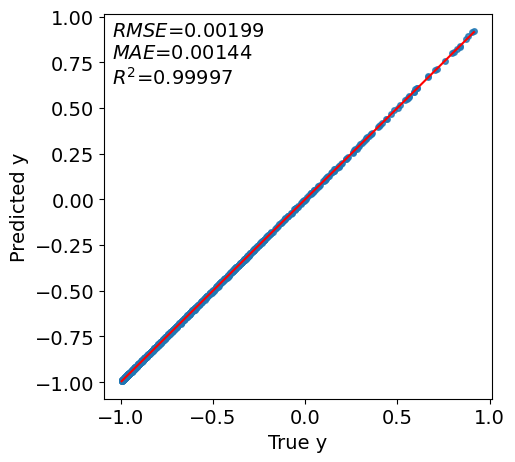


seed=6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.58e-03 | test_loss: 2.75e-03 | reg: 1.43e+01 | : 100%|█| 15000/15000 [12:43<00:00, 1


saving model version 0.1


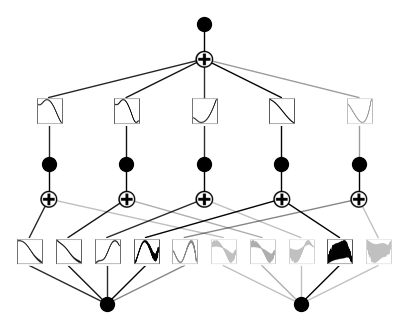

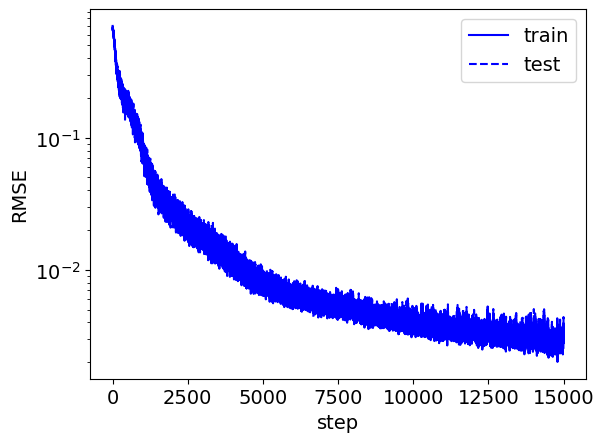

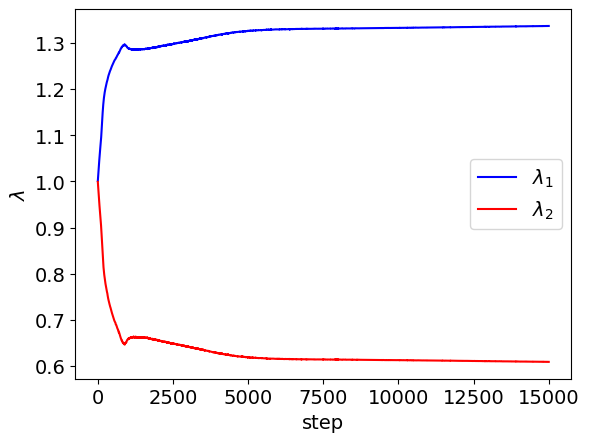

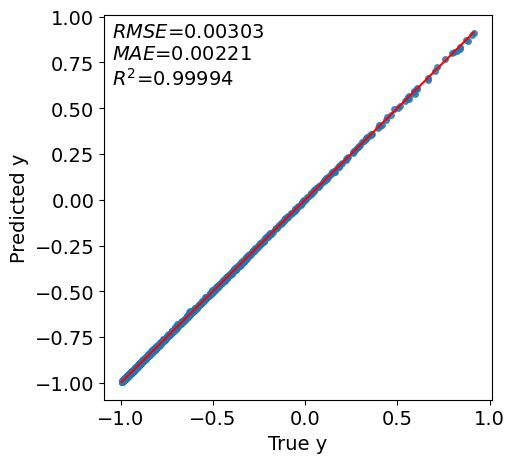


seed=7
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.37e-03 | test_loss: 2.81e-03 | reg: 1.28e+01 | : 100%|█| 15000/15000 [13:07<00:00, 1


saving model version 0.1


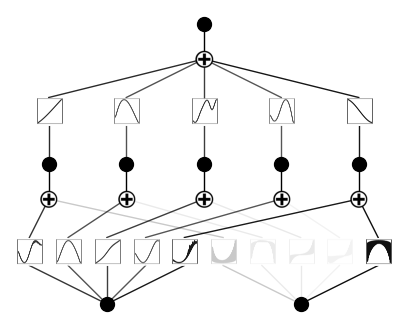

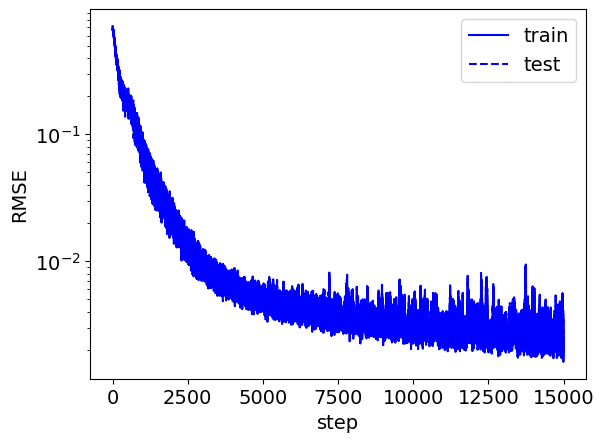

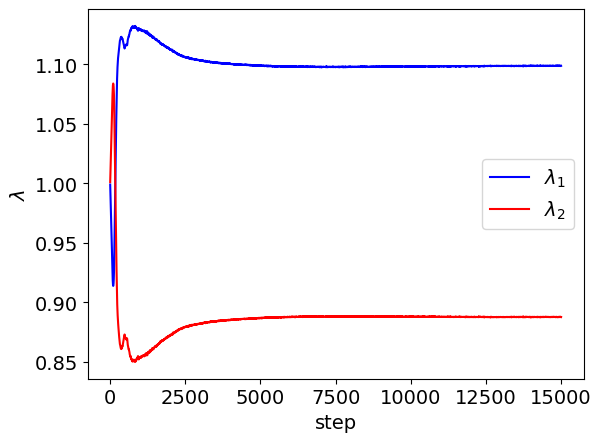

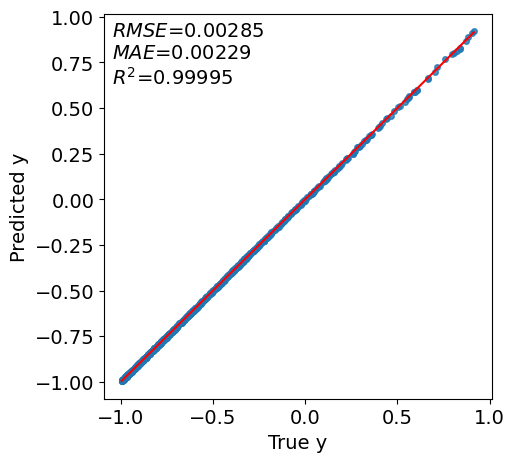


seed=8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.40e-03 | test_loss: 3.14e-03 | reg: 1.06e+01 | : 100%|█| 15000/15000 [13:23<00:00, 1


saving model version 0.1


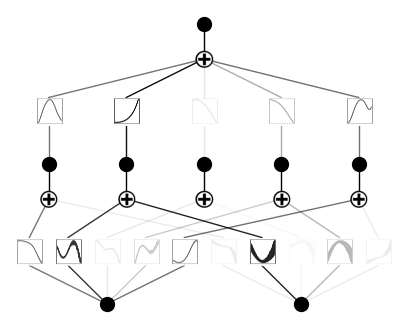

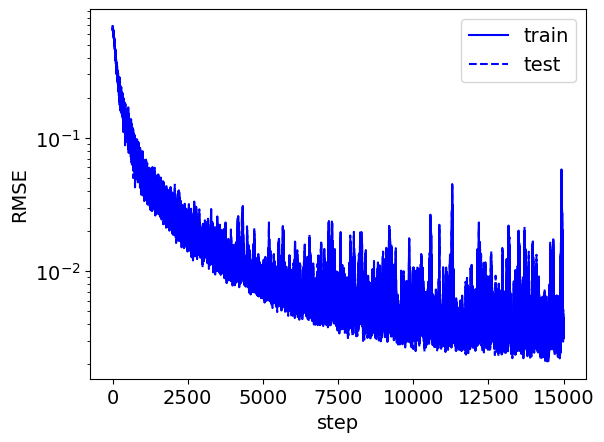

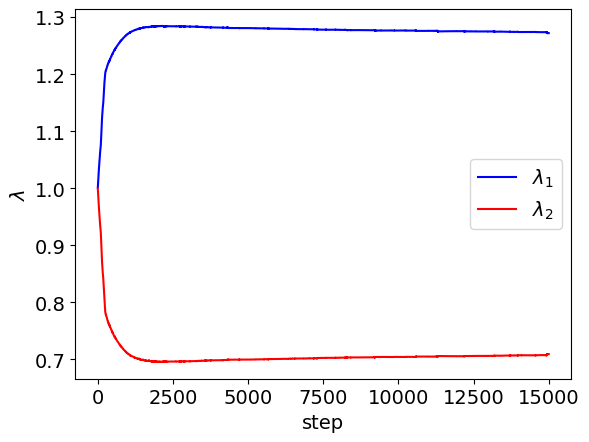

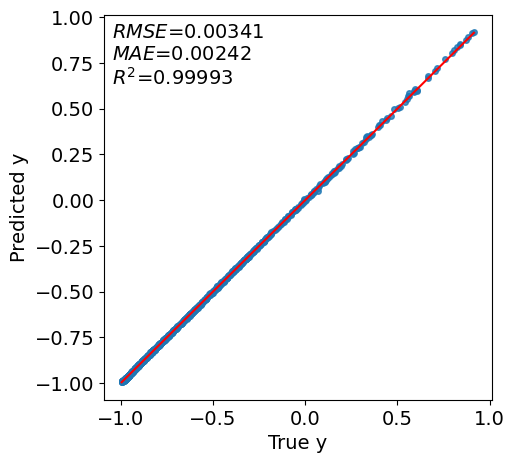


seed=9
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.90e-03 | test_loss: 1.11e-02 | reg: 1.77e+01 | : 100%|█| 15000/15000 [14:20<00:00, 1


saving model version 0.1


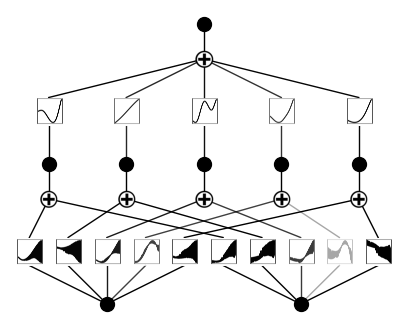

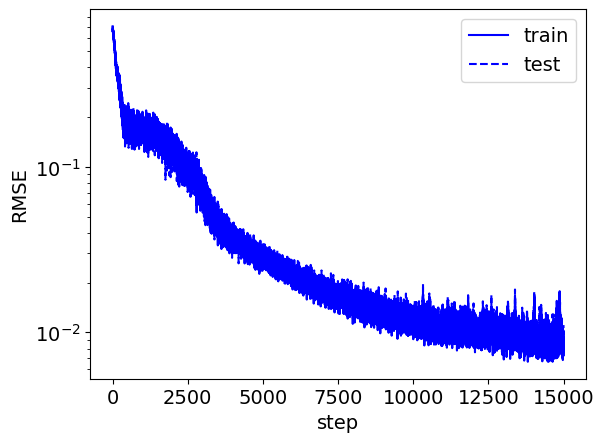

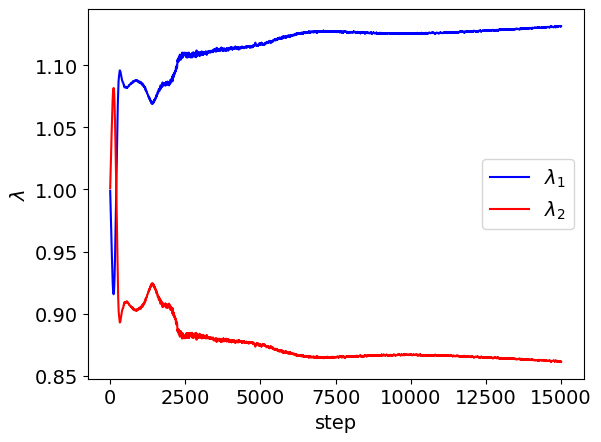

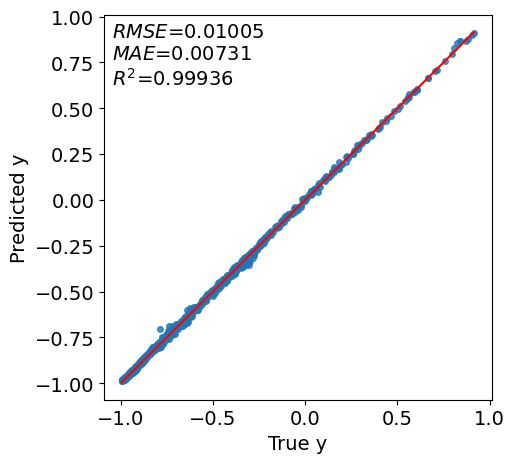


seed=10
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.26e-03 | test_loss: 3.97e-03 | reg: 1.32e+01 | : 100%|█| 15000/15000 [14:57<00:00, 1


saving model version 0.1


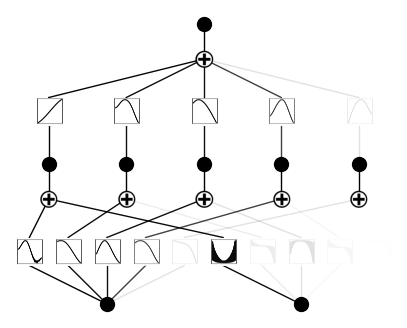

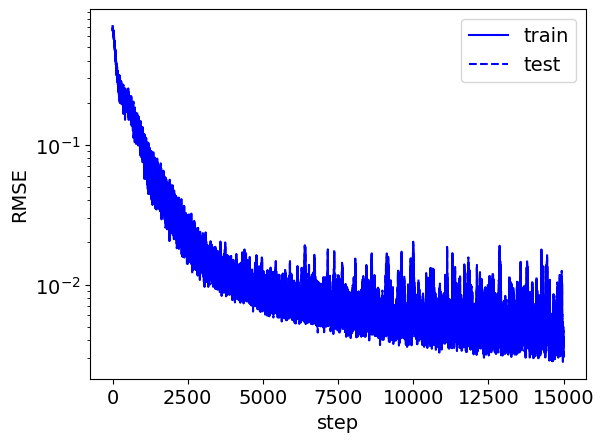

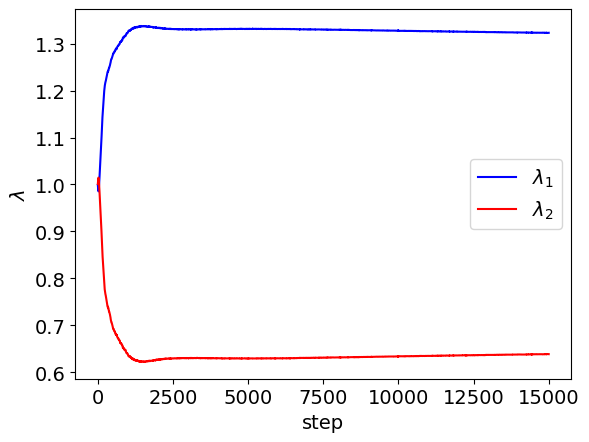

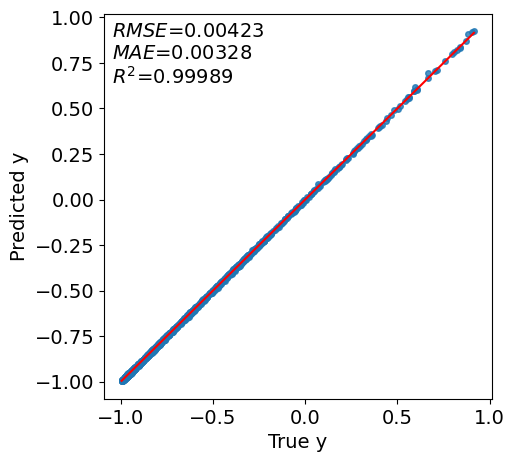


seed=11
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.75e-03 | test_loss: 9.37e-03 | reg: 1.76e+01 | : 100%|█| 15000/15000 [12:56<00:00, 1


saving model version 0.1


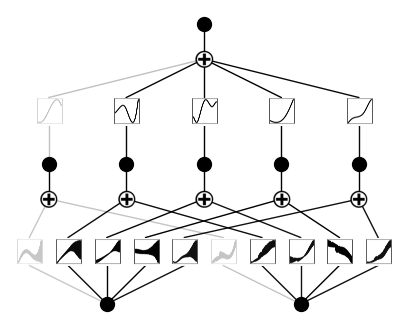

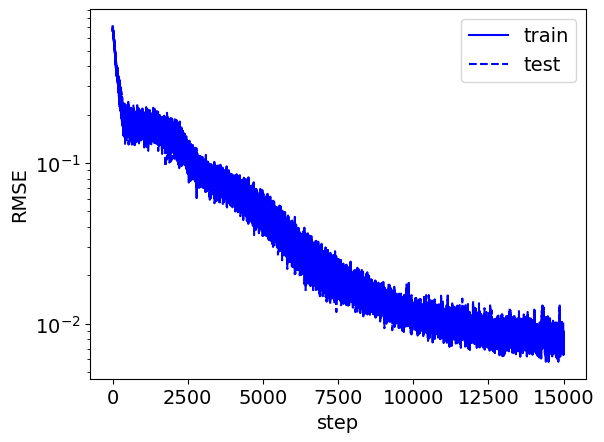

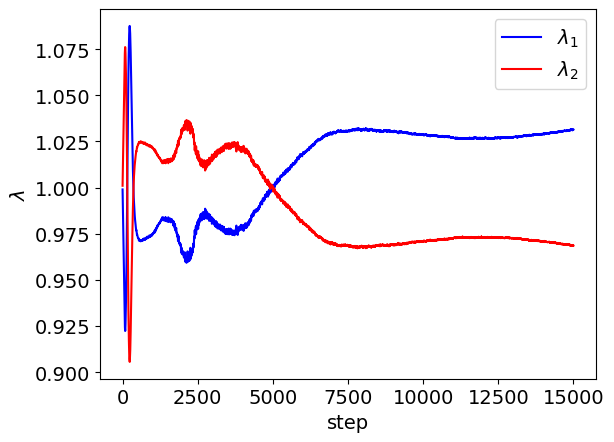

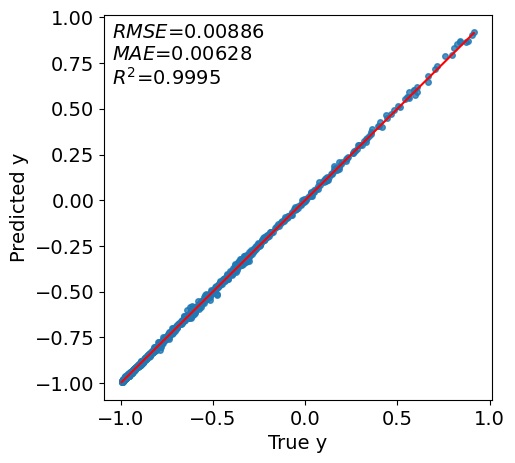


seed=12
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.74e-03 | test_loss: 8.98e-03 | reg: 1.77e+01 | : 100%|█| 15000/15000 [12:40<00:00, 1


saving model version 0.1


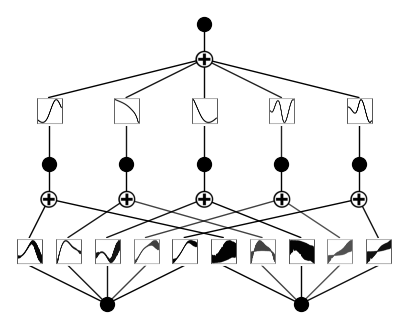

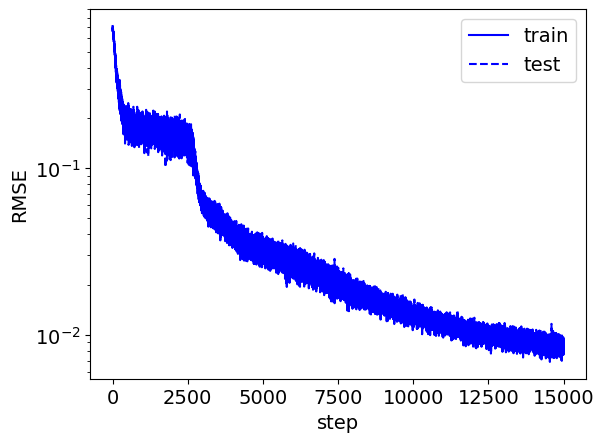

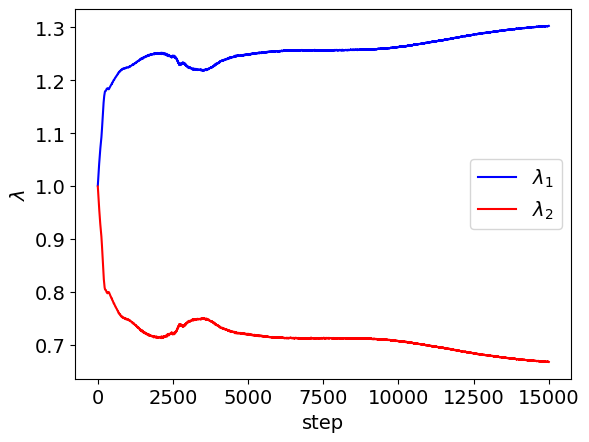

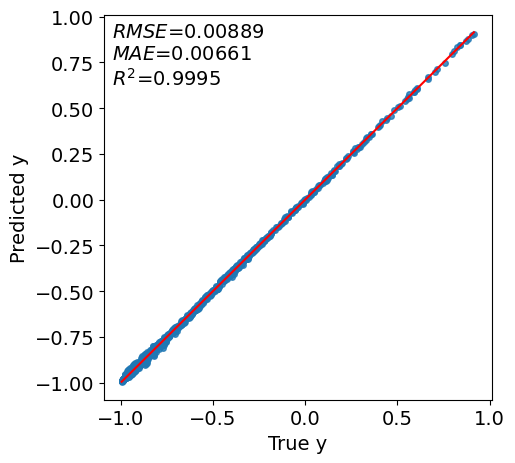


seed=13
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.95e-03 | test_loss: 2.80e-03 | reg: 1.63e+01 | : 100%|█| 15000/15000 [10:18<00:00, 2


saving model version 0.1


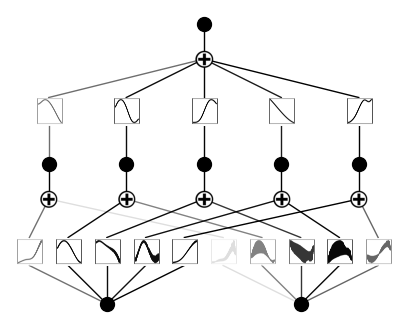

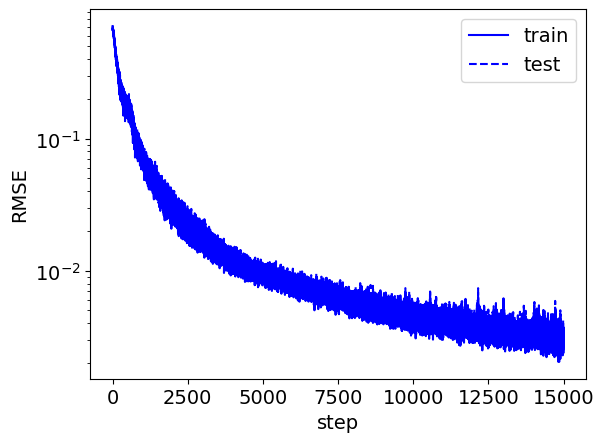

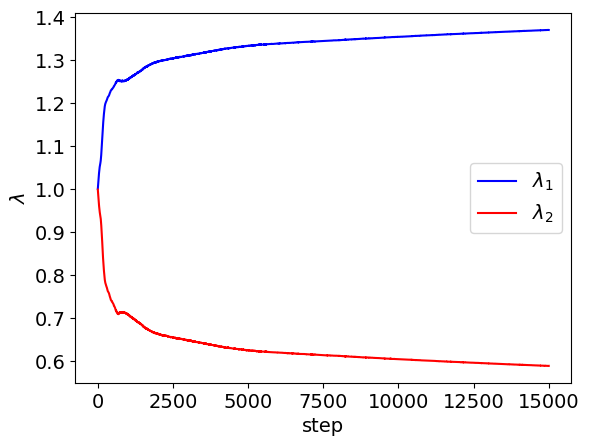

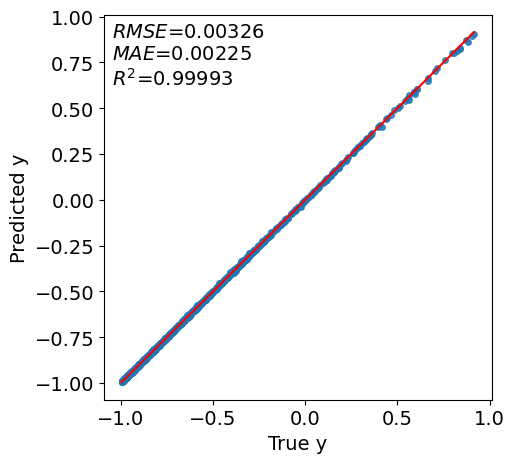


seed=14
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.65e-03 | test_loss: 7.55e-03 | reg: 2.09e+01 | : 100%|█| 15000/15000 [12:39<00:00, 1


saving model version 0.1


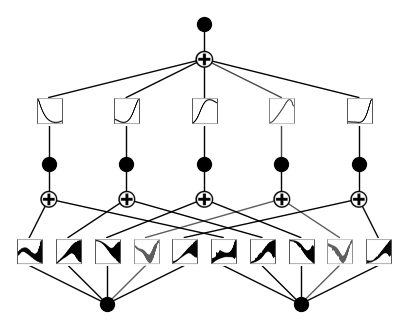

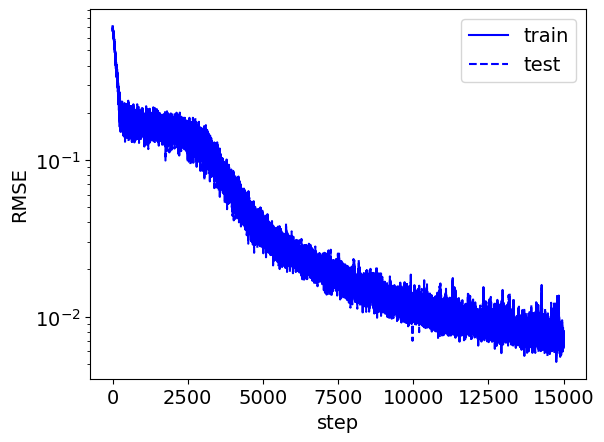

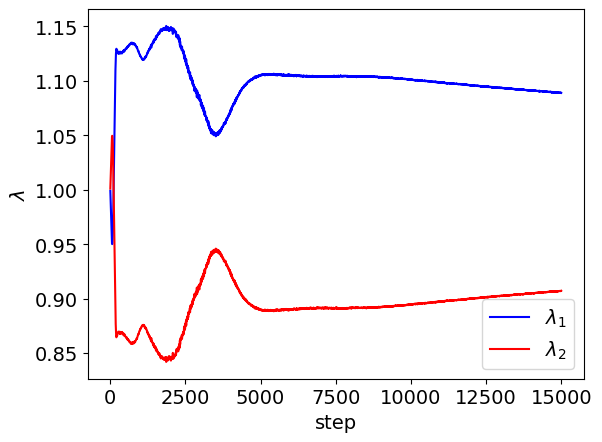

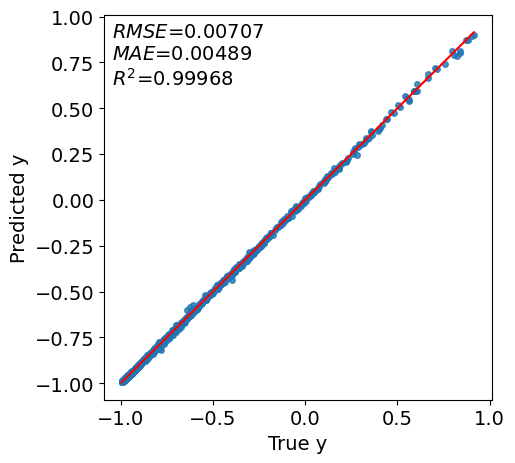


seed=15
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 3.13e-03 | test_loss: 2.38e-03 | reg: 1.53e+01 | : 100%|█| 15000/15000 [12:24<00:00, 2


saving model version 0.1


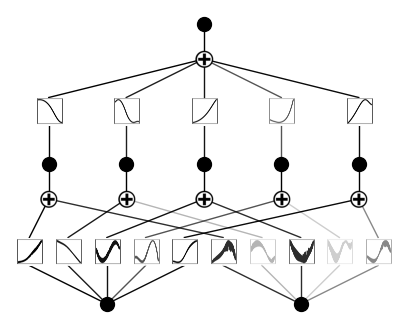

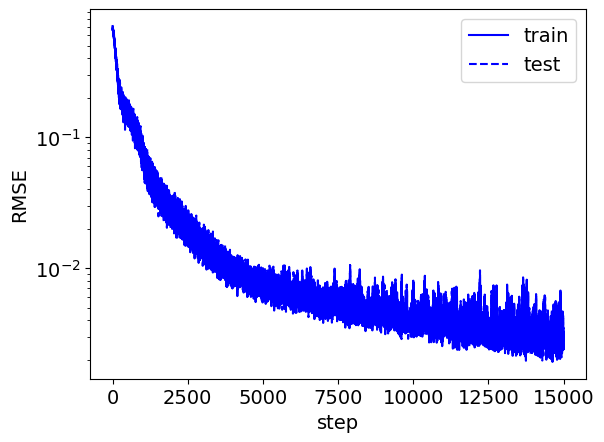

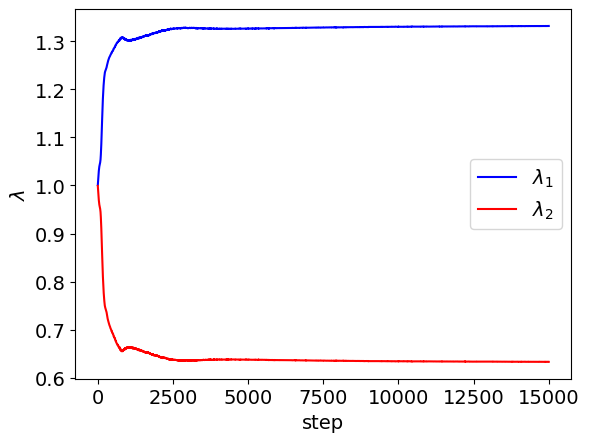

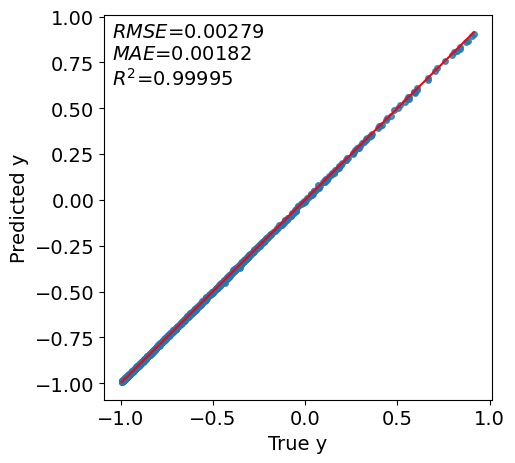


seed=16
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.71e-03 | test_loss: 3.38e-03 | reg: 1.71e+01 | : 100%|█| 15000/15000 [12:25<00:00, 2


saving model version 0.1


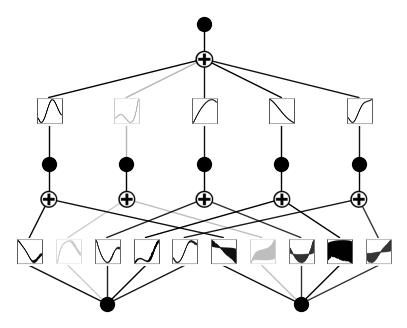

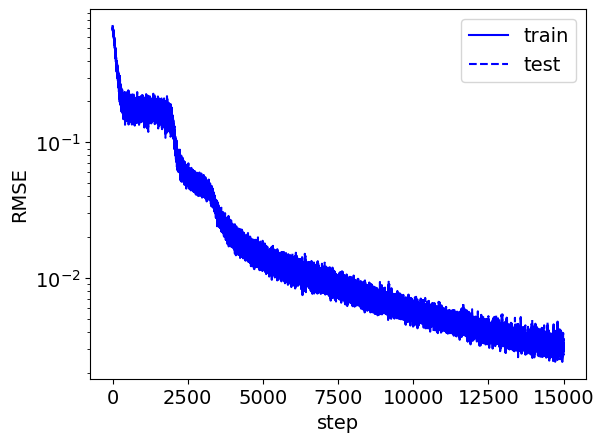

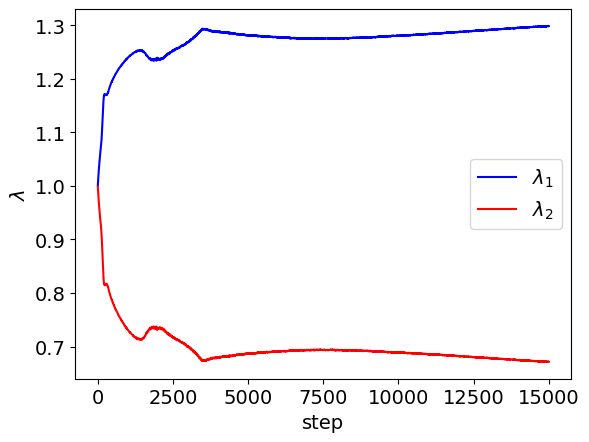

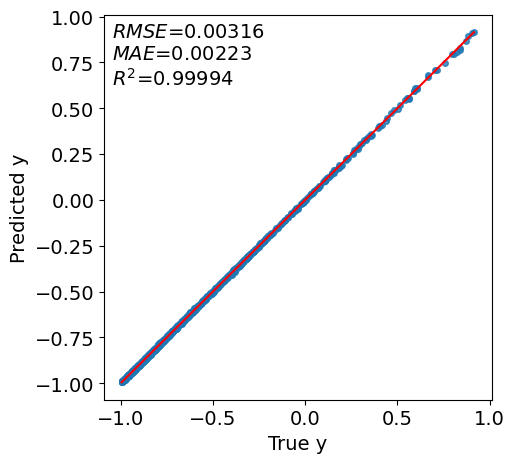


seed=17
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 9.39e-03 | test_loss: 8.97e-03 | reg: 2.85e+01 | : 100%|█| 15000/15000 [12:34<00:00, 1


saving model version 0.1


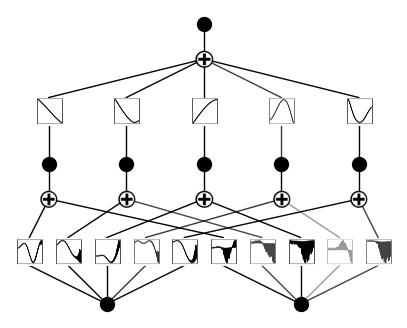

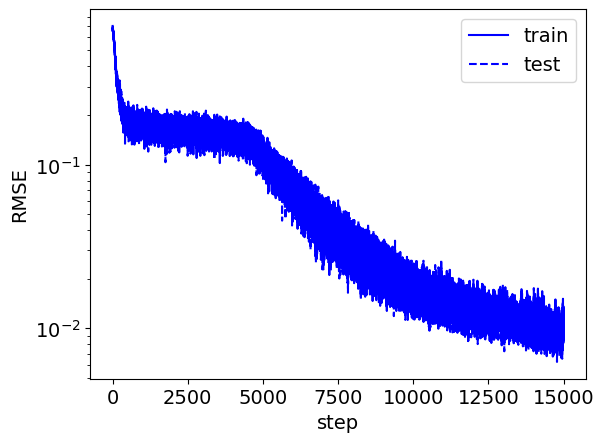

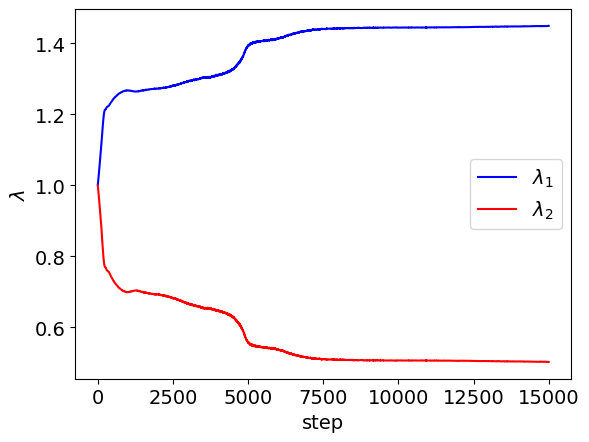

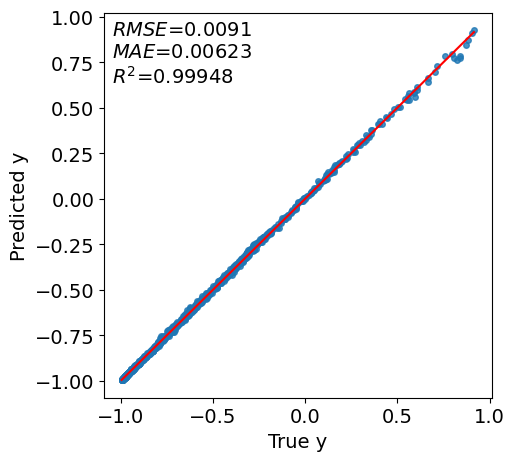


seed=18
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 2.94e-02 | test_loss: 5.82e-02 | reg: 1.97e+01 | : 100%|█| 15000/15000 [12:18<00:00, 2


saving model version 0.1


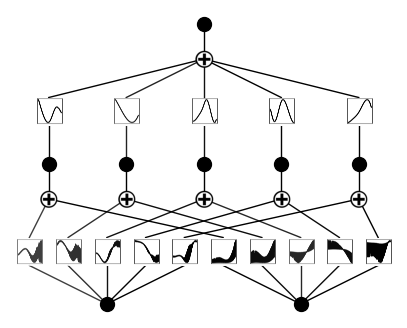

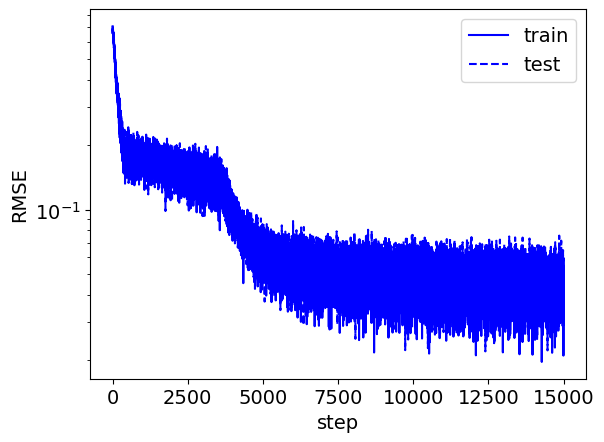

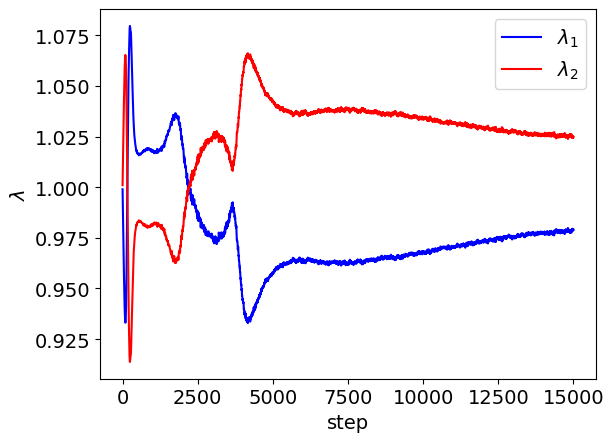

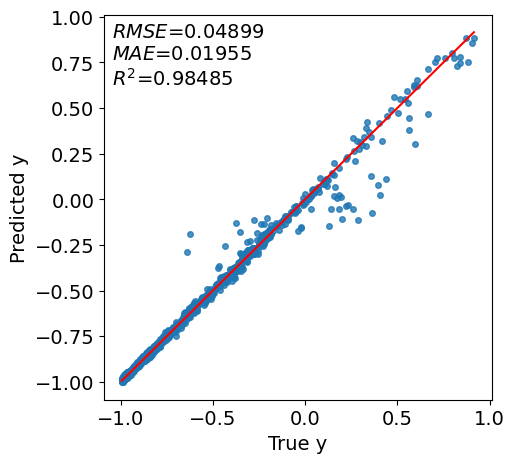


seed=19
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 5.30e-03 | test_loss: 4.12e-03 | reg: 1.36e+01 | : 100%|█| 15000/15000 [12:04<00:00, 2


saving model version 0.1


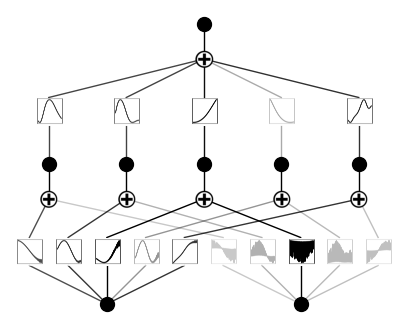

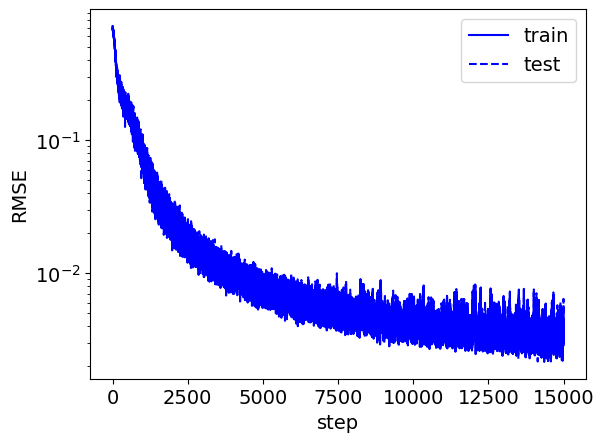

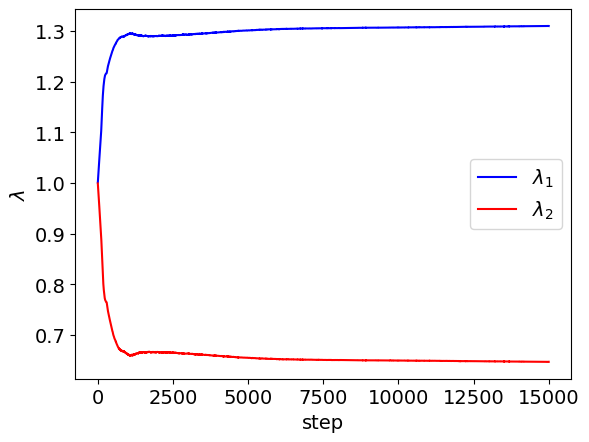

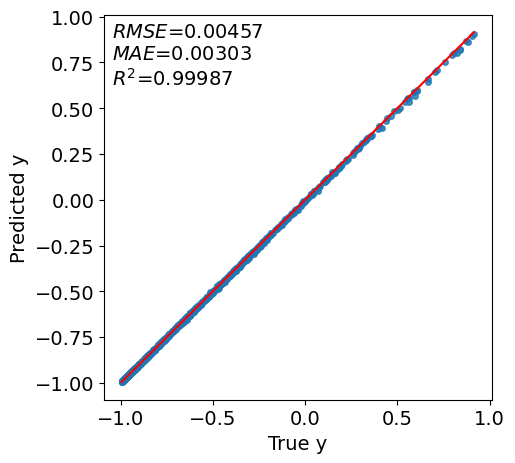

In [4]:
n_experiments = 20
l_tlmdkan_stats = []

for tlmd_alpha in [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]: # [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]
    for seed in range(n_experiments):
        print(f'\n{seed=}')
        # initialize lmdKAN with G=3
        model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=seed, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=tlmd_alpha)
        results = model.fit(dataset, opt='Adam', steps=15000, lamb = 0, batch=250, lr=1e-3) #, update_grid=False

        #rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
        rmse, mae, r2 = kan_summary_after_fit(model, dataset, results, lmdKAN=True)
        mean_cosines, std_cosines = mean_cosine_similarity_lmdkan(model, dataset) 
        
        l_tlmdkan_stats.append([rmse, mae, r2, mean_cosines, std_cosines])
        
    df_tlmdkan = pd.DataFrame(l_tlmdkan_stats, columns=['RMSE', 'MAE', 'R2', 'mean cosine', 'std cosine'])
    df_tlmdkan.to_csv(f'f1_stats_results/tlmdKAN_a{tlmd_alpha}_stats.csv', index=False)

seed=0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.96e-02 | test_loss: 7.31e-02 | reg: 1.80e+01 | : 100%|█| 15000/15000 [11:35<00:00, 2


saving model version 0.1


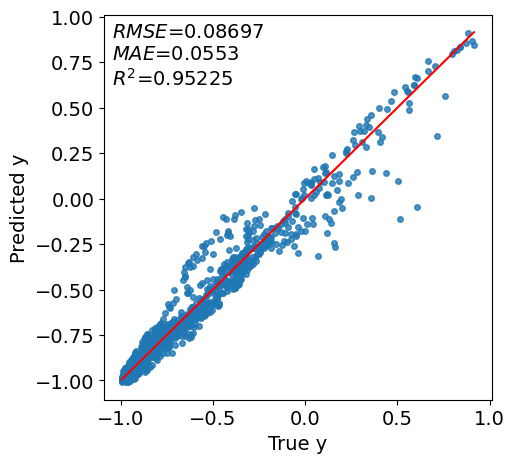

seed=1
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.28e-02 | test_loss: 5.62e-02 | reg: 2.18e+01 | : 100%|█| 15000/15000 [11:24<00:00, 2


saving model version 0.1


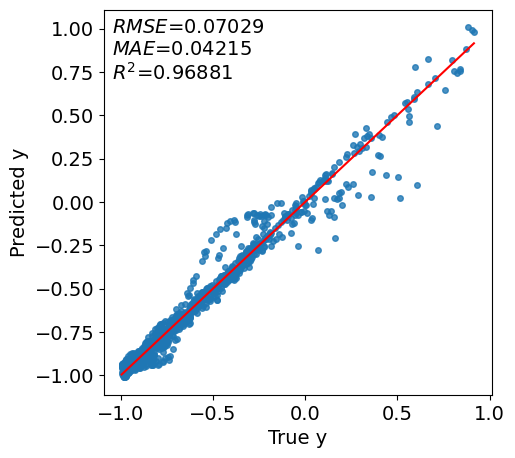

seed=2
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.18e-02 | test_loss: 6.84e-02 | reg: 2.10e+01 | : 100%|█| 15000/15000 [11:13<00:00, 2


saving model version 0.1


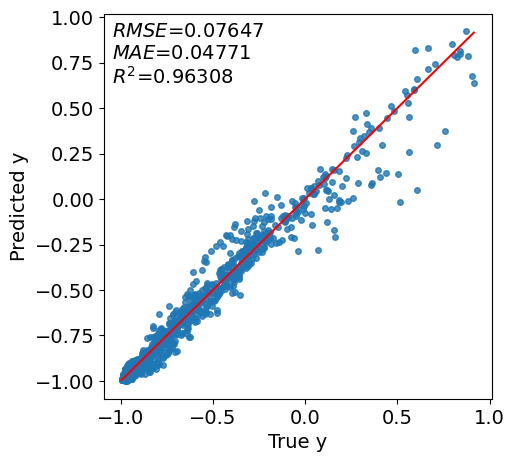

seed=3
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.00e-02 | test_loss: 7.17e-02 | reg: 2.06e+01 | : 100%|█| 15000/15000 [11:14<00:00, 2


saving model version 0.1


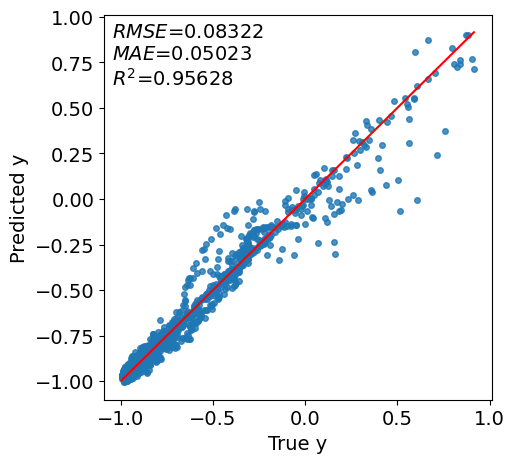

seed=4
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.29e-02 | test_loss: 6.33e-02 | reg: 2.24e+01 | : 100%|█| 15000/15000 [11:30<00:00, 2


saving model version 0.1


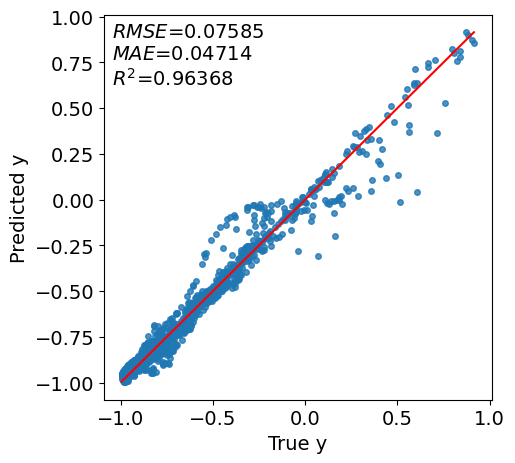

seed=5
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.60e-02 | test_loss: 5.74e-02 | reg: 2.05e+01 | : 100%|█| 15000/15000 [11:36<00:00, 2


saving model version 0.1


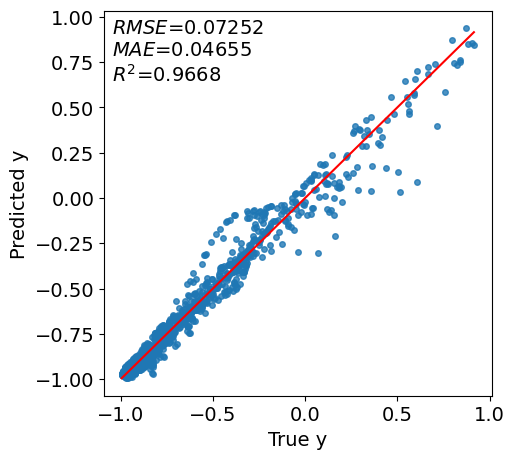

seed=6
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.31e-02 | test_loss: 5.51e-02 | reg: 2.12e+01 | : 100%|█| 15000/15000 [11:39<00:00, 2


saving model version 0.1


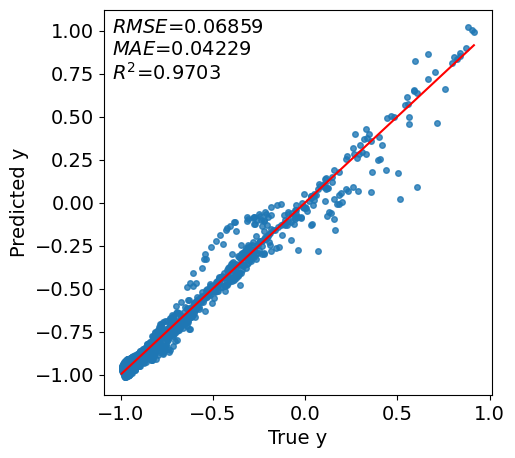

seed=7
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.93e-02 | test_loss: 6.95e-02 | reg: 1.80e+01 | : 100%|█| 15000/15000 [11:35<00:00, 2


saving model version 0.1


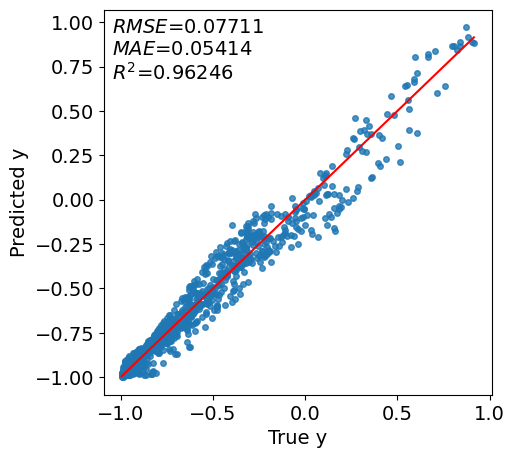

seed=8
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.27e-02 | test_loss: 5.94e-02 | reg: 1.97e+01 | : 100%|█| 15000/15000 [11:42<00:00, 2


saving model version 0.1


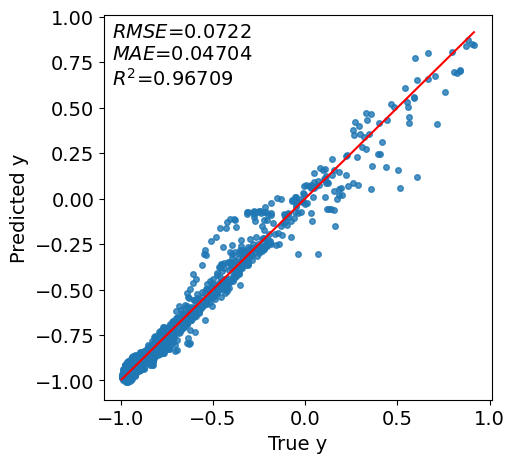

seed=9
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.53e-02 | test_loss: 6.64e-02 | reg: 1.93e+01 | : 100%|█| 15000/15000 [11:34<00:00, 2


saving model version 0.1


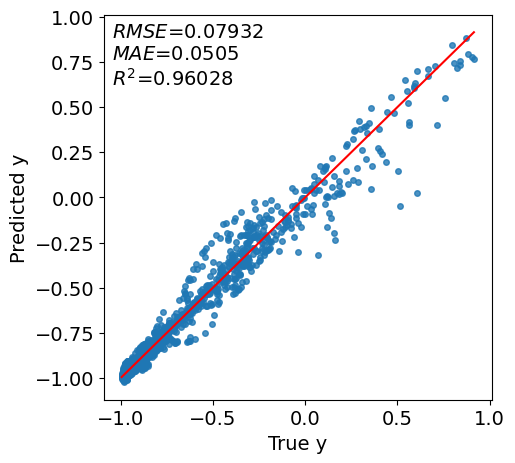

seed=10
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.92e-02 | test_loss: 6.43e-02 | reg: 2.03e+01 | : 100%|█| 15000/15000 [11:28<00:00, 2


saving model version 0.1


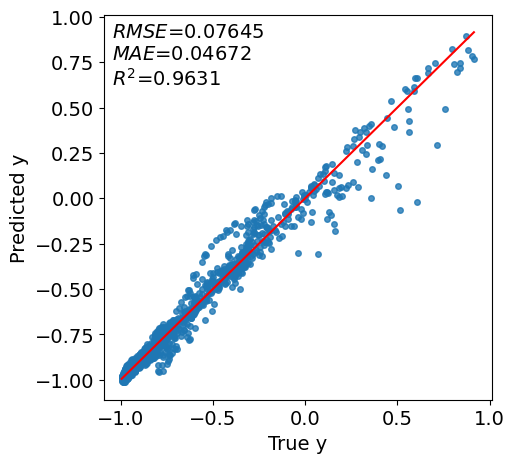

seed=11
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.61e-02 | test_loss: 5.65e-02 | reg: 2.05e+01 | : 100%|█| 15000/15000 [11:47<00:00, 2


saving model version 0.1


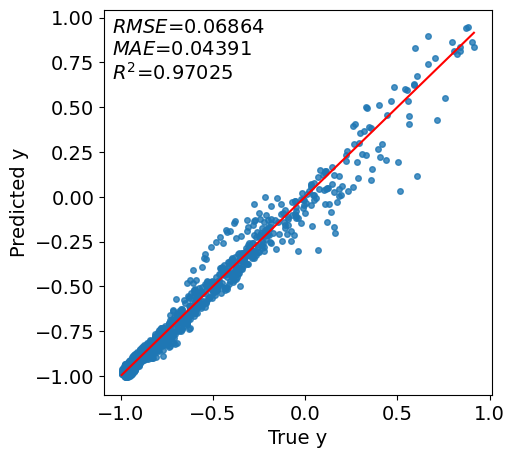

seed=12
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 7.03e-02 | test_loss: 6.27e-02 | reg: 2.15e+01 | : 100%|█| 15000/15000 [11:27<00:00, 2


saving model version 0.1


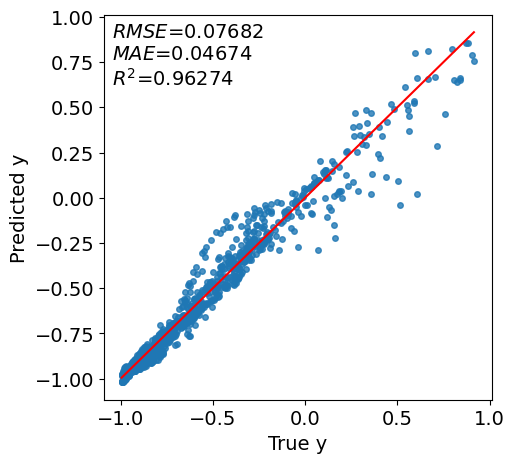

seed=13
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.14e-02 | test_loss: 5.38e-02 | reg: 2.07e+01 | : 100%|█| 15000/15000 [11:31<00:00, 2


saving model version 0.1


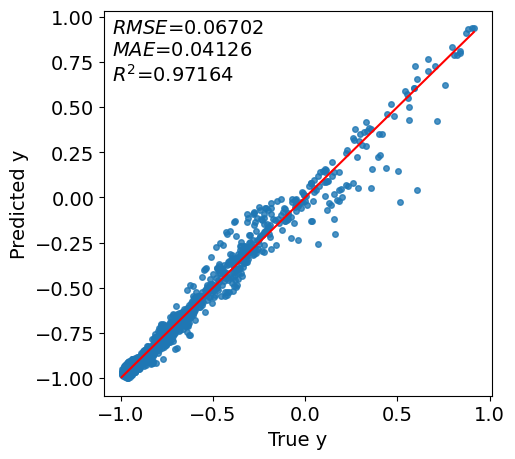

seed=14
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 8.81e-02 | test_loss: 1.10e-01 | reg: 0.00e+00 | :  52%|▌| 7739/15000 [05:51<05:29, 22


KeyboardInterrupt: 

In [5]:
n_experiments = 20
l_tlmdkan_stats = []

for tlmd_alpha in [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]: # [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]
    for seed in range(n_experiments):
        # initialize lmdKAN with G=3
        print(f'{seed=}')
        model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=seed, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=tlmd_alpha)
        results = model.fit(dataset, steps=15000, lamb = 0, update_grid=False, # , lamb = 1e-4
                        batch=250,
                        opt='Adam', lr=1e-3)

        rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
        mean_cosines, std_cosines = mean_cosine_similarity_lmdkan(model, dataset) 
        
        l_tlmdkan_stats.append([rmse, mae, r2, mean_cosines, std_cosines])
        
    df_tlmdkan = pd.DataFrame(l_tlmdkan_stats, columns=['RMSE', 'MAE', 'R2', 'mean cosine', 'std cosine'])
    #df_tlmdkan.to_csv(f'f1_stats_results/tlmdKAN_a{tlmd_alpha}_stats.csv', index=False)

In [7]:
tlmd_alpha = 1e-1# [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]
seed = 5
# initialize lmdKAN with G=3
model = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=seed, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=[1,1], tlmd_alpha=tlmd_alpha)
results = model.fit(dataset, opt='Adam', steps=150000, lamb = 0, batch=250, lr=1e-3)

rmse, mae, r2 = scatter_prediction_kan(model, dataset['test_input'], dataset['test_label'].reshape([-1,1]))
mean_cosines, std_cosines = mean_cosine_similarity_lmdkan(model, dataset) 
        
#l_tlmdkan_stats.append([rmse, mae, r2, mean_cosines, std_cosines])


checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


| train_loss: 1.90e-01 | test_loss: 2.19e-01 | reg: 0.00e+00 | :   1%| | 1300/150000 [00:53<1:41:52,


KeyboardInterrupt: 

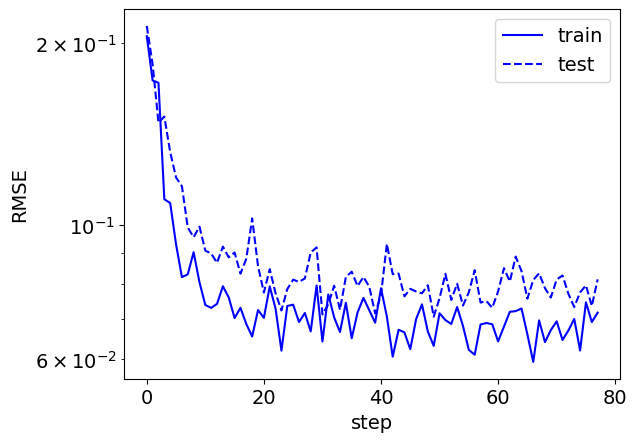

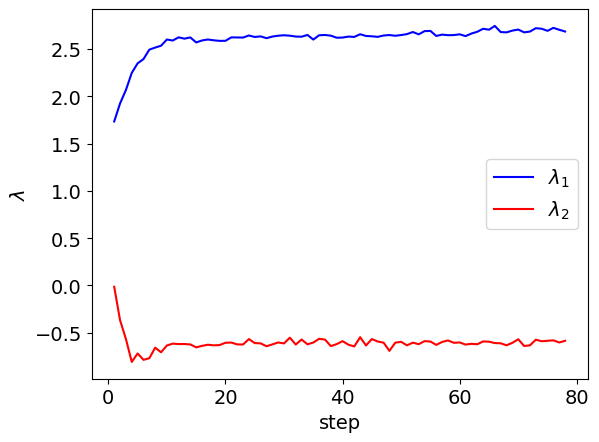

model.act_fun[0].lmd=Parameter containing:
tensor([nan, nan], requires_grad=True)


In [6]:
plt.plot(results['train_loss'], c='b')
plt.plot(results['test_loss'], '--', c='b')
plt.legend(['train', 'test'])
plt.ylabel('RMSE')
plt.xlabel('step')
plt.yscale('log')
plt.show()
plt.close()

plt.plot(np.arange(1, len(results['lmd'])+1), np.array(results['lmd'])[:,0], c='b')
plt.plot(np.arange(1, len(results['lmd'])+1), np.array(results['lmd'])[:,1], c='r')
plt.legend(['$\lambda_1$', '$\lambda_2$'])
plt.ylabel('$\lambda$')
plt.xlabel('step')
#plt.yscale('log')
plt.show()
plt.close()

print(f'{model.act_fun[0].lmd=}')

In [ ]:
df_tlmdkan = pd.DataFrame(l_tlmdkan_stats, columns=['RMSE', 'MAE', 'R2', 'mean cosine', 'std cosine'])
#df_tlmdkan.to_csv(f'f1_stats_results/tlmdKAN_a{tlmd_alpha}_stats.csv', index=False)

In [ ]:
n_experiments = 100
l_tlmdkan_stats = []
tlmd_alpha = 1

# initialize KAN
model_fitted = KAN(width=[2,5,1], grid=3, k=3, seed=2, device=device)
results = model_fitted.fit(dataset, steps=100, lamb=1e-4, update_grid=True, batch=250)

for seed in tqdm(range(n_experiments)):
    # initialize lmdKAN with G=3
    np.random.seed(seed)
    lmd_init_vector=list(np.random.random(dataset['train_input'].shape[1]))
    model_tlmdKAN = tlmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device, tlmd_type='kan', tlmd_width=[3], lmd_init_vector=lmd_init_vector, tlmd_alpha=tlmd_alpha)

    
    mean_cosines, std_cosines = mean_cosine_similarity_lmdkan_init(model_tlmdKAN, model_fitted, dataset) 
    
    l_tlmdkan_stats.append([mean_cosines, std_cosines])
    
df_tlmdkan = pd.DataFrame(l_tlmdkan_stats, columns=['mean cosine', 'std cosine'])
df_tlmdkan.to_csv(f'f1_stats_results/tlmdKAN_init_stats.csv', index=False)

checkpoint directory created: ./model
saving model version 0.0


| train_loss: 6.29e-03 | test_loss: 6.60e-03 | reg: 1.03e+01 | : 100%|█| 100/100 [00:22<00:00,  4.44


saving model version 0.1


  3%|▎         | 3/100 [00:00<00:04, 22.37it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


  9%|▉         | 9/100 [00:00<00:04, 21.78it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 12%|█▏        | 12/100 [00:00<00:04, 20.88it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 18%|█▊        | 18/100 [00:00<00:03, 22.12it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 21%|██        | 21/100 [00:00<00:03, 21.34it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 24%|██▍       | 24/100 [00:01<00:03, 20.82it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 30%|███       | 30/100 [00:01<00:03, 20.64it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 36%|███▌      | 36/100 [00:01<00:02, 21.54it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 39%|███▉      | 39/100 [00:01<00:02, 20.92it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 45%|████▌     | 45/100 [00:02<00:02, 21.80it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 48%|████▊     | 48/100 [00:02<00:02, 21.38it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 51%|█████     | 51/100 [00:02<00:03, 15.75it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 57%|█████▋    | 57/100 [00:02<00:02, 18.24it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 59%|█████▉    | 59/100 [00:02<00:02, 17.21it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 64%|██████▍   | 64/100 [00:03<00:01, 18.48it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 70%|███████   | 70/100 [00:03<00:01, 19.90it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 76%|███████▌  | 76/100 [00:03<00:01, 20.67it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 79%|███████▉  | 79/100 [00:03<00:01, 20.34it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 85%|████████▌ | 85/100 [00:04<00:00, 20.72it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 91%|█████████ | 91/100 [00:04<00:00, 20.99it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


 94%|█████████▍| 94/100 [00:04<00:00, 21.35it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


100%|██████████| 100/100 [00:05<00:00, 18.99it/s]

checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0
checkpoint directory created: ./model
saving model version 0.0


### Plotting statistics results 

В файле model_statistics.csv отсутствуют необходимые столбцы
В файле tlmdKAN_init_stats.csv отсутствуют необходимые столбцы


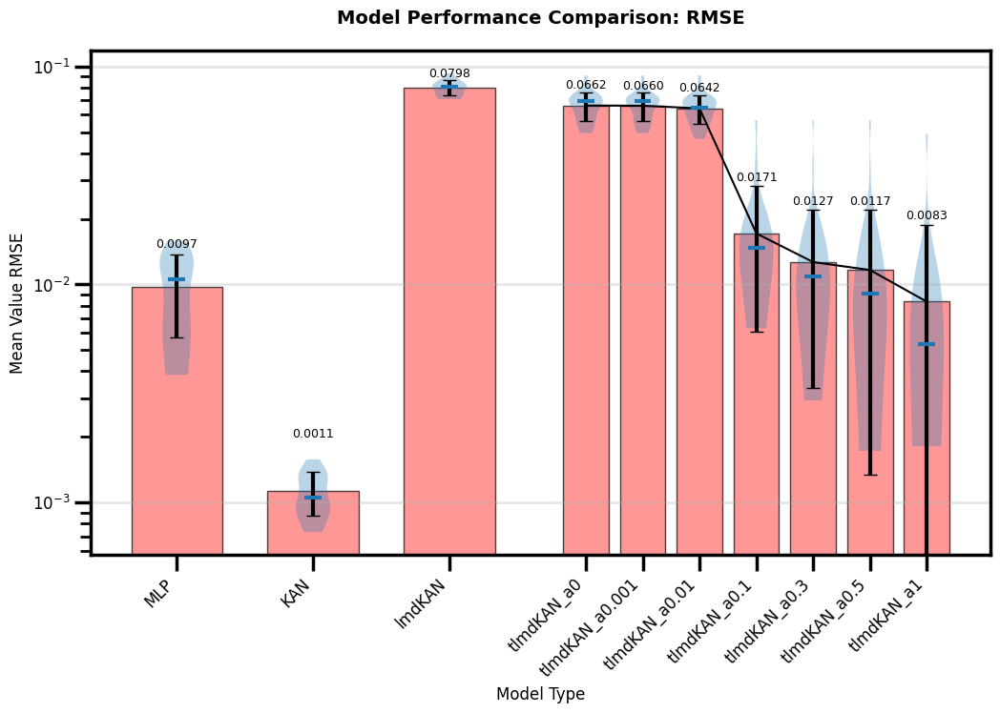

Сохранена гистограмма: f1_stats_results\model_comparison_RMSE.png


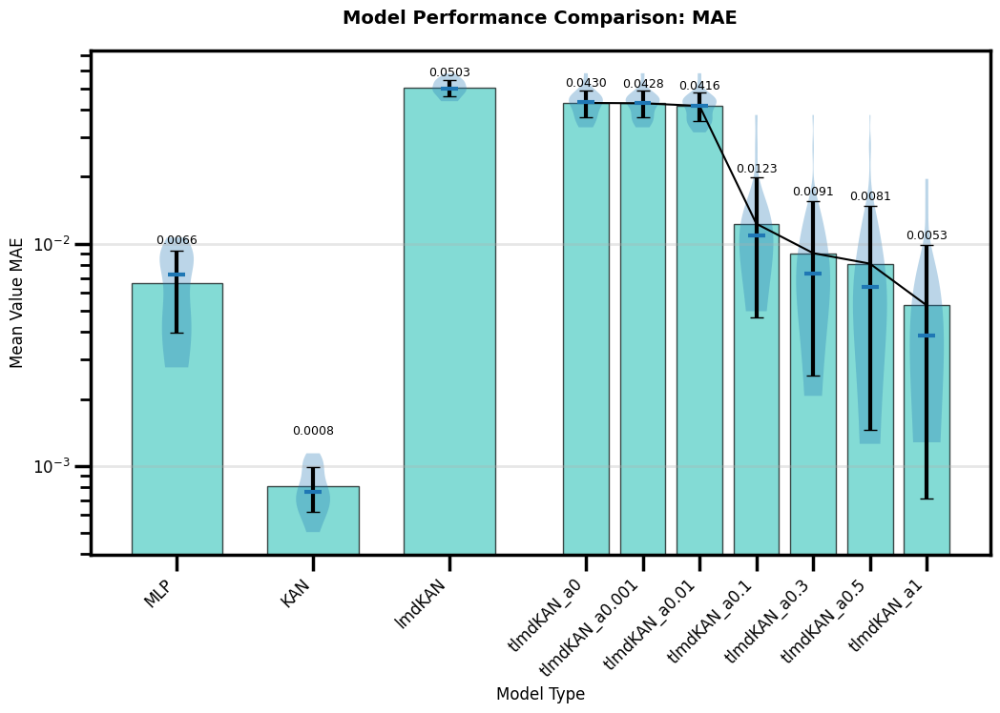

Сохранена гистограмма: f1_stats_results\model_comparison_MAE.png


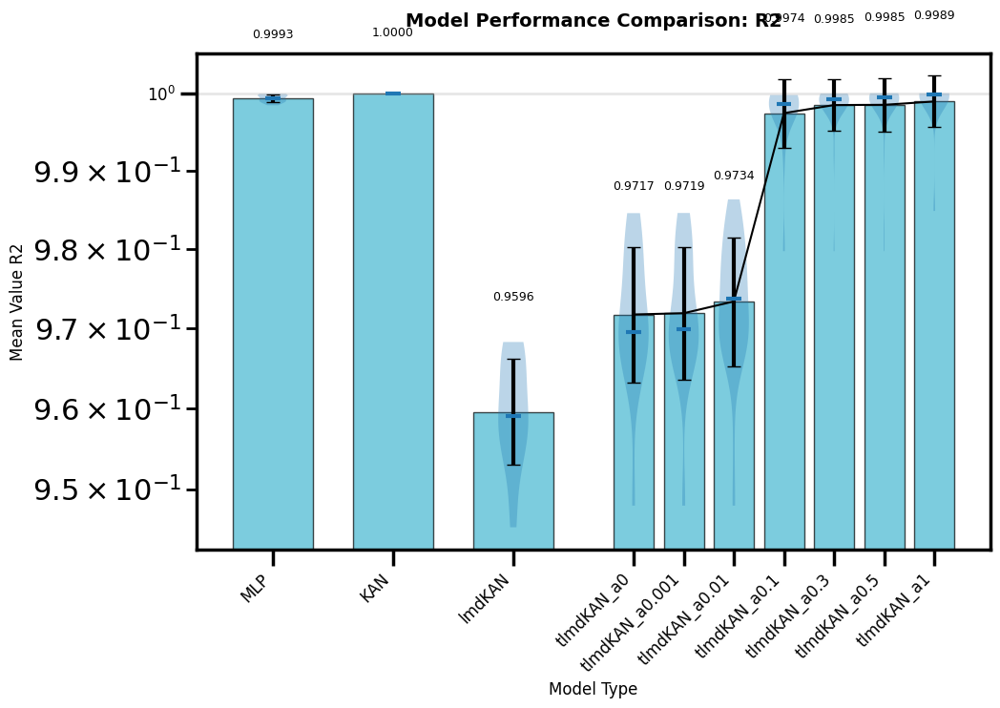

Сохранена гистограмма: f1_stats_results\model_comparison_R2.png
Статистики сохранены в f1_stats_results/model_statistics.csv


In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import re
from pathlib import Path

import seaborn as sns
sns.set_context("poster") # poster paper notebook

def process_model_stats(folder_path='f1_stats_results', lang='rus', log=False):
    """
    Обрабатывает CSV файлы с результатами моделей и создает гистограммы
    
    Args:
        folder_path (str): Путь к папке с CSV файлами
        lang (str): Язык подписей - 'rus' или 'eng'
        log (bool): Использовать логарифмическую шкалу по оси Y
    """
    
    translations = {
        'rus': {
            'title': 'Сравнение показателей качества моделей',
            'model_type': 'Тип модели',
            'mean_value': 'Среднее значение'
        },
        'eng': {
            'title': 'Model Performance Comparison',
            'model_type': 'Model Type',
            'mean_value': 'Mean Value'
        }
    }
    
    if not os.path.exists(folder_path):
        print(f"Папка {folder_path} не найдена!")
        return
    
    csv_files = glob.glob(os.path.join(folder_path, "*.csv"))
    if not csv_files:
        print(f"CSV файлы не найдены в папке {folder_path}")
        return
    
    model_data = {}
    for file_path in csv_files:
        file_name = os.path.basename(file_path)
        if 'tlmdKAN' in file_name:
            match = re.search(r'tlmdKAN_a([0-9.]+)', file_name)
            model_type = f'tlmdKAN_a{match.group(1)}' if match else 'tlmdKAN'
        elif 'MLP' in file_name.upper():
            model_type = 'MLP'
        elif 'LMDKAN' in file_name.upper():
            model_type = 'lmdKAN'
        elif 'KAN' in file_name.upper():
            model_type = 'KAN'
        else:
            model_type = os.path.splitext(file_name)[0]
        
        try:
            df = pd.read_csv(file_path)
            #print(file_name)
            #print(df, '\n')
            if not all(col in df.columns for col in ['RMSE','MAE','R2']):
                print(f"В файле {file_name} отсутствуют необходимые столбцы")
                continue
            df = df[df.R2>0.0]
            model_data[model_type] = df.copy()
        except Exception as e:
            print(f"Ошибка при чтении {file_name}: {e}")
            
    
    if not model_data:
        print("Не удалось загрузить данные из файлов")
        return
    
    def sort_models(m):
        if m == 'MLP': return (0,0)
        if m == 'KAN': return (1,0)
        if m == 'lmdKAN': return (2,0)
        if m.startswith('tlmdKAN_a'):
            a = float(re.search(r'a([0-9.]+)', m).group(1))
            return (3,a)
        return (4,0)
    
    sorted_models = sorted(model_data.keys(), key=sort_models)
    
    results = {}
    full_data = {}
    for m in sorted_models:
        df = model_data[m]
        stats = {}
        full_data[m] = {}
        for metric in ['RMSE','MAE','R2']:
            stats[metric] = {
                'mean': df[metric].mean(),
                'std': df[metric].std()
            }
            full_data[m][metric] = df[metric].copy()
        results[m] = stats
    
    trans = translations.get(lang, translations['rus'])
    metrics = ['RMSE','MAE','R2']
    colors = ['#FF6B6B','#4ECDC4','#45B7D1']
    
    for i, metric in enumerate(metrics):
        fig, ax = plt.subplots(figsize=(11,8))
        
        models = sorted_models
        means = [results[m][metric]['mean'] for m in models]
        stds  = [results[m][metric]['std']  for m in models]
        
        widths = []
        positions = []
        pos = 0
        for m in models:
            if m.startswith('tlmdKAN_a'):
                widths.append(0.4)    # узкая ширина (0.8/2)
                positions.append(pos)
                pos += 0.5
            else:
                widths.append(0.8)
                positions.append(pos)
                pos += 1.2
        
        # Столбчатая диаграмма
        bars = ax.bar(positions, means, width=widths, yerr=stds, capsize=5,
                      color=colors[i], alpha=0.7, edgecolor='black', linewidth=1)
        
        # Ломаная линия для tlmdKAN_a
        tlmd_positions = [p for p, m in zip(positions, models) if m.startswith('tlmdKAN_a')]
        tlmd_means     = [mu for mu, m in zip(means,    models) if m.startswith('tlmdKAN_a')]
        if tlmd_positions:
            ax.plot(tlmd_positions, tlmd_means, color='black', linewidth=1.5)
            
        violin_data = []
        for m in models:
            violin_data.append(full_data[m][metric])
            
        ax.violinplot(
            violin_data, positions=positions, widths=0.3,
            showmeans=False, showmedians=True, showextrema=False
        )
        
        ax.set_title(f'{trans["title"]}: {metric}', fontsize=14, fontweight='bold', pad=20)
        ax.set_xlabel(trans['model_type'], fontsize=12)
        ax.set_ylabel(f'{trans["mean_value"]} {metric}', fontsize=12)
        ax.grid(axis='y', alpha=0.3)
        if log:
            ax.set_yscale('log')
            
        
        ax.set_xticks(positions)
        ax.set_xticklabels(models, rotation=45, ha='right')
        ax.tick_params(axis='both', labelsize=12)
        
        
        for p, bar, mu, sd in zip(positions, bars, means, stds):
            h = bar.get_height()
            ax.text(p, h + sd + max(means)*0.007, f'{mu:.4f}', ha='center', va='bottom', fontsize=9)
        
        plt.tight_layout()
        image_path = os.path.join(folder_path, f'model_comparison_{metric}.png')
        plt.savefig(image_path, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"Сохранена гистограмма: {image_path}")
    
    # Сохранение CSV результатов
    rows = []
    for m in sorted_models:
        for metric in ['RMSE','MAE','R2']:
            rows.append({
                'Model': m,
                'Metric': metric,
                'Mean': results[m][metric]['mean'],
                'Std':  results[m][metric]['std']
            })
    pd.DataFrame(rows).to_csv(os.path.join(folder_path,'model_statistics.csv'), index=False)
    print(f"Статистики сохранены в {folder_path}/model_statistics.csv")
    
    return results

if __name__ == "__main__":
    process_model_stats('f1_stats_results', lang='eng', log=True)

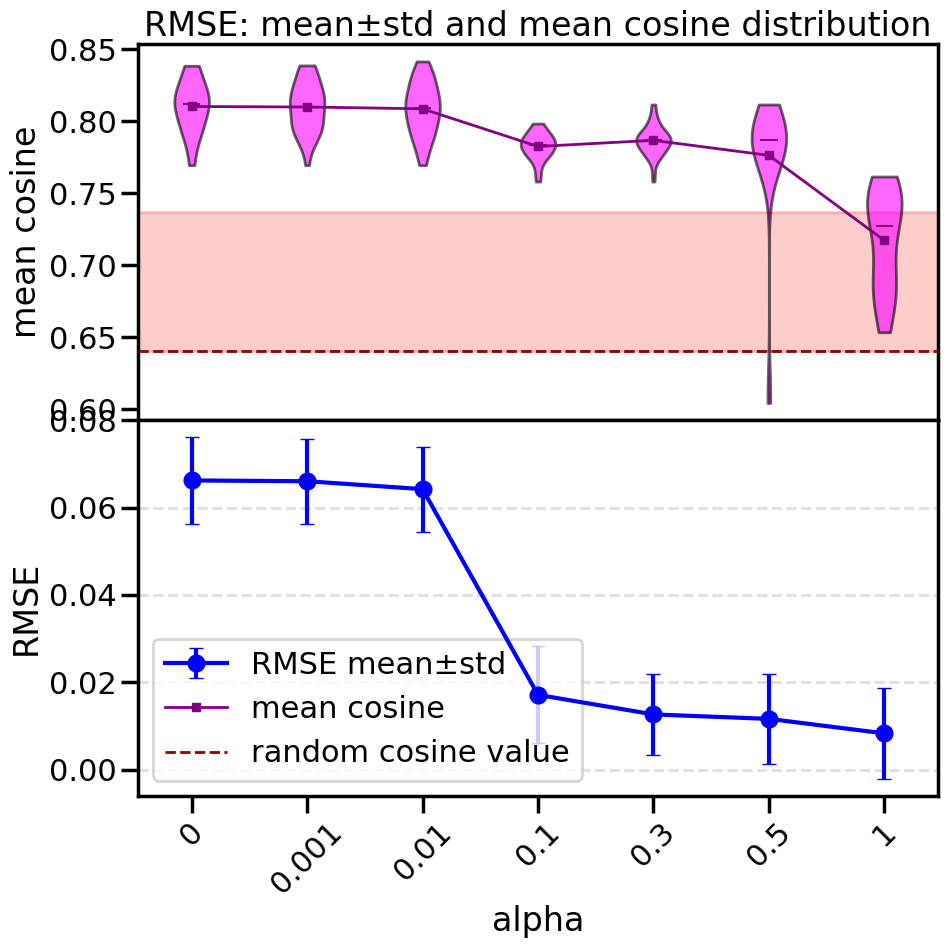

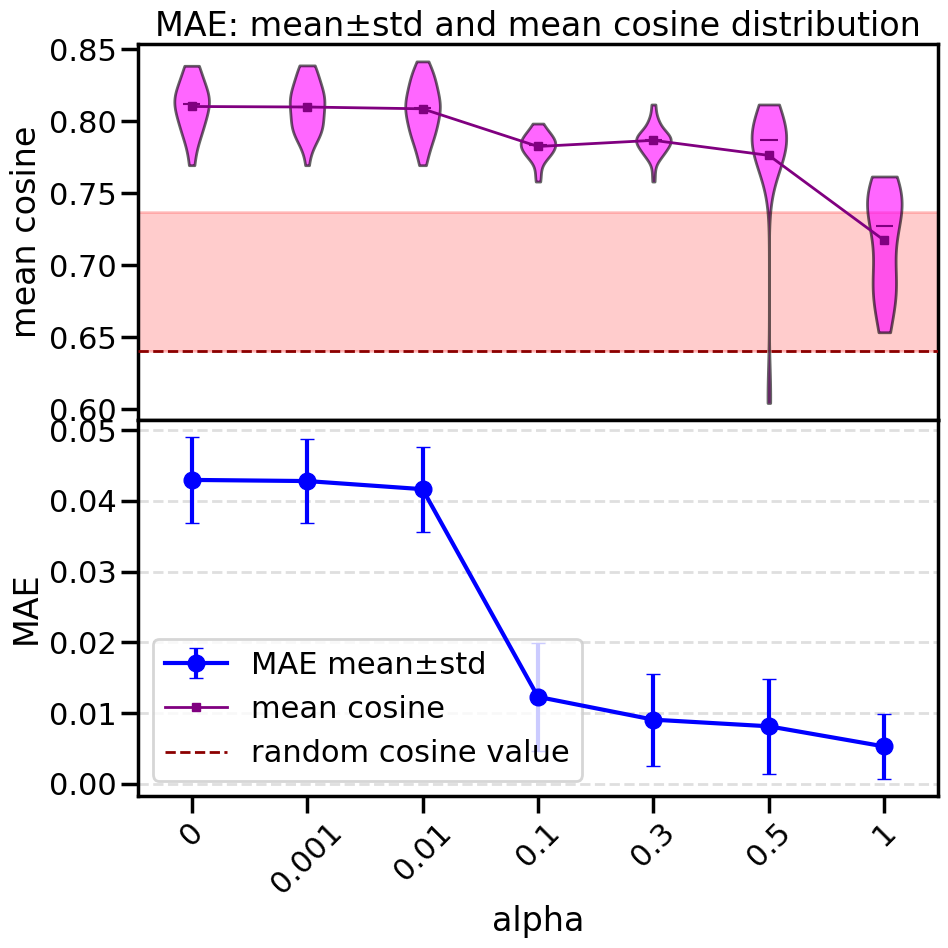

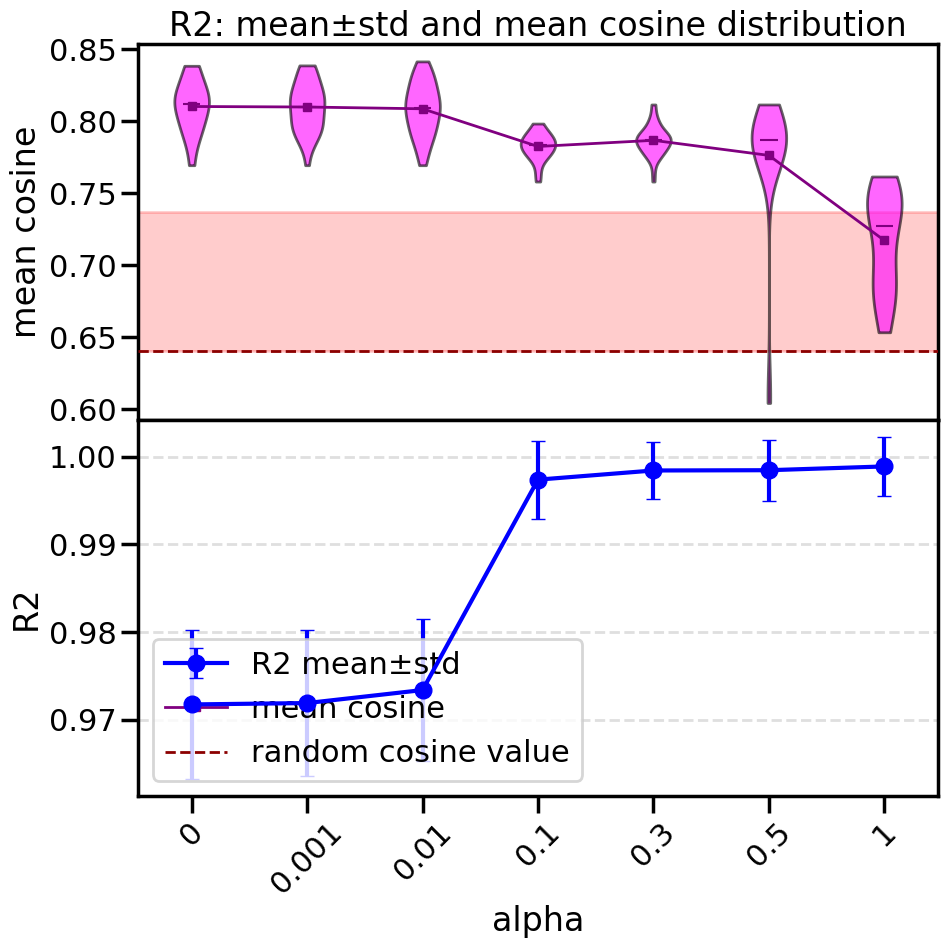

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os


def detailed_tlmdkan_analysis(folder_path='f1_stats_results'):
    """
    Читает файлы f'tlmdKAN_a{alpha}_stats.csv' для заданных alpha,
    загружает tlmdKAN_init_stats.csv и считает для mean cosine её среднее и std,
    строит для каждой метрики (RMSE, MAE, R2):
      - правый y-axis: violinplot для mean cosine (zorder=1)
      - ломаную линию mean cosine (zorder=4)
      - горизонтальную пунктирную линию init mean cosine (dark red)
        и фон ±std (красный)
      - линию mean±std для метрики (zorder=5)
    Легенда в правом верхнем углу.
    """
    alphas = [0, 1e-3, 1e-2, 1e-1, 0.3, 0.5, 1]
    filenames = [f"tlmdKAN_a{alpha}_stats.csv" for alpha in alphas]

    # Загрузка init-статистик
    init_path = os.path.join(folder_path, 'tlmdKAN_init_stats.csv')
    if not os.path.exists(init_path):
        raise FileNotFoundError(f"Файл не найден: {init_path}")
    init_df = pd.read_csv(init_path)
    init_mean_cos = init_df['mean cosine'].mean()
    init_std_cos = init_df['mean cosine'].std()

    # Загружаем данные по alpha
    data = {}
    for alpha, fname in zip(alphas, filenames):
        path = os.path.join(folder_path, fname)
        if os.path.exists(path):
            df = pd.read_csv(path)
            df = df[df.R2>0.0]
            data[alpha] = df.copy()
            
            #print(path)
            #df.MAE.hist(bins=50)
            #plt.show()
        else:
            print(f"Файл не найден: {path}")

    required = ['RMSE', 'MAE', 'R2', 'mean cosine', 'std cosine']
    for alpha, df in data.items():
        for col in required:
            if col not in df.columns:
                raise ValueError(f"В файле tlmdKAN_a{alpha}_stats.csv отсутствует '{col}'")

    metrics = ['RMSE', 'MAE', 'R2']
    for metric in metrics:
        #fig, ax = plt.subplots(figsize=(10, 6))
        fig, (ax2, ax) = plt.subplots(2, 1, figsize=(10, 10), sharex=True,
                            gridspec_kw={'height_ratios': [1, 1], 'hspace': 0})

        positions = list(range(len(alphas)))

        # Правый y-axis: violinplot для mean cosine (нижний слой)
        #ax2 = ax.twinx()
        violin_data = [data[a]['mean cosine'] for a in alphas if a in data]
        parts = ax2.violinplot(
            violin_data, positions=positions, widths=0.3,
            showmeans=False, showmedians=True, showextrema=False
        )
        for pc in parts['bodies']:
            pc.set_facecolor('magenta')
            pc.set_edgecolor('black')
            pc.set_alpha(0.6)
            pc.set_zorder(1)
        parts['cmedians'].set_color('purple')
        parts['cmedians'].set_linewidth(1.5)
        parts['cmedians'].set_zorder(2)
        ax2.set_ylabel('mean cosine')

        # Ломаная линия mean cosine (поверх)
        mean_cos = [data[a]['mean cosine'].mean() for a in alphas if a in data]
        ax2.plot(
            positions, mean_cos,
            color='purple', linestyle='-', linewidth=2,
            marker='s', markersize=6, label='mean cosine',
            zorder=4
        )

        # Init mean cosine: горизонтальная пунктирная линия и фон ±std
        ax2.axhspan(
            init_mean_cos,
            init_mean_cos + init_std_cos,
            color='red', alpha=0.2, zorder=0
        )
        ax2.axhline(
            init_mean_cos,
            color='darkred', linestyle='--', linewidth=2,
            label='random cosine value', zorder=3
        )

        # Основная метрика: mean±std поверх всего
        means = [data[a][metric].mean() for a in alphas if a in data]
        stds  = [data[a][metric].std()  for a in alphas if a in data]
        ax.errorbar(
            positions, means, yerr=stds,
            fmt='-o', color='blue', ecolor='blue', capsize=5,
            label=f'{metric} mean±std', zorder=5
        )

        # Оформление
        ax.set_xticks(positions)
        ax.set_xticklabels(alphas, rotation=45)
        ax.set_xlabel('alpha')
        ax.set_ylabel(metric)
        ax2.set_title(f'{metric}: mean±std and mean cosine distribution')
        ax.grid(axis='y', linestyle='--', alpha=0.4)

        # Легенда справа вверху
        lines1, labels1 = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax.legend(lines1 + lines2, labels1 + labels2, loc='lower left')

        plt.tight_layout()
        out_fname = f'tlmdKAN_{metric}_detailed.png'
        plt.savefig(os.path.join(folder_path, out_fname), dpi=300)
        plt.show()


if __name__ == "__main__":
    detailed_tlmdkan_analysis('f1_stats_results')

## _Bellow presented code, which was not used in main experiments._

-----
-----
### $\lambda$-KAN on $f_1$ with __R2 regression__ in respect to __Interm. activations__

In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

In [ ]:
importance_analyse_lmdKAN(model, dataset)

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_1$ with __Entropy regression__ in respect to __Interm. activations__

In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

In [ ]:
importance_analyse_lmdKAN(model, dataset)

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_1$ with __R2 regression__ in respect to __Final activations__

In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

In [ ]:
importance_analyse_lmdKAN(model, dataset)

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_1$ with __Entropy regression__ in respect to __Final activations__

In [ ]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

In [ ]:
importance_analyse_lmdKAN(model, dataset)

In [ ]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

In [ ]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')